<img src = "https://www.bits-pilani.ac.in/wp-content/uploads/BITS_Pilani_campus_logo.gif"> 
<h1 style="color: #1F618D;"><center> “Time Series Forecasting in Stock Market: Advanced Machine Learning Strategies with Neural Network and Other Statistical Algorithms for Improved Predictive Accuracy”</h1>

<h3 style="color: #148F77;"><center>M. Tech. - Data Science and Engineeting</h3>
<h4 style="color: #148F77;"><center>Second Semester (AY 2022-2023)</h4>

<h3 style="text-align:left">Submission Details: </h3>
<table align="left">
  <tr>
    <th>Name</th>
    <td> Swapnil Tiwari</td>
  </tr>
  <tr>
    <th>BITS ID No</th>
    <td>2021C104116</td>
  </tr>
   <th>Course Code</th>
    <td>S2-22_DSECCZG628T<td>
  <tr>
</table>

In [83]:
# Install required Libraries
!pip install pandas_datareader

In [84]:
# Install required Libraries
!pip install yfinance --upgrade --no-cache-dir

In [85]:
## Import Libraries and set information
from pandas_datareader import data as pdr
from datetime import date

import sys
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from numpy import array
import math
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Dense, LSTM, GRU, Dropout, concatenate
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.backend import square, mean
from keras.utils import plot_model
import yfinance as yf

yf.pdr_override()

# Get Current Date
today = date.today()
currentDate = today.strftime("%Y-%m-%d")

# Set Info
start_date = '2010-01-01'
end_date = currentDate
stockName = ['AAPL','MSFT','GOOGL','AMZN']
np.set_printoptions(threshold=sys.maxsize)

In [86]:
# Data AAPL
stock_aapl = pdr.get_data_yahoo(stockName[0], start_date, end_date)
stock_aapl

[*********************100%%**********************]  1 of 1 completed


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2010-01-04,7.622500,7.660714,7.585000,7.643214,6.487534,493729600
2010-01-05,7.664286,7.699643,7.616071,7.656429,6.498751,601904800
2010-01-06,7.656429,7.686786,7.526786,7.534643,6.395379,552160000
2010-01-07,7.562500,7.571429,7.466071,7.520714,6.383556,477131200
2010-01-08,7.510714,7.571429,7.466429,7.570714,6.425996,447610800
...,...,...,...,...,...,...
2023-09-22,174.669998,177.080002,174.050003,174.789993,174.789993,56663000
2023-09-25,174.199997,176.970001,174.149994,176.080002,176.080002,46172700
2023-09-26,174.820007,175.199997,171.660004,171.960007,171.960007,64588900


In [87]:
# Data MSFT
stock_msft = pdr.get_data_yahoo(stockName[1], start_date, end_date)
stock_msft

[*********************100%%**********************]  1 of 1 completed


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2010-01-04,30.620001,31.100000,30.590000,30.950001,23.522560,38409100
2010-01-05,30.850000,31.100000,30.639999,30.959999,23.530169,49749600
2010-01-06,30.879999,31.080000,30.520000,30.770000,23.385765,58182400
2010-01-07,30.629999,30.700001,30.190001,30.450001,23.142559,50559700
2010-01-08,30.280001,30.879999,30.240000,30.660000,23.302160,51197400
...,...,...,...,...,...,...
2023-09-22,321.320007,321.450012,316.149994,317.010010,317.010010,21429700
2023-09-25,316.589996,317.670013,315.000000,317.540009,317.540009,17836000
2023-09-26,315.130005,315.880005,310.019989,312.140015,312.140015,26297600


In [88]:
# Data GOOGL
stock_googl = pdr.get_data_yahoo(stockName[2], start_date, end_date)
stock_googl

[*********************100%%**********************]  1 of 1 completed


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2010-01-04,15.689439,15.753504,15.621622,15.684434,15.684434,78169752
2010-01-05,15.695195,15.711712,15.554054,15.615365,15.615365,120067812
2010-01-06,15.662162,15.662162,15.174174,15.221722,15.221722,158988852
2010-01-07,15.250250,15.265265,14.831081,14.867367,14.867367,256315428
2010-01-08,14.814815,15.096346,14.742492,15.065566,15.065566,188783028
...,...,...,...,...,...,...
2023-09-22,130.759995,132.029999,129.600006,130.250000,130.250000,26385200
2023-09-25,129.830002,131.169998,128.960007,131.110001,131.110001,20094600
2023-09-26,129.770004,130.360001,127.220001,128.570007,128.570007,25718700


In [89]:
# Data AMZN
stock_amzn = pdr.get_data_yahoo(stockName[3], start_date, end_date)
stock_amzn

[*********************100%%**********************]  1 of 1 completed


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2010-01-04,6.812500,6.830500,6.657000,6.695000,6.695000,151998000
2010-01-05,6.671500,6.774000,6.590500,6.734500,6.734500,177038000
2010-01-06,6.730000,6.736500,6.582500,6.612500,6.612500,143576000
2010-01-07,6.600500,6.616000,6.440000,6.500000,6.500000,220604000
2010-01-08,6.528000,6.684000,6.451500,6.676000,6.676000,196610000
...,...,...,...,...,...,...
2023-09-22,131.110001,132.029999,128.520004,129.119995,129.119995,59859500
2023-09-25,129.360001,131.779999,128.770004,131.270004,131.270004,46017800
2023-09-26,130.119995,130.389999,125.279999,125.980003,125.980003,73048200


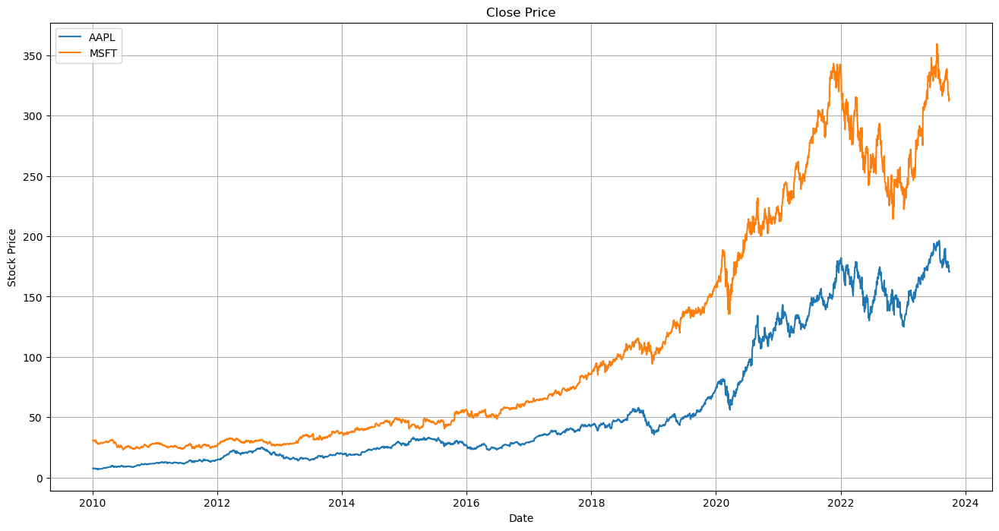

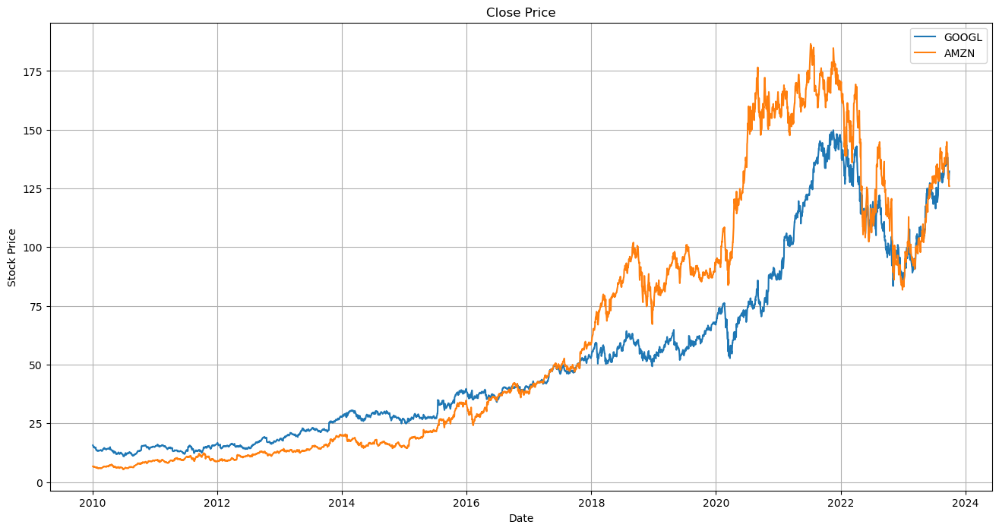

In [90]:
# Visualization data

#close
plt.figure(figsize=(16,8))
plt.title('Close Price')
plt.plot(stock_aapl['Close'])
plt.plot(stock_msft['Close'])

plt.xlabel('Date')
plt.ylabel('Stock Price')
plt.legend(['AAPL','MSFT'])
plt.grid()

currentFig = plt.gcf()
currentFig.set_facecolor('white')
plt.show()

#close
plt.figure(figsize=(16,8))
plt.title('Close Price')
plt.plot(stock_googl['Close'])
plt.plot(stock_amzn['Close'])

plt.xlabel('Date')
plt.ylabel('Stock Price')
plt.legend(['GOOGL','AMZN'])
plt.grid()

currentFig = plt.gcf()
currentFig.set_facecolor('white')
plt.show()

In [224]:
import matplotlib.pyplot as plt

# Assuming stock_aapl, stock_msft, stock_googl, and stock_amzn are DataFrames with a 'Date' column and a 'Close' column

plt.figure(figsize=(16, 8))

# Plotting close prices for AAPL and MSFT
plt.plot(stock_aapl['Date'], stock_aapl['Close'], label='AAPL')
plt.plot(stock_msft['Date'], stock_msft['Close'], label='MSFT')

# Plotting close prices for GOOGL and AMZN
plt.plot(stock_googl['Date'], stock_googl['Close'], label='GOOGL')
plt.plot(stock_amzn['Date'], stock_amzn['Close'], label='AMZN')

plt.title('Close Price')
plt.xlabel('Date')
plt.ylabel('Stock Price')
plt.legend()
plt.grid()

currentFig = plt.gcf()
currentFig.set_facecolor('white')

plt.show()


KeyError: 'Date'

<Figure size 1600x800 with 0 Axes>

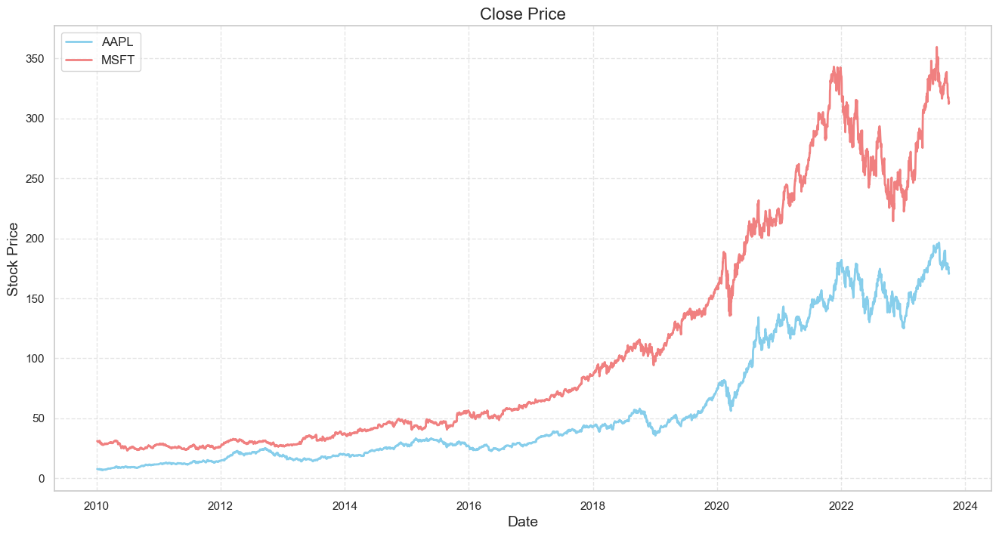

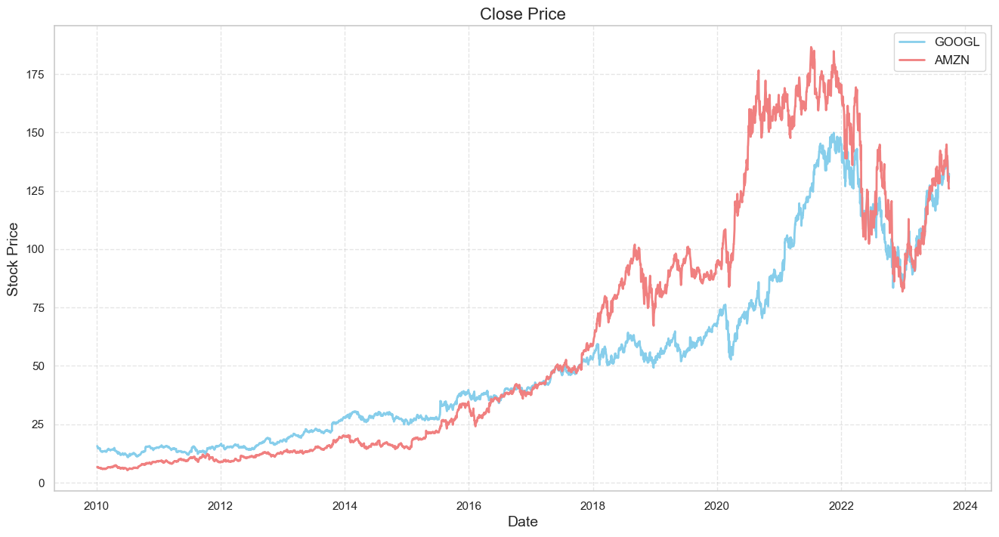

In [222]:
import matplotlib.pyplot as plt
import seaborn as sns

# Set Seaborn style
sns.set(style="whitegrid", palette="pastel")

# Function to plot close price
def plot_close_price(stock1, stock2, stock1_name, stock2_name):
    plt.figure(figsize=(16, 8))
    plt.title('Close Price', fontsize=16)
    
    # Plot close prices for each stock
    plt.plot(stock1['Close'], label=stock1_name, color='skyblue', linewidth=2)
    plt.plot(stock2['Close'], label=stock2_name, color='lightcoral', linewidth=2)

    plt.xlabel('Date', fontsize=14)
    plt.ylabel('Stock Price', fontsize=14)
    
    # Add legend with larger font size
    plt.legend(fontsize=12)

    # Add grid lines with a lighter color
    plt.grid(True, linestyle='--', alpha=0.5)

    # Set background color
    current_fig = plt.gcf()
    current_fig.set_facecolor('white')

    # Show plot
    plt.show()

# Example usage
plot_close_price(stock_aapl, stock_msft, 'AAPL', 'MSFT',)
plot_close_price(stock_googl, stock_amzn, 'GOOGL', 'AMZN')


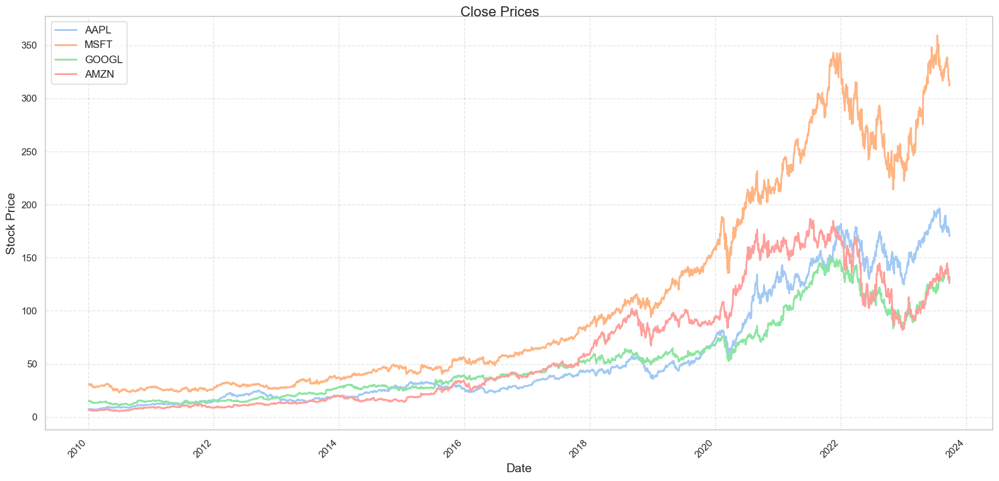

In [223]:
import matplotlib.pyplot as plt
import seaborn as sns

# Set Seaborn style
sns.set(style="whitegrid", palette="pastel")

# Function to plot close prices for multiple stocks
def plot_close_prices(stocks, stock_names):
    plt.figure(figsize=(16, 8))
    plt.suptitle('Close Prices', fontsize=16, y=0.95)  # Move title higher
    
    for stock, stock_name in zip(stocks, stock_names):
        # Plot close prices for each stock
        plt.plot(stock['Close'], label=stock_name, linewidth=2)

    plt.xlabel('Date', fontsize=14)
    plt.ylabel('Stock Price', fontsize=14)
    
    # Add legend with larger font size
    plt.legend(fontsize=12)

    # Add grid lines with a lighter color
    plt.grid(True, linestyle='--', alpha=0.5)

    # Format date ticks for better readability (example format)
    plt.xticks(rotation=45, ha="right")
    
    # Set background color
    current_fig = plt.gcf()
    current_fig.set_facecolor('white')

    # Adjust layout for better spacing
    plt.tight_layout()

    # Show plot
    plt.show()

# Example usage with four stocks
plot_close_prices([stock_aapl, stock_msft, stock_googl, stock_amzn], ['AAPL', 'MSFT', 'GOOGL', 'AMZN'])


In [91]:
# Extract Clossing price
data_aapl = stock_aapl.filter(['Close'])
dataset_aapl = data_aapl.values
# Extract Clossing price
data_msft = stock_msft.filter(['Close'])
dataset_msft = data_msft.values
# Extract Clossing price
data_googl = stock_googl.filter(['Close'])
dataset_googl = data_googl.values
# Extract Clossing price
data_amzn = stock_amzn.filter(['Close'])
dataset_amzn = data_amzn.values

In [92]:
# Rename column
data_aapl.rename(columns={'Close': 'Close_aapl'}, inplace=True)
data_msft.rename(columns={'Close': 'Close_msft'}, inplace=True)
data_amzn.rename(columns={'Close': 'Close_amzn'}, inplace=True)
data_googl.rename(columns={'Close': 'Close_googl'}, inplace=True)

In [93]:
# Preprocess the data AAPL
normalizer = MinMaxScaler(feature_range=(0,1)) # instantiate scaler
normalizedData_aapl = normalizer.fit_transform(dataset_aapl) # values between 0,1
print(normalizedData_aapl)

[[4.13671951e-03]
 [4.20641999e-03]
 [3.56406040e-03]
 [3.49058981e-03]
 [3.75431632e-03]
 [3.40205891e-03]
 [2.95183652e-03]
 [3.50377638e-03]
 [3.27396073e-03]
 [2.61464697e-03]
 [4.33074554e-03]
 [3.70722643e-03]
 [3.01776689e-03]
 [1.07373646e-03]
 [2.07589368e-03]
 [2.61653077e-03]
 [2.98197978e-03]
 [1.36383361e-03]
 [1.88128164e-06]
 [5.04842430e-04]
 [7.17706429e-04]
 [1.35253083e-03]
 [0.00000000e+00]
 [6.42354561e-04]
 [3.89933345e-04]
 [7.79871721e-04]
 [5.78307987e-04]
 [1.24704073e-03]
 [1.56916494e-03]
 [2.13805897e-03]
 [1.97794128e-03]
 [2.04952053e-03]
 [1.81216717e-03]
 [1.57669761e-03]
 [9.43757005e-04]
 [1.62191125e-03]
 [1.87433246e-03]
 [2.36787463e-03]
 [3.19107870e-03]
 [3.16470555e-03]
 [3.25512025e-03]
 [3.51507917e-03]
 [5.06729497e-03]
 [5.09178432e-03]
 [5.83398262e-03]
 [6.17682357e-03]
 [6.30114912e-03]
 [6.50836676e-03]
 [5.98845144e-03]
 [6.10335801e-03]
 [6.04119523e-03]
 [6.14103394e-03]
 [5.68893279e-03]
 [6.15987191e-03]
 [6.83990492e-03]
 [7.030165

In [94]:
# Storing the number of data points in the array
num_data_aapl = len(normalizedData_aapl)
num_days_used = 30
data_used_aapl = np.array([normalizedData_aapl[i : i + num_days_used].copy() for i in range(num_data_aapl - num_days_used)])

data_to_predict_aapl = np.array(normalizedData_aapl[(num_days_used):, :1])

# Creating a dates array for the dates that were used by data_used
dates_used_aapl = stock_aapl.index[num_days_used:num_data_aapl]

# Storing the scaler object for prediction later
y_normaliser_aapl = MinMaxScaler()
y_normaliser_aapl.fit(data_aapl[['Close_aapl']].to_numpy()[num_days_used:])

display(normalizedData_aapl.shape, data_used_aapl.shape,data_to_predict_aapl.shape, dates_used_aapl.shape)

(3458, 1)

(3428, 30, 1)

(3428, 1)

(3428,)

In [95]:
train_split = 0.8
data_size = data_used_aapl.shape[0]
num_features_aapl = data_used_aapl.shape[2]
train_size_aapl = int(data_size * train_split)
test_size_aapl = data_size - train_size_aapl

# Splitting the dataset up into train and test sets
X_train_aapl = data_used_aapl[0:train_size_aapl, :, :]
y_train_aapl = data_to_predict_aapl[0:train_size_aapl, :]
dates_train_aapl = dates_used_aapl[0:train_size_aapl]
X_test_aapl = data_used_aapl[train_size_aapl:, :, :]
y_test_aapl = data_to_predict_aapl[train_size_aapl:, :]
dates_test_aapl = dates_used_aapl[train_size_aapl:]

unscaled_y_train_aapl = data_aapl['Close_aapl'].to_numpy()[(num_days_used):][0:train_size_aapl]
unscaled_y_test_aapl = data_aapl['Close_aapl'].to_numpy()[(num_days_used):][train_size_aapl:]

display("X_train shape:", X_train_aapl.shape, "X_test shape:", X_test_aapl.shape, "y_train shape:", y_train_aapl.shape, "y_test shape:", y_test_aapl.shape)

'X_train shape:'

(2742, 30, 1)

'X_test shape:'

(686, 30, 1)

'y_train shape:'

(2742, 1)

'y_test shape:'

(686, 1)

In [96]:
# Preprocess the data msft
normalizer = MinMaxScaler(feature_range=(0,1)) # instantiate scaler
normalizedData_msft = normalizer.fit_transform(dataset_msft) # values between 0,1
print(normalizedData_msft)

[[2.35972443e-02]
 [2.36269588e-02]
 [2.30622933e-02]
 [2.21112719e-02]
 [2.27353776e-02]
 [2.15763209e-02]
 [2.09819296e-02]
 [2.18140762e-02]
 [2.36269588e-02]
 [2.33297688e-02]
 [2.40430349e-02]
 [2.25273423e-02]
 [2.08036145e-02]
 [1.76830689e-02]
 [1.87529709e-02]
 [1.92879219e-02]
 [1.97931528e-02]
 [1.82774602e-02]
 [1.53649555e-02]
 [1.60485015e-02]
 [1.61970965e-02]
 [1.67023273e-02]
 [1.43544938e-02]
 [1.48894448e-02]
 [1.39978579e-02]
 [1.48597246e-02]
 [1.48002844e-02]
 [1.51866404e-02]
 [1.46219693e-02]
 [1.58701864e-02]
 [1.65834525e-02]
 [1.77127891e-02]
 [1.71184035e-02]
 [1.69995230e-02]
 [1.58107461e-02]
 [1.67023273e-02]
 [1.66131726e-02]
 [1.68212078e-02]
 [1.78613897e-02]
 [1.61970965e-02]
 [1.61970965e-02]
 [1.67023273e-02]
 [1.65834525e-02]
 [1.67023273e-02]
 [1.72075582e-02]
 [1.77127891e-02]
 [1.83369004e-02]
 [1.86043759e-02]
 [1.86638162e-02]
 [1.89015716e-02]
 [1.96742723e-02]
 [1.96148377e-02]
 [1.95553974e-02]
 [1.95851175e-02]
 [2.04172585e-02]
 [1.973371

In [97]:
# Storing the number of data points in the array
num_data_msft = len(normalizedData_msft)
num_days_used = 30
data_used_msft = np.array([normalizedData_msft[i : i + num_days_used].copy() for i in range(num_data_msft - num_days_used)])

data_to_predict_msft = np.array(normalizedData_msft[(num_days_used):, :1])

# Creating a dates array for the dates that were used by data_used
dates_used_msft = stock_msft.index[num_days_used:num_data_msft]

# Storing the scaler object for prediction later
y_normaliser_msft = MinMaxScaler()
y_normaliser_msft.fit(data_msft[['Close_msft']].to_numpy()[num_days_used:])
num_features_msft = data_used_msft.shape[2]

display(normalizedData_msft.shape, data_used_msft.shape,data_to_predict_msft.shape, dates_used_msft.shape)

(3458, 1)

(3428, 30, 1)

(3428, 1)

(3428,)

In [98]:
train_split = 0.8
data_size = data_used_msft.shape[0]
num_features_msft = data_used_msft.shape[2]
train_size_msft = int(data_size * train_split)
test_size_msft = data_size - train_size_msft

# Splitting the dataset up into train and test sets
X_train_msft = data_used_msft[0:train_size_msft, :, :]
y_train_msft = data_to_predict_msft[0:train_size_msft, :]
dates_train_msft = dates_used_msft[0:train_size_msft]
X_test_msft = data_used_msft[train_size_msft:, :, :]
y_test_msft = data_to_predict_msft[train_size_msft:, :]
dates_test_msft = dates_used_msft[train_size_msft:]

unscaled_y_train_msft = data_msft['Close_msft'].to_numpy()[(num_days_used):][0:train_size_msft]
unscaled_y_test_msft = data_msft['Close_msft'].to_numpy()[(num_days_used):][train_size_msft:]

display("X_train shape:", X_train_msft.shape, "X_test shape:", X_test_msft.shape, "y_train shape:", y_train_msft.shape, "y_test shape:", y_test_msft.shape)

'X_train shape:'

(2742, 30, 1)

'X_test shape:'

(686, 30, 1)

'y_train shape:'

(2742, 1)

'y_test shape:'

(686, 1)

In [99]:
# Preprocess the data googl
normalizer = MinMaxScaler(feature_range=(0,1)) # instantiate scaler
normalizedData_googl = normalizer.fit_transform(dataset_googl) # values between 0,1
print(normalizedData_googl)

[[3.43476099e-02]
 [3.38504461e-02]
 [3.10169675e-02]
 [2.84662911e-02]
 [2.98929463e-02]
 [2.97290258e-02]
 [2.78142200e-02]
 [2.72035701e-02]
 [2.77007340e-02]
 [2.59264333e-02]
 [2.72990365e-02]
 [2.60002830e-02]
 [2.64632267e-02]
 [2.05242656e-02]
 [1.87211404e-02]
 [1.91570580e-02]
 [1.90994157e-02]
 [1.76925856e-02]
 [1.69090088e-02]
 [1.74638149e-02]
 [1.71215651e-02]
 [1.88688466e-02]
 [1.63397937e-02]
 [1.71521883e-02]
 [1.75448725e-02]
 [1.80798673e-02]
 [1.77214101e-02]
 [1.80726595e-02]
 [1.74818277e-02]
 [1.89553135e-02]
 [1.83987019e-02]
 [1.93011672e-02]
 [1.88580417e-02]
 [1.92255121e-02]
 [1.78330839e-02]
 [1.71846099e-02]
 [1.62767490e-02]
 [1.63433908e-02]
 [1.74043741e-02]
 [1.89120800e-02]
 [1.96794494e-02]
 [2.13492704e-02]
 [2.30821361e-02]
 [2.27705094e-02]
 [2.23580139e-02]
 [2.52869657e-02]
 [2.61317818e-02]
 [2.58435704e-02]
 [2.28966058e-02]
 [2.32604723e-02]
 [2.33253225e-02]
 [2.34766326e-02]
 [2.23237868e-02]
 [2.18734535e-02]
 [2.03423323e-02]
 [2.184283

In [100]:
# Storing the number of data points in the array
num_data_googl = len(normalizedData_googl)
num_days_used = 30
data_used_googl = np.array([normalizedData_googl[i : i + num_days_used].copy() for i in range(num_data_googl - num_days_used)])

data_to_predict_googl = np.array(normalizedData_googl[(num_days_used):, :1])

# Creating a dates array for the dates that were used by data_used
dates_used_googl = stock_googl.index[num_days_used:num_data_googl]

# Storing the scaler object for prediction later
y_normaliser_googl = MinMaxScaler()
y_normaliser_googl.fit(data_googl[['Close_googl']].to_numpy()[num_days_used:])
num_features_googl = data_used_googl.shape[2]

display(normalizedData_googl.shape, data_used_googl.shape,data_to_predict_googl.shape, dates_used_googl.shape)

(3458, 1)

(3428, 30, 1)

(3428, 1)

(3428,)

In [101]:
train_split = 0.8
data_size = data_used_googl.shape[0]
num_features_googl = data_used_googl.shape[2]
train_size_googl = int(data_size * train_split)
test_size_googl = data_size - train_size_googl

# Splitting the dataset up into train and test sets
X_train_googl = data_used_googl[0:train_size_googl, :, :]
y_train_googl = data_to_predict_googl[0:train_size_googl, :]
dates_train_googl = dates_used_googl[0:train_size_googl]
X_test_googl = data_used_googl[train_size_googl:, :, :]
y_test_googl = data_to_predict_googl[train_size_googl:, :]
dates_test_googl = dates_used_googl[train_size_googl:]

unscaled_y_train_googl = data_googl['Close_googl'].to_numpy()[(num_days_used):][0:train_size_googl]
unscaled_y_test_googl = data_googl['Close_googl'].to_numpy()[(num_days_used):][train_size_googl:]

display("X_train shape:", X_train_googl.shape, "X_test shape:", X_test_googl.shape, "y_train shape:", y_train_googl.shape, "y_test shape:", y_test_googl.shape)

'X_train shape:'

(2742, 30, 1)

'X_test shape:'

(686, 30, 1)

'y_train shape:'

(2742, 1)

'y_test shape:'

(686, 1)

In [102]:
# Preprocess the data amzn
normalizer = MinMaxScaler(feature_range=(0,1)) # instantiate scaler
normalizedData_amzn = normalizer.fit_transform(dataset_amzn) # values between 0,1
print(normalizedData_amzn)

[[6.98078929e-03]
 [7.19885135e-03]
 [6.52534056e-03]
 [5.90427291e-03]
 [6.87589775e-03]
 [5.98984247e-03]
 [5.17279353e-03]
 [5.65860727e-03]
 [5.17279353e-03]
 [5.11482757e-03]
 [5.24456129e-03]
 [4.73942820e-03]
 [4.97129205e-03]
 [3.53869830e-03]
 [3.22954650e-03]
 [3.00044143e-03]
 [3.90305728e-03]
 [4.80843455e-03]
 [4.63729807e-03]
 [2.83206373e-03]
 [2.62504206e-03]
 [2.89554988e-03]
 [2.02329640e-03]
 [2.42354058e-03]
 [2.26896205e-03]
 [2.60019988e-03]
 [2.41525897e-03]
 [3.16881912e-03]
 [3.05012578e-03]
 [2.46218455e-03]
 [2.12542653e-03]
 [2.61399904e-03]
 [2.45942314e-03]
 [2.59467705e-03]
 [2.38213519e-03]
 [3.06668899e-03]
 [2.64712283e-03]
 [2.70233001e-03]
 [4.39715262e-03]
 [4.67042186e-03]
 [4.76979057e-03]
 [5.49850854e-03]
 [5.60340008e-03]
 [5.93463529e-03]
 [5.57855790e-03]
 [6.04504702e-03]
 [6.89245832e-03]
 [6.40664722e-03]
 [6.21618613e-03]
 [6.39836562e-03]
 [6.27415209e-03]
 [6.66611467e-03]
 [6.00088285e-03]
 [6.03400663e-03]
 [5.70001002e-03]
 [5.363254

In [103]:
# Storing the number of data points in the array
num_data_amzn = len(normalizedData_amzn)
num_days_used = 30
data_used_amzn = np.array([normalizedData_amzn[i : i + num_days_used].copy() for i in range(num_data_amzn - num_days_used)])

data_to_predict_amzn = np.array(normalizedData_amzn[(num_days_used):, :1])

# Creating a dates array for the dates that were used by data_used
dates_used_amzn = stock_amzn.index[num_days_used:num_data_amzn]

# Storing the scaler object for prediction later
y_normaliser_amzn = MinMaxScaler()
y_normaliser_amzn.fit(data_amzn[['Close_amzn']].to_numpy()[num_days_used:])
num_features_amzn = data_used_amzn.shape[2]

display(normalizedData_amzn.shape, data_used_amzn.shape,data_to_predict_amzn.shape, dates_used_amzn.shape)

(3458, 1)

(3428, 30, 1)

(3428, 1)

(3428,)

In [104]:
train_split = 0.8
data_size = data_used_amzn.shape[0]
num_features_amzn = data_used_amzn.shape[2]
train_size_amzn = int(data_size * train_split)
test_size_amzn = data_size - train_size_amzn

# Splitting the dataset up into train and test sets
X_train_amzn = data_used_amzn[0:train_size_amzn, :, :]
y_train_amzn = data_to_predict_amzn[0:train_size_amzn, :]
dates_train_amzn = dates_used_amzn[0:train_size_amzn]
X_test_amzn = data_used_amzn[train_size_amzn:, :, :]
y_test_amzn = data_to_predict_amzn[train_size_amzn:, :]
dates_test_amzn = dates_used_amzn[train_size_amzn:]

unscaled_y_train_amzn = data_amzn['Close_amzn'].to_numpy()[(num_days_used):][0:train_size_amzn]
unscaled_y_test_amzn = data_amzn['Close_amzn'].to_numpy()[(num_days_used):][train_size_amzn:]

display("X_train shape:", X_train_amzn.shape, "X_test shape:", X_test_amzn.shape, "y_train shape:", y_train_amzn.shape, "y_test shape:", y_test_amzn.shape)

'X_train shape:'

(2742, 30, 1)

'X_test shape:'

(686, 30, 1)

'y_train shape:'

(2742, 1)

'y_test shape:'

(686, 1)

In [105]:
# Concat the 4 stocks data
stock_df = pd.DataFrame()
stock_df = pd.concat([stock_df, data_aapl, data_msft, data_googl, data_amzn], axis=1)

In [106]:
stock_df

,Close_aapl,Close_msft,Close_googl,Close_amzn
Date,,,,
2010-01-04,7.643214,30.950001,15.684434,6.695000
2010-01-05,7.656429,30.959999,15.615365,6.734500
2010-01-06,7.534643,30.770000,15.221722,6.612500
2010-01-07,7.520714,30.450001,14.867367,6.500000
2010-01-08,7.570714,30.660000,15.065566,6.676000
...,...,...,...,...
2023-09-22,174.789993,317.010010,130.250000,129.119995
2023-09-25,176.080002,317.540009,131.110001,131.270004
2023-09-26,171.960007,312.140015,128.570007,125.980003


In [107]:
# Extract Clossing price
data = stock_df.filter(['Close_aapl','Close_msft','Close_googl','Close_amzn'])
dataset = data.values

In [108]:
dataset

array([[  7.64321423,  30.95000076,  15.68443394,   6.69500017],
       [  7.65642881,  30.95999908,  15.61536503,   6.73449993],
       [  7.53464317,  30.77000046,  15.22172165,   6.61250019],
       [  7.52071381,  30.45000076,  14.86736679,   6.5       ],
       [  7.570714  ,  30.65999985,  15.06556606,   6.67600012],
       [  7.50392914,  30.27000046,  15.04279327,   6.51550007],
       [  7.418571  ,  30.06999969,  14.77677727,   6.36749983],
       [  7.52321386,  30.35000038,  14.69194221,   6.45550013],
       [  7.47964287,  30.95999908,  14.76101112,   6.36749983],
       [  7.35464287,  30.86000061,  14.51451492,   6.35699987],
       [  7.67999983,  31.10000038,  14.70520496,   6.38049984],
       [  7.56178617,  30.59000015,  14.52477455,   6.28900003],
       [  7.4310708 ,  30.01000023,  14.58908939,   6.33099985],
       [  7.0625    ,  28.95999908,  13.76401424,   6.07149982],
       [  7.25250006,  29.31999969,  13.51351357,   6.01550007],
       [  7.35500002,  29

In [109]:
# Preprocess the data
normalizer = MinMaxScaler(feature_range=(0,1)) # instantiate scaler
normalizedData = normalizer.fit_transform(dataset) # values between 0,1
print(normalizedData)

[[4.13671951e-03 2.35972443e-02 3.43476099e-02 6.98078929e-03]
 [4.20641999e-03 2.36269588e-02 3.38504461e-02 7.19885135e-03]
 [3.56406040e-03 2.30622933e-02 3.10169675e-02 6.52534056e-03]
 [3.49058981e-03 2.21112719e-02 2.84662911e-02 5.90427291e-03]
 [3.75431632e-03 2.27353776e-02 2.98929463e-02 6.87589775e-03]
 [3.40205891e-03 2.15763209e-02 2.97290258e-02 5.98984247e-03]
 [2.95183652e-03 2.09819296e-02 2.78142200e-02 5.17279353e-03]
 [3.50377638e-03 2.18140762e-02 2.72035701e-02 5.65860727e-03]
 [3.27396073e-03 2.36269588e-02 2.77007340e-02 5.17279353e-03]
 [2.61464697e-03 2.33297688e-02 2.59264333e-02 5.11482757e-03]
 [4.33074554e-03 2.40430349e-02 2.72990365e-02 5.24456129e-03]
 [3.70722643e-03 2.25273423e-02 2.60002830e-02 4.73942820e-03]
 [3.01776689e-03 2.08036145e-02 2.64632267e-02 4.97129205e-03]
 [1.07373646e-03 1.76830689e-02 2.05242656e-02 3.53869830e-03]
 [2.07589368e-03 1.87529709e-02 1.87211404e-02 3.22954650e-03]
 [2.61653077e-03 1.92879219e-02 1.91570580e-02 3.000441

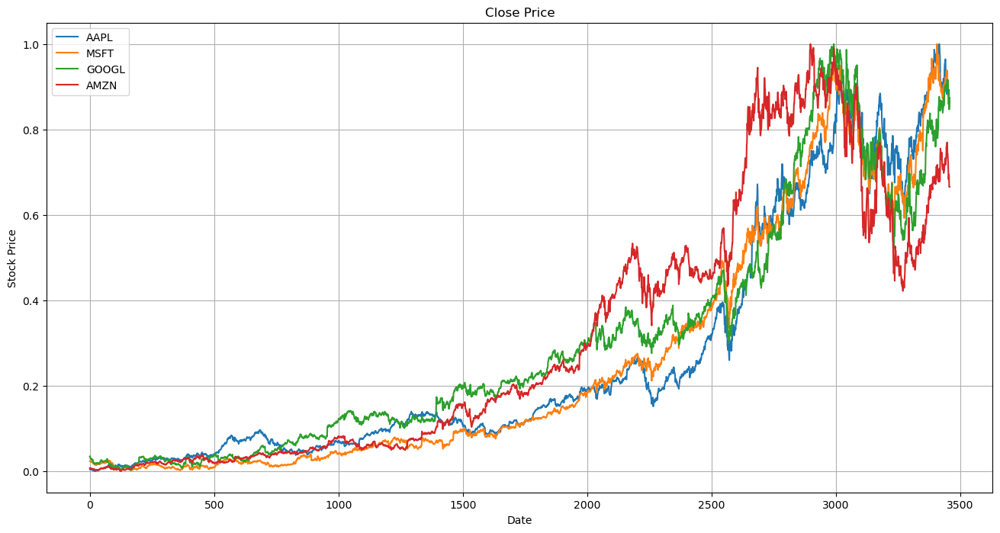

In [110]:
# Visualization Data
#close
plt.figure(figsize=(16,8))
plt.title('Close Price')
plt.plot(normalizedData[:,:4])

plt.xlabel('Date')
plt.ylabel('Stock Price')
plt.legend(['AAPL','MSFT','GOOGL','AMZN'])
plt.grid()

currentFig = plt.gcf()
currentFig.set_facecolor('white')
plt.show()

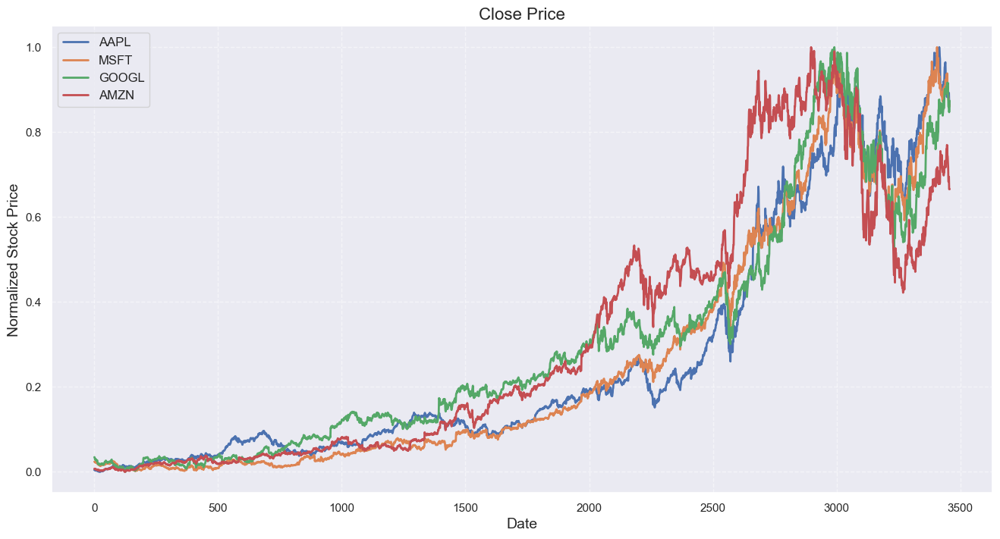

In [189]:
import matplotlib.pyplot as plt
import seaborn as sns

# Set Seaborn style
sns.set(style="dark", palette="deep")

# Function to plot normalized data
def plot_normalized_data(normalized_data, stock_names):
    plt.figure(figsize=(16, 8))
    plt.title('Close Price', fontsize=16)

    # Plot normalized data for each stock
    for i in range(normalized_data.shape[1]):
        plt.plot(normalized_data[:, i], label=stock_names[i], linewidth=2)

    plt.xlabel('Date', fontsize=14)
    plt.ylabel('Normalized Stock Price', fontsize=14)

    # Add legend with larger font size
    plt.legend(fontsize=12)

    # Add grid lines with a lighter color
    plt.grid(True, linestyle='--', alpha=0.5)

    # Set background color
    current_fig = plt.gcf()
    current_fig.set_facecolor('white')

    # Show plot
    plt.show()

# Example usage
stock_names = ['AAPL', 'MSFT', 'GOOGL', 'AMZN']
plot_normalized_data(normalizedData[:,:4], stock_names)


In [111]:
# Storing the number of data points in the array
num_data = len(normalizedData)
num_days_used = 30
data_used = np.array([normalizedData[i : i + num_days_used].copy() for i in range(num_data - num_days_used)])

data_to_predict = np.array(normalizedData[(num_days_used):, :6])

# Creating a dates array for the dates that were used by data_used
dates_used = stock_df.index[num_days_used:num_data]

# Storing the scaler object for prediction later
y_normaliser = MinMaxScaler()
y_normaliser.fit(stock_df[['Close_aapl','Close_msft','Close_googl','Close_amzn']].to_numpy()[num_days_used:])

display(normalizedData.shape, data_used.shape,data_to_predict.shape, dates_used.shape)

(3458, 4)

(3428, 30, 4)

(3428, 4)

(3428,)

In [112]:
train_split = 0.8
data_size = data_used.shape[0]
num_features = data_used.shape[2]
train_size = int(data_size * train_split)
test_size = data_size - train_size

# Splitting the dataset up into train and test sets
X_train = data_used[0:train_size, :, :]
y_train = data_to_predict[0:train_size, :]
dates_train = dates_used[0:train_size]
X_test = data_used[train_size:, :, :]
y_test = data_to_predict[train_size:, :]
dates_test = dates_used[train_size:]

unscaled_y_train = stock_df[['Close_aapl','Close_msft','Close_googl','Close_amzn']].to_numpy()[(num_days_used):][0:train_size, :]
unscaled_y_test = stock_df[['Close_aapl','Close_msft','Close_googl','Close_amzn']].to_numpy()[(num_days_used):][train_size:, :]

display("X_train shape:", X_train.shape, "y_train shape:", y_train.shape, 
        "X_test shape:", X_test.shape, "y_test shape:", y_test.shape,
        "unscaled_y_train shape:", unscaled_y_train.shape, "unscaled_y_test shape:", unscaled_y_test.shape)

'X_train shape:'

(2742, 30, 4)

'y_train shape:'

(2742, 4)

'X_test shape:'

(686, 30, 4)

'y_test shape:'

(686, 4)

'unscaled_y_train shape:'

(2742, 4)

'unscaled_y_test shape:'

(686, 4)

In [113]:
# Save data to excel
data_ = pd.DataFrame(data=data)
normalizedData_ = pd.DataFrame(data=normalizedData)

file_name1 = 'RealData.xlsx'
file_name2 = 'RealNormData.xlsx'

data_.to_excel(file_name1)
normalizedData_.to_excel(file_name2)

# **Model1**

In [114]:
# Creating Model 1
input_aapl = Input(shape=(num_days_used, num_features_aapl), name = 'input_aapl')
input_msft = Input(shape=(num_days_used, num_features_msft), name = 'input_msft')
input_googl = Input(shape=(num_days_used, num_features_googl), name = 'input_googl')
input_amzn = Input(shape=(num_days_used, num_features_amzn), name = 'input_amzn')

x1 = LSTM(150, return_sequences=True, name='LSTM1_aapl')(input_aapl)
x1 = Dropout(0.5)(x1)
x1 = LSTM(150, return_sequences=True, name='LSTM2_aapl')(x1)
x1 = Dropout(0.5)(x1)

x2 = LSTM(150, return_sequences=True, name='LSTM1_msft')(input_msft)
x2 = Dropout(0.5)(x2)
x2 = LSTM(150, return_sequences=True, name='LSTM2_msft')(x2)
x2 = Dropout(0.5)(x2)

x3 = LSTM(150, return_sequences=True, name='LSTM1_googl')(input_googl)
x3 = Dropout(0.5)(x3)
x3 = LSTM(150, return_sequences=True, name='LSTM2_googl')(x3)
x3 = Dropout(0.5)(x3)

x4 = LSTM(150, return_sequences=True, name='LSTM1_amzn')(input_amzn)
x4 = Dropout(0.5)(x4)
x4 = LSTM(150, return_sequences=True, name='LSTM2_amzn')(x4)
x4 = Dropout(0.5)(x4)

conc = concatenate([x1,x2,x3,x4])

output1 = LSTM(150, name='aapl_0')(conc)
output1 = Dense(1, name='aapl_final')(output1)

output2 = LSTM(150, name='msft_0')(conc)
output2 = Dense(1, name='msft_final')(output2)

output3 = LSTM(150, name='googl_0')(conc)
output3 = Dense(1, name='googl_final')(output3)

output4 = LSTM(150, name='amzn_0')(conc)
output4 = Dense(1, name='amzn_final')(output4)

model3 = Model(inputs = [input_aapl, input_msft, input_googl, input_amzn], outputs = [output1, output2, output3, output4])

adam = Adam(learning_rate=0.001)

model3.compile(optimizer=adam, loss='mse')
model3.summary()

Model: "model_5"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_aapl (InputLayer)     [(None, 30, 1)]              0         []                            
                                                                                                  
 input_msft (InputLayer)     [(None, 30, 1)]              0         []                            
                                                                                                  
 input_googl (InputLayer)    [(None, 30, 1)]              0         []                            
                                                                                                  
 input_amzn (InputLayer)     [(None, 30, 1)]              0         []                            
                                                                                            

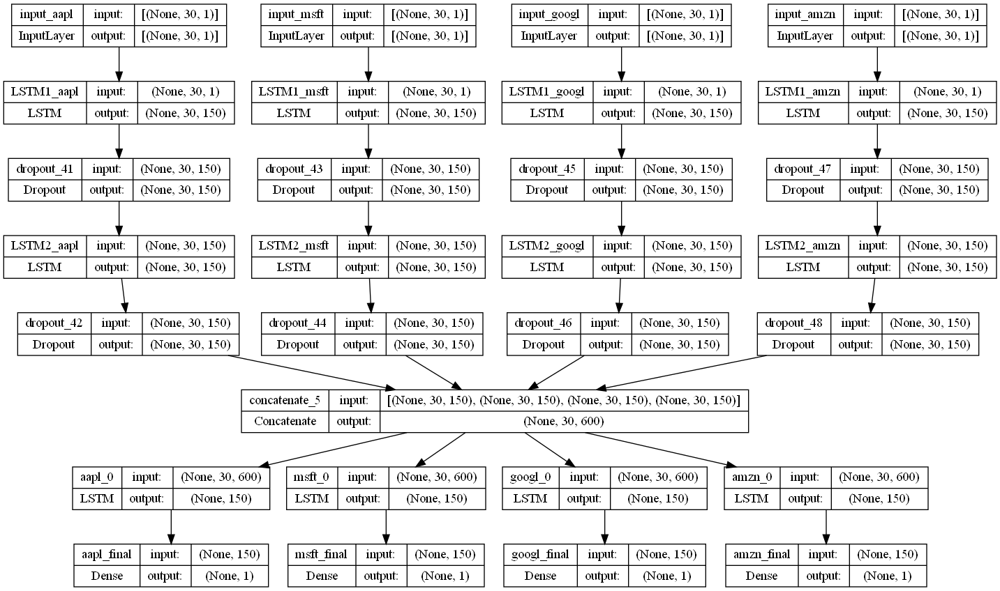

In [115]:
# Displaying the structure of the final model
plot_model(model3, show_shapes=True)

In [116]:
# Fitting Model
history = model3.fit(x=[X_train_aapl,X_train_msft,X_train_googl,X_train_amzn], y=[y_train_aapl,y_train_msft,y_train_googl,y_train_amzn], batch_size=32, epochs=30, validation_split=0.2)
evaluation = model3.evaluate([X_test_aapl,X_test_msft,X_test_googl,X_test_amzn], [y_test_aapl,y_test_msft,y_test_googl,y_test_amzn])
print(evaluation)

Epoch 1/30
69/69 [==============================] - 86s 854ms/step - loss: 0.0039 - aapl_final_loss: 7.4655e-04 - msft_final_loss: 6.8294e-04 - googl_final_loss: 0.0012 - amzn_final_loss: 0.0013 - val_loss: 0.0146 - val_aapl_final_loss: 0.0034 - val_msft_final_loss: 0.0083 - val_googl_final_loss: 8.2050e-04 - val_amzn_final_loss: 0.0021
Epoch 2/30
69/69 [==============================] - 53s 766ms/step - loss: 5.3920e-04 - aapl_final_loss: 7.9929e-05 - msft_final_loss: 8.2855e-05 - googl_final_loss: 1.4716e-04 - amzn_final_loss: 2.2925e-04 - val_loss: 0.0100 - val_aapl_final_loss: 8.9055e-04 - val_msft_final_loss: 0.0055 - val_googl_final_loss: 9.4356e-04 - val_amzn_final_loss: 0.0026
Epoch 3/30
69/69 [==============================] - 55s 801ms/step - loss: 4.7631e-04 - aapl_final_loss: 6.9164e-05 - msft_final_loss: 6.7207e-05 - googl_final_loss: 1.4358e-04 - amzn_final_loss: 1.9636e-04 - val_loss: 0.0085 - val_aapl_final_loss: 0.0013 - val_msft_final_loss: 0.0043 - val_googl_final_lo

22/22 [==============================] - 8s 137ms/step


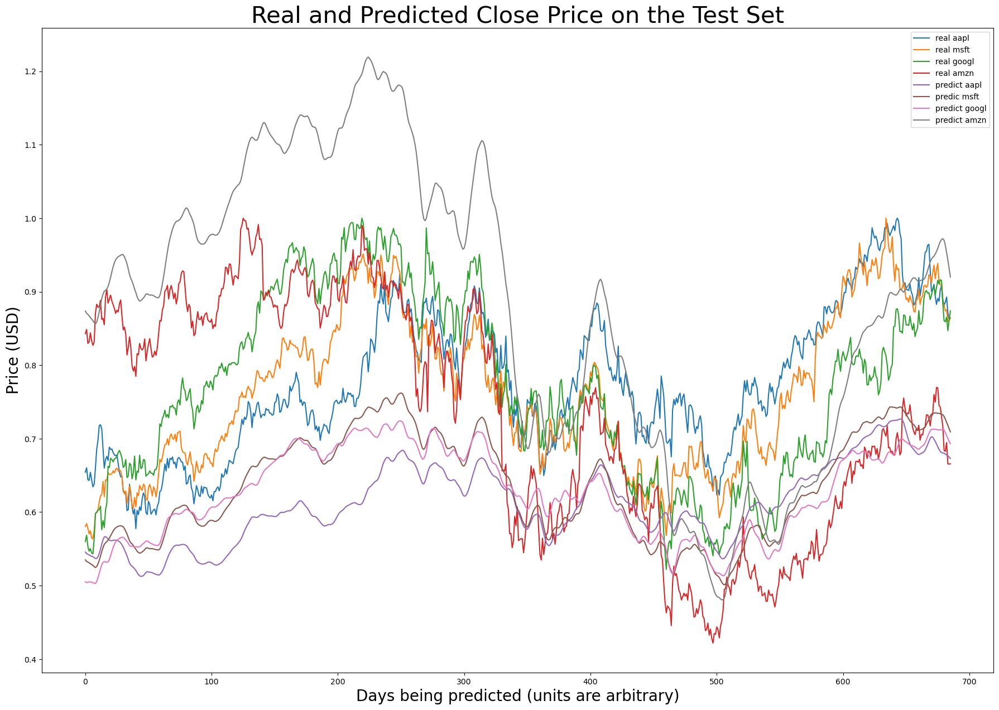

In [117]:
# Prediction data test
y_test_aapl_pred, y_test_msft_pred, y_test_googl_pred, y_test_amzn_pred= model3.predict([X_test_aapl,X_test_msft,X_test_googl,X_test_amzn])
preds_arr = np.hstack((y_test_aapl_pred, y_test_msft_pred, y_test_googl_pred, y_test_amzn_pred))
y_test_pred = preds_arr

aapl=0
msft=1
googl=2
amzn=3

plt.gcf().set_size_inches(22, 15, forward=True)
currentFig.set_facecolor('white')

real = plt.plot(y_test[:,:], label='real')
pred = plt.plot(y_test_pred[:,:], label='predicted')

plt.legend(['real aapl','real msft','real googl','real amzn','predict aapl','predic msft','predict googl','predict amzn'])
plt.xlabel('Days being predicted (units are arbitrary)', fontsize=20)
plt.ylabel('Price (USD)', fontsize=20)
plt.title('Real and Predicted Close Price on the Test Set', fontsize=30)

plt.show()

22/22 [==============================] - 3s 139ms/step


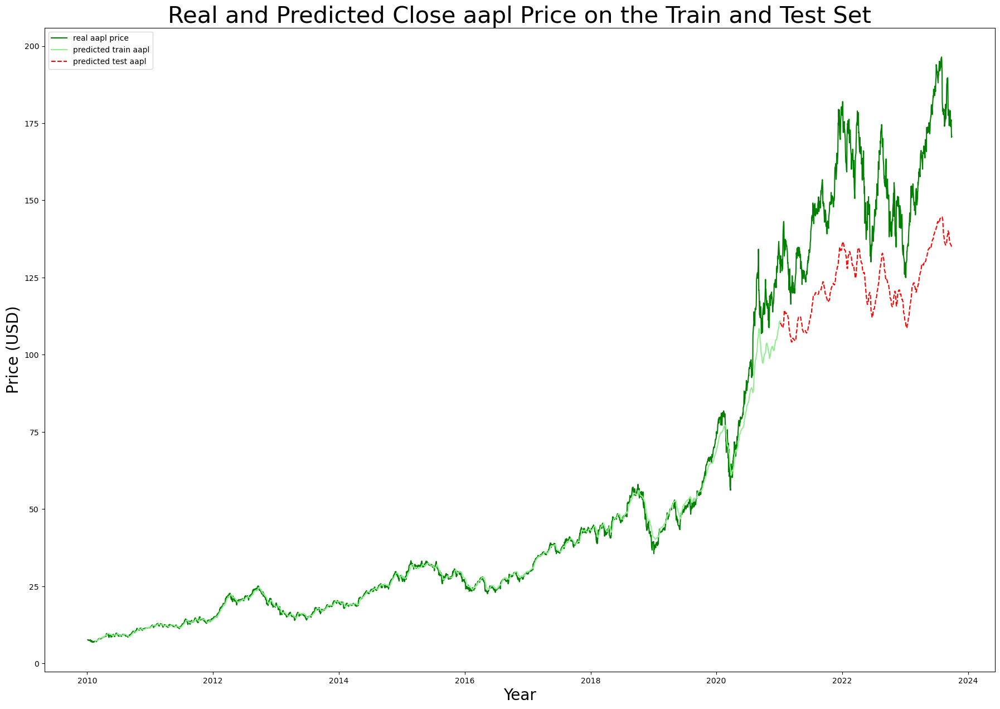

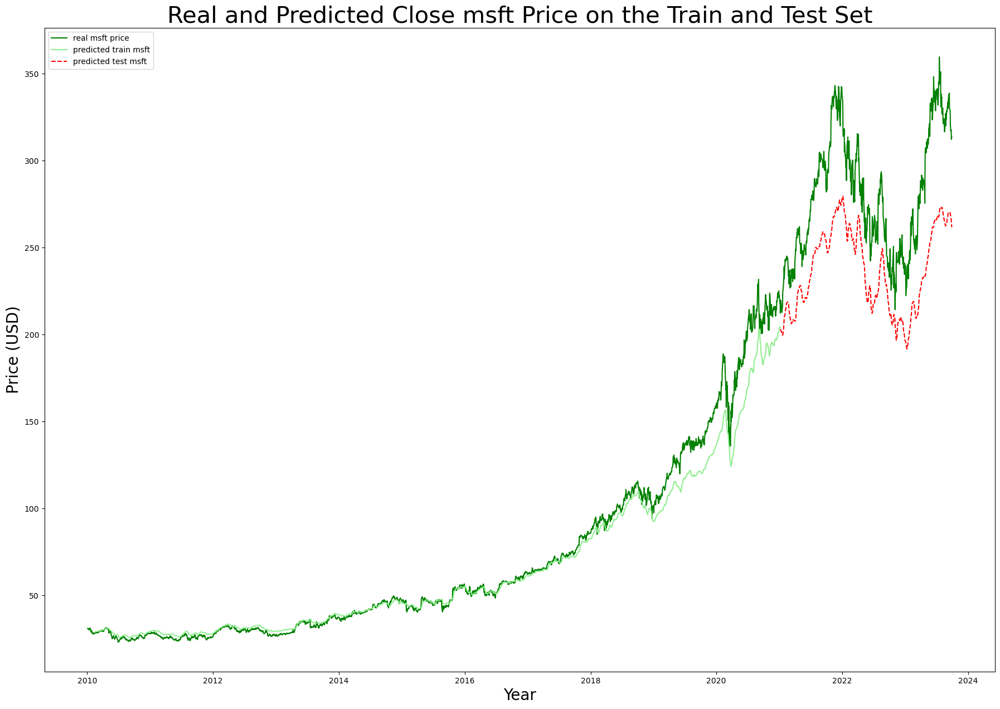

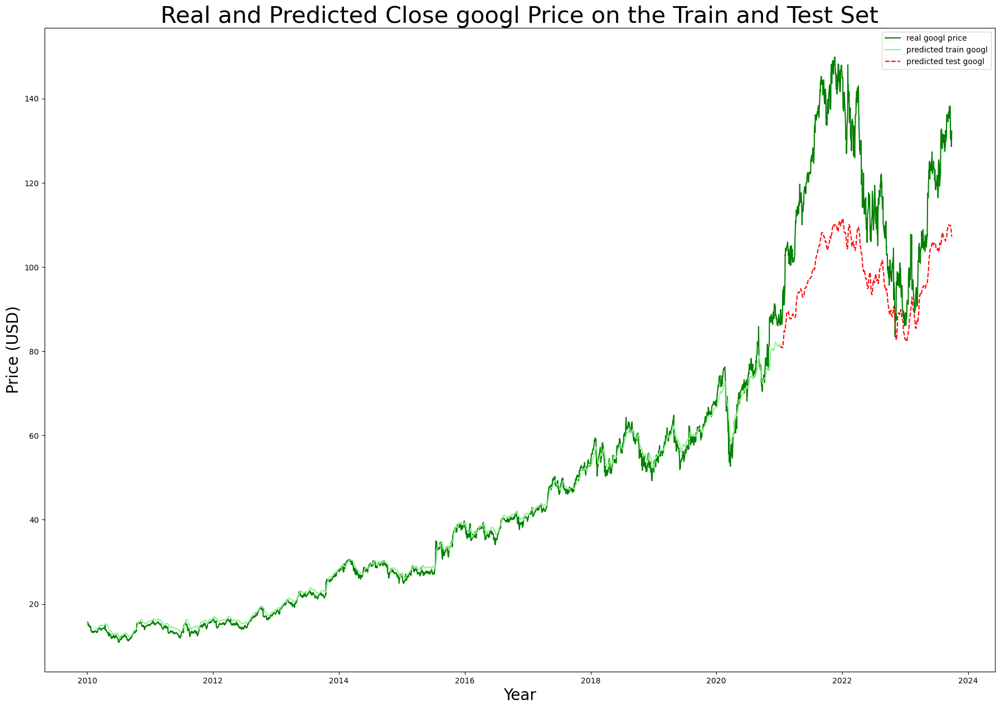

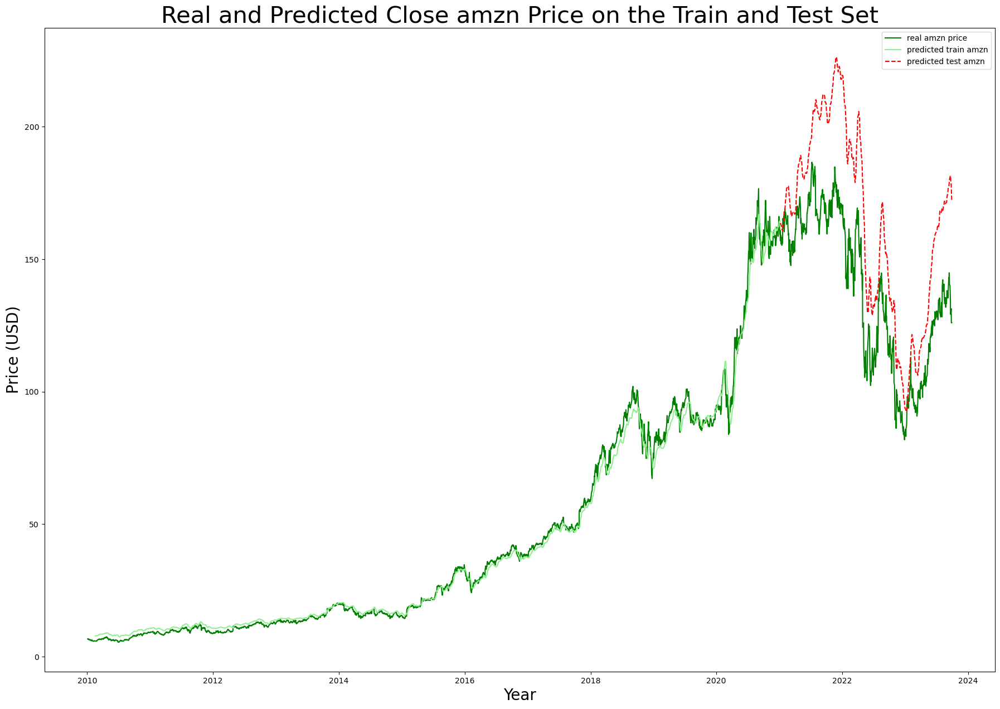

In [118]:
# Prediction data of each company
y_train_aapl_pred, y_train_msft_pred, y_train_googl_pred, y_train_amzn_pred= model3.predict([X_train_aapl,X_train_msft,X_train_googl,X_train_amzn])
y_test_aapl_pred, y_test_msft_pred, y_test_googl_pred, y_test_amzn_pred= model3.predict([X_test_aapl,X_test_msft,X_test_googl,X_test_amzn])
trainpreds_arr = np.hstack((y_train_aapl_pred, y_train_msft_pred, y_train_googl_pred, y_train_amzn_pred))
testpreds_arr = np.hstack((y_test_aapl_pred, y_test_msft_pred, y_test_googl_pred, y_test_amzn_pred))
y_train_pred = y_normaliser.inverse_transform(trainpreds_arr)
y_test_pred = y_normaliser.inverse_transform(testpreds_arr)

plt.gcf().set_size_inches(22, 15, forward=True)
# real values plotted
plt.plot(stock_df['Close_aapl'], label='real aapl price', color='g')

# predicted values plotted
plt.plot(dates_train, y_train_pred[:,aapl], label='predicted train aapl', color='lightgreen')
plt.plot(dates_test, y_test_pred[:,aapl], label='predicted test aapl', color='r', linestyle='dashed')

currentFig.set_facecolor('white')
plt.legend()
plt.xlabel('Year', fontsize=20)
plt.ylabel('Price (USD)', fontsize=20)
plt.title('Real and Predicted Close aapl Price on the Train and Test Set', fontsize=30)
plt.show()

plt.gcf().set_size_inches(22, 15, forward=True)
# real values plotted
plt.plot(stock_df['Close_msft'], label='real msft price', color='g')

# predicted values plotted
plt.plot(dates_train, y_train_pred[:,msft], label='predicted train msft', color='lightgreen')
plt.plot(dates_test, y_test_pred[:,msft], label='predicted test msft', color='r', linestyle='dashed')

currentFig.set_facecolor('white')
plt.legend()
plt.xlabel('Year', fontsize=20)
plt.ylabel('Price (USD)', fontsize=20)
plt.title('Real and Predicted Close msft Price on the Train and Test Set', fontsize=30)
plt.show()

plt.gcf().set_size_inches(22, 15, forward=True)
# real values plotted
plt.plot(stock_df['Close_googl'], label='real googl price', color='g')

# predicted values plotted
plt.plot(dates_train, y_train_pred[:,googl], label='predicted train googl', color='lightgreen')
plt.plot(dates_test, y_test_pred[:,googl], label='predicted test googl', color='r', linestyle='dashed')

currentFig.set_facecolor('white')
plt.legend()
plt.xlabel('Year', fontsize=20)
plt.ylabel('Price (USD)', fontsize=20)
plt.title('Real and Predicted Close googl Price on the Train and Test Set', fontsize=30)
plt.show()

plt.gcf().set_size_inches(22, 15, forward=True)
# real values plotted
plt.plot(stock_df['Close_amzn'], label='real amzn price', color='g')

# predicted values plotted
plt.plot(dates_train, y_train_pred[:,amzn], label='predicted train amzn', color='lightgreen')
plt.plot(dates_test, y_test_pred[:,amzn], label='predicted test amzn', color='r', linestyle='dashed')

currentFig.set_facecolor('white')
plt.legend()
plt.xlabel('Year', fontsize=20)
plt.ylabel('Price (USD)', fontsize=20)
plt.title('Real and Predicted Close amzn Price on the Train and Test Set', fontsize=30)
plt.show()

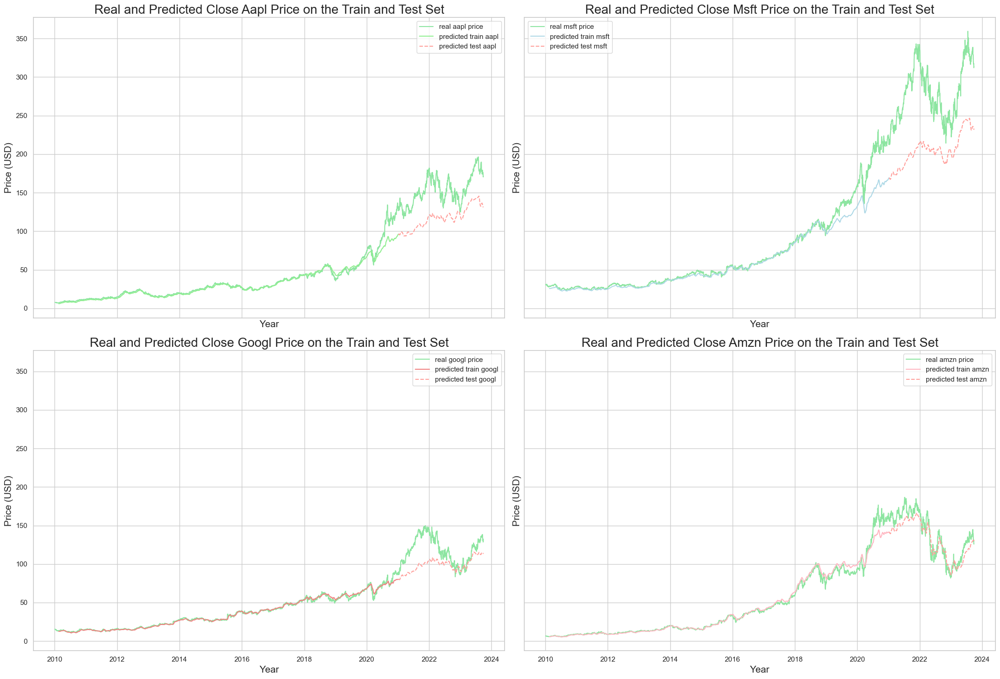

In [225]:
import matplotlib.pyplot as plt

# Number of subplots in each row and column
num_rows = 2
num_cols = 2

# Create subplots
fig, axes = plt.subplots(num_rows, num_cols, figsize=(22, 15), sharex=True, sharey=True)

# Flatten the axes array for easy indexing
axes = axes.flatten()

# Loop through each company
for i, (company, color) in enumerate(zip(['aapl', 'msft', 'googl', 'amzn'], ['lightgreen', 'lightblue', 'lightcoral', 'lightpink'])):
    # Real values plotted
    axes[i].plot(stock_df[f'Close_{company}'], label=f'real {company} price', color='g')

    # Predicted values plotted
    axes[i].plot(dates_train, y_train_pred[:, i], label=f'predicted train {company}', color=color)
    axes[i].plot(dates_test, y_test_pred[:, i], label=f'predicted test {company}', color='r', linestyle='dashed')

    # Set subplot properties
    axes[i].set_xlabel('Year', fontsize=15)
    axes[i].set_ylabel('Price (USD)', fontsize=15)
    axes[i].set_title(f'Real and Predicted Close {company.capitalize()} Price on the Train and Test Set', fontsize=20)
    axes[i].legend()

# Adjust layout
plt.tight_layout()

# Display the plot
plt.show()


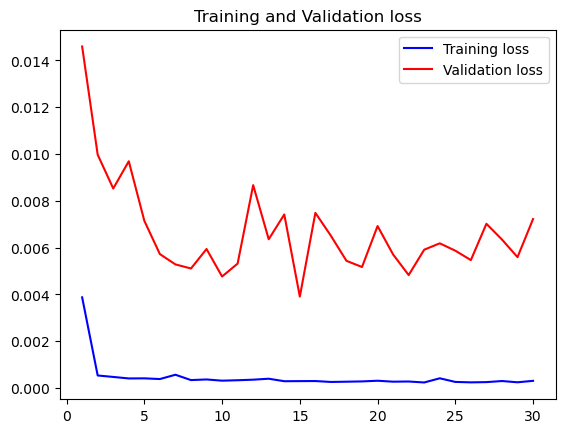

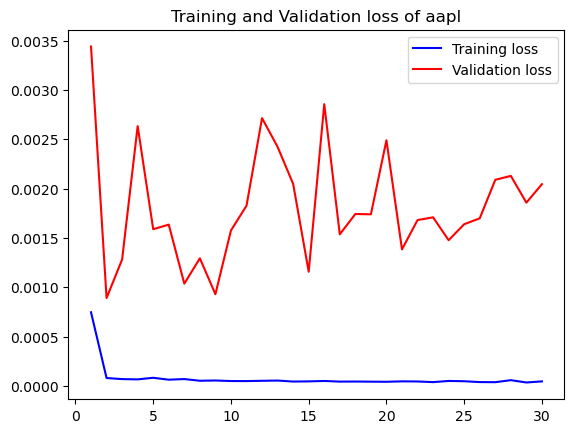

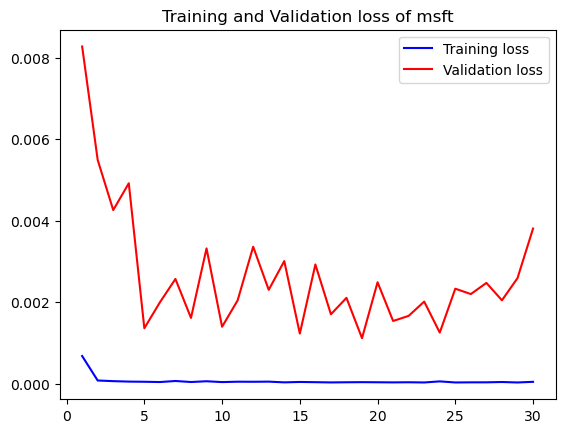

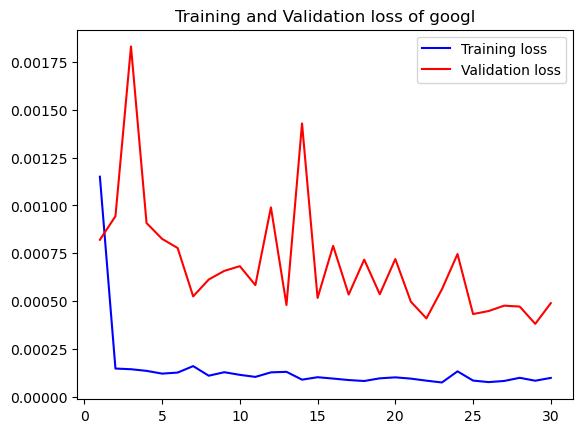

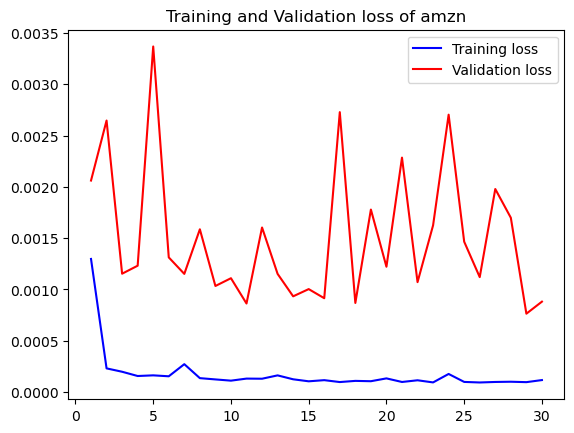

In [119]:
# Visualization data
loss = history.history['loss']
val_loss = history.history['val_loss']
aapl_loss = history.history['aapl_final_loss']
val_aapl_loss = history.history['val_aapl_final_loss']
msft_loss = history.history['msft_final_loss']
val_msft_loss = history.history['val_msft_final_loss']
googl_loss = history.history['googl_final_loss']
val_googl_loss = history.history['val_googl_final_loss']
amzn_loss = history.history['amzn_final_loss']
val_amzn_loss = history.history['val_amzn_final_loss']
epochs = range(1, len(loss) + 1)
plt.figure()

#Train and validation loss
plt.plot(epochs, loss, 'b', label='Training loss')
plt.plot(epochs, val_loss, 'r', label='Validation loss')
plt.title('Training and Validation loss')
plt.legend()
plt.show()

plt.plot(epochs, aapl_loss, 'b', label='Training loss')
plt.plot(epochs, val_aapl_loss, 'r', label='Validation loss')
plt.title('Training and Validation loss of aapl')
plt.legend()
plt.show()

plt.plot(epochs, msft_loss, 'b', label='Training loss')
plt.plot(epochs, val_msft_loss, 'r', label='Validation loss')
plt.title('Training and Validation loss of msft')
plt.legend()
plt.show()

plt.plot(epochs, googl_loss, 'b', label='Training loss')
plt.plot(epochs, val_googl_loss, 'r', label='Validation loss')
plt.title('Training and Validation loss of googl')
plt.legend()
plt.show()

plt.plot(epochs, amzn_loss, 'b', label='Training loss')
plt.plot(epochs, val_amzn_loss, 'r', label='Validation loss')
plt.title('Training and Validation loss of amzn')
plt.legend()
plt.show()

In [120]:
#Evaluation MAE, MSE, RMSE, MAPE of aapl Price 

# Calculating MAE performance metrics
mae_aapl_train = mean_absolute_error(unscaled_y_train_aapl, y_train_pred[:,aapl])

# Calculating Test Data MAE
mae_aapl_test = mean_absolute_error(unscaled_y_test_aapl, y_test_pred[:,aapl])

# Calculating MSE performance metrics
mse_aapl_train = mean_squared_error(unscaled_y_train_aapl, y_train_pred[:,aapl])

# Calculating Test Data MSE
mse_aapl_test = mean_squared_error(unscaled_y_test_aapl, y_test_pred[:,aapl])

# Calculating RMSE performance metrics
rmse_aapl_train = math.sqrt(mean_squared_error(unscaled_y_train_aapl, y_train_pred[:,aapl]))

# Calculating Test Data RMSE
rmse_aapl_test = math.sqrt(mean_squared_error(unscaled_y_test_aapl, y_test_pred[:,aapl]))

# Calculating MAPE performance metrics
mape_aapl_train = np.mean(np.abs((unscaled_y_train_aapl - y_train_pred[:,aapl])/unscaled_y_train_aapl))*100

# Calculating Test Data MAPE
mape_aapl_test = np.mean(np.abs((unscaled_y_test_aapl - y_test_pred[:,aapl])/unscaled_y_test_aapl))*100

print('Evaluation of aapl price','\nMAE Train:', mae_aapl_train, '\nMAE Test:', mae_aapl_test,
      '\nMSE Train:', mse_aapl_train, '\nMSE Test:', mse_aapl_test,
      '\nRMSE Train1:', rmse_aapl_train, '\nRMSE Test1:', rmse_aapl_test,
      '\nMAPE Train:', mape_aapl_train, '\nMAPE Test:', mape_aapl_test)

Evaluation of aapl price 
MAE Train: 1.575436947382253 
MAE Test: 30.623365363296198 
MSE Train: 15.037291951443077 
MSE Test: 1020.0656583849426 
RMSE Train1: 3.8777947278631286 
RMSE Test1: 31.938466750690186 
MAPE Train: 3.1584441264462635 
MAPE Test: 19.546860756491824


In [121]:
#Evaluation MAE, MSE, RMSE, MAPE of msft Price 

# Calculating MAE performance metrics
mae_msft_train = mean_absolute_error(unscaled_y_train_msft, y_train_pred[:,msft])

# Calculating Test Data MAE
mae_msft_test = mean_absolute_error(unscaled_y_test_msft, y_test_pred[:,msft])

# Calculating MSE performance metrics
mse_msft_train = mean_squared_error(unscaled_y_train_msft, y_train_pred[:,msft])

# Calculating Test Data MSE
mse_msft_test = mean_squared_error(unscaled_y_test_msft, y_test_pred[:,msft])

# Calculating RMSE performance metrics
rmse_msft_train = math.sqrt(mean_squared_error(unscaled_y_train_msft, y_train_pred[:,msft]))

# Calculating Test Data RMSE
rmse_msft_test = math.sqrt(mean_squared_error(unscaled_y_test_msft, y_test_pred[:,msft]))

# Calculating MAPE performance metrics
mape_msft_train = np.mean(np.abs((unscaled_y_train_msft - y_train_pred[:,msft])/unscaled_y_train_msft))*100

# Calculating Test Data MAPE
mape_msft_test = np.mean(np.abs((unscaled_y_test_msft - y_test_pred[:,msft])/unscaled_y_test_msft))*100

print('Evaluation of msft price','\nMAE Train:', mae_msft_train, '\nMAE Test:', mae_msft_test,
      '\nMSE Train:', mse_msft_train, '\nMSE Test:', mse_msft_test,
      '\nRMSE Train1:', rmse_msft_train, '\nRMSE Test1:', rmse_msft_test,
      '\nMAPE Train:', mape_msft_train, '\nMAPE Test:', mape_msft_test)

Evaluation of msft price 
MAE Train: 5.203396449377727 
MAE Test: 43.171162085352414 
MSE Train: 90.29592030202728 
MSE Test: 2110.9150523028616 
RMSE Train1: 9.502416550647908 
RMSE Test1: 45.94469558396118 
MAPE Train: 5.642051376773345 
MAPE Test: 15.081717815678633


In [122]:
#Evaluation MAE, MSE, RMSE, MAPE of googl Price 

# Calculating MAE performance metrics
mae_googl_train = mean_absolute_error(unscaled_y_train_googl, y_train_pred[:,googl])

# Calculating Test Data MAE
mae_googl_test = mean_absolute_error(unscaled_y_test_googl, y_test_pred[:,googl])

# Calculating MSE performance metrics
mse_googl_train = mean_squared_error(unscaled_y_train_googl, y_train_pred[:,googl])

# Calculating Test Data MSE
mse_googl_test = mean_squared_error(unscaled_y_test_googl, y_test_pred[:,googl])

# Calculating RMSE performance metrics
rmse_googl_train = math.sqrt(mean_squared_error(unscaled_y_train_googl, y_train_pred[:,googl]))

# Calculating Test Data RMSE
rmse_googl_test = math.sqrt(mean_squared_error(unscaled_y_test_googl, y_test_pred[:,googl]))

# Calculating MAPE performance metrics
mape_googl_train = np.mean(np.abs((unscaled_y_train_googl - y_train_pred[:,googl])/unscaled_y_train_googl))*100

# Calculating Test Data MAPE
mape_googl_test = np.mean(np.abs((unscaled_y_test_googl - y_test_pred[:,googl])/unscaled_y_test_googl))*100

print('Evaluation of googl price','\nMAE Train:', mae_googl_train, '\nMAE Test:', mae_googl_test,
      '\nMSE Train:', mse_googl_train, '\nMSE Test:', mse_googl_test,
      '\nRMSE Train1:', rmse_googl_train, '\nRMSE Test1:', rmse_googl_test,
      '\nMAPE Train:', mape_googl_train, '\nMAPE Test:', mape_googl_test)

Evaluation of googl price 
MAE Train: 1.155158337844192 
MAE Test: 19.867543612555234 
MSE Train: 2.848268150828675 
MSE Test: 492.0740252020886 
RMSE Train1: 1.6876812942106916 
RMSE Test1: 22.182741606981057 
MAPE Train: 3.6378099161156077 
MAPE Test: 16.005882120488156


In [123]:
#Evaluation MAE, MSE, RMSE, MAPE of amzn Price 

# Calculating MAE performance metrics
mae_amzn_train = mean_absolute_error(unscaled_y_train_amzn, y_train_pred[:,amzn])

# Calculating Test Data MAE
mae_amzn_test = mean_absolute_error(unscaled_y_test_amzn, y_test_pred[:,amzn])

# Calculating MSE performance metrics
mse_amzn_train = mean_squared_error(unscaled_y_train_amzn, y_train_pred[:,amzn])

# Calculating Test Data MSE
mse_amzn_test = mean_squared_error(unscaled_y_test_amzn, y_test_pred[:,amzn])

# Calculating RMSE performance metrics
rmse_amzn_train = math.sqrt(mean_squared_error(unscaled_y_train_amzn, y_train_pred[:,amzn]))

# Calculating Test Data RMSE
rmse_amzn_test = math.sqrt(mean_squared_error(unscaled_y_test_amzn, y_test_pred[:,amzn]))

# Calculating MAPE performance metrics
mape_amzn_train = np.mean(np.abs((unscaled_y_train_amzn - y_train_pred[:,amzn])/unscaled_y_train_amzn))*100

# Calculating Test Data MAPE
mape_amzn_test = np.mean(np.abs((unscaled_y_test_amzn - y_test_pred[:,amzn])/unscaled_y_test_amzn))*100

print('Evaluation of amzn price','\nMAE Train:', mae_amzn_train, '\nMAE Test:', mae_amzn_test,
      '\nMSE Train:', mse_amzn_train, '\nMSE Test:', mse_amzn_test,
      '\nRMSE Train1:', rmse_amzn_train, '\nRMSE Test1:', rmse_amzn_test,
      '\nMAPE Train:', mape_amzn_train, '\nMAPE Test:', mape_amzn_test)

Evaluation of amzn price 
MAE Train: 2.074398044945114 
MAE Test: 26.73195471360454 
MSE Train: 9.186394915833244 
MSE Test: 896.1775000997304 
RMSE Train1: 3.0309066161518805 
RMSE Test1: 29.93622387843414 
MAPE Train: 7.734474053516097 
MAPE Test: 19.440957724993194


In [124]:
# Save data to excel
df_pred_test_norm = pd.DataFrame(data=testpreds_arr)
df_pred_train_norm = pd.DataFrame(data=trainpreds_arr)
df_pred_test = pd.DataFrame(data=y_test_pred)
df_pred_train = pd.DataFrame(data=y_train_pred)

file_name11 = 'TestPredNormData3.xlsx'
file_name12 = 'TrainPredNormData3.xlsx'
file_name13 = 'TestPredData3.xlsx'
file_name14 = 'TrainPredData3.xlsx'

df_pred_test_norm.to_excel(file_name11)
df_pred_train_norm.to_excel(file_name12)
df_pred_test.to_excel(file_name13)
df_pred_train.to_excel(file_name14)

# **Model2**

In [125]:
input_aapl = Input(shape=(num_days_used, num_features_aapl), name = 'input_aapl')
input_msft = Input(shape=(num_days_used, num_features_msft), name = 'input_msft')
input_googl = Input(shape=(num_days_used, num_features_googl), name = 'input_googl')
input_amzn = Input(shape=(num_days_used, num_features_amzn), name = 'input_amzn')


x1 = LSTM(150, return_sequences=True, name='LSTM1_aapl')(input_aapl)
x1 = Dropout(0.5)(x1)
x1 = LSTM(150, return_sequences=True, name='LSTM2_aapl')(x1)
x1 = Dropout(0.5)(x1)

x2 = LSTM(150, return_sequences=True, name='LSTM1_msft')(input_msft)
x2 = Dropout(0.5)(x2)
x2 = LSTM(150, return_sequences=True, name='LSTM2_msft')(x2)
x2 = Dropout(0.5)(x2)

x3 = LSTM(150, return_sequences=True, name='LSTM1_googl')(input_googl)
x3 = Dropout(0.5)(x3)
x3 = LSTM(150, return_sequences=True, name='LSTM2_googl')(x3)
x3 = Dropout(0.5)(x3)

x4 = LSTM(150, return_sequences=True, name='LSTM1_amzn')(input_amzn)
x4 = Dropout(0.5)(x4)
x4 = LSTM(150, return_sequences=True, name='LSTM2_amzn')(x4)
x4 = Dropout(0.5)(x4)

conc = concatenate([x1,x2,x3,x4])
conc = LSTM(150, return_sequences=True, name='LSTM_conc')(conc)

output1 = LSTM(150, name='aapl_0')(conc)
output1 = Dense(1, name='aapl_final')(output1)

output2 = LSTM(150, name='msft_0')(conc)
output2 = Dense(1, name='msft_final')(output2)

output3 = LSTM(150, name='googl_0')(conc)
output3 = Dense(1, name='googl_final')(output3)

output4 = LSTM(150, name='amzn_0')(conc)
output4 = Dense(1, name='amzn_final')(output4)

model4 = Model(inputs = [input_aapl, input_msft, input_googl, input_amzn], outputs = [output1, output2, output3, output4])

adam = Adam(learning_rate=0.001)

model4.compile(optimizer=adam, loss='mse')
model4.summary()

Model: "model_6"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_aapl (InputLayer)     [(None, 30, 1)]              0         []                            
                                                                                                  
 input_msft (InputLayer)     [(None, 30, 1)]              0         []                            
                                                                                                  
 input_googl (InputLayer)    [(None, 30, 1)]              0         []                            
                                                                                                  
 input_amzn (InputLayer)     [(None, 30, 1)]              0         []                            
                                                                                            

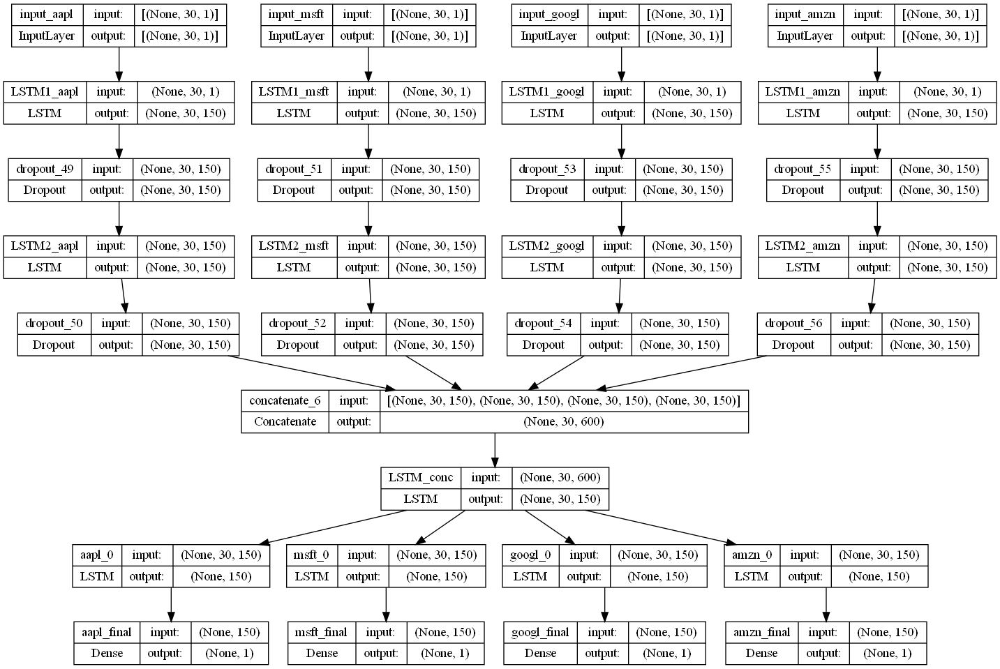

In [126]:
# Displaying the structure of the final model
plot_model(model4, show_shapes=True)

In [127]:
# fitting Model
history = model4.fit(x=[X_train_aapl,X_train_msft,X_train_googl,X_train_amzn], y=[y_train_aapl,y_train_msft,y_train_googl,y_train_amzn], batch_size=32, epochs=30, validation_split=0.2)
evaluation = model4.evaluate([X_test_aapl,X_test_msft,X_test_googl,X_test_amzn], [y_test_aapl,y_test_msft,y_test_googl,y_test_amzn])
print(evaluation)

Epoch 1/30
69/69 [==============================] - 107s 1s/step - loss: 0.0049 - aapl_final_loss: 9.0373e-04 - msft_final_loss: 8.4973e-04 - googl_final_loss: 0.0014 - amzn_final_loss: 0.0017 - val_loss: 0.0239 - val_aapl_final_loss: 0.0100 - val_msft_final_loss: 0.0088 - val_googl_final_loss: 0.0018 - val_amzn_final_loss: 0.0033
Epoch 2/30
69/69 [==============================] - 109s 2s/step - loss: 4.8181e-04 - aapl_final_loss: 8.5676e-05 - msft_final_loss: 7.5162e-05 - googl_final_loss: 1.4314e-04 - amzn_final_loss: 1.7782e-04 - val_loss: 0.0127 - val_aapl_final_loss: 0.0016 - val_msft_final_loss: 0.0069 - val_googl_final_loss: 0.0028 - val_amzn_final_loss: 0.0015
Epoch 3/30
69/69 [==============================] - 119s 2s/step - loss: 4.7134e-04 - aapl_final_loss: 7.7709e-05 - msft_final_loss: 6.4769e-05 - googl_final_loss: 1.3878e-04 - amzn_final_loss: 1.9009e-04 - val_loss: 0.0081 - val_aapl_final_loss: 0.0019 - val_msft_final_loss: 0.0036 - val_googl_final_loss: 0.0012 - val_a

22/22 [==============================] - 14s 363ms/step


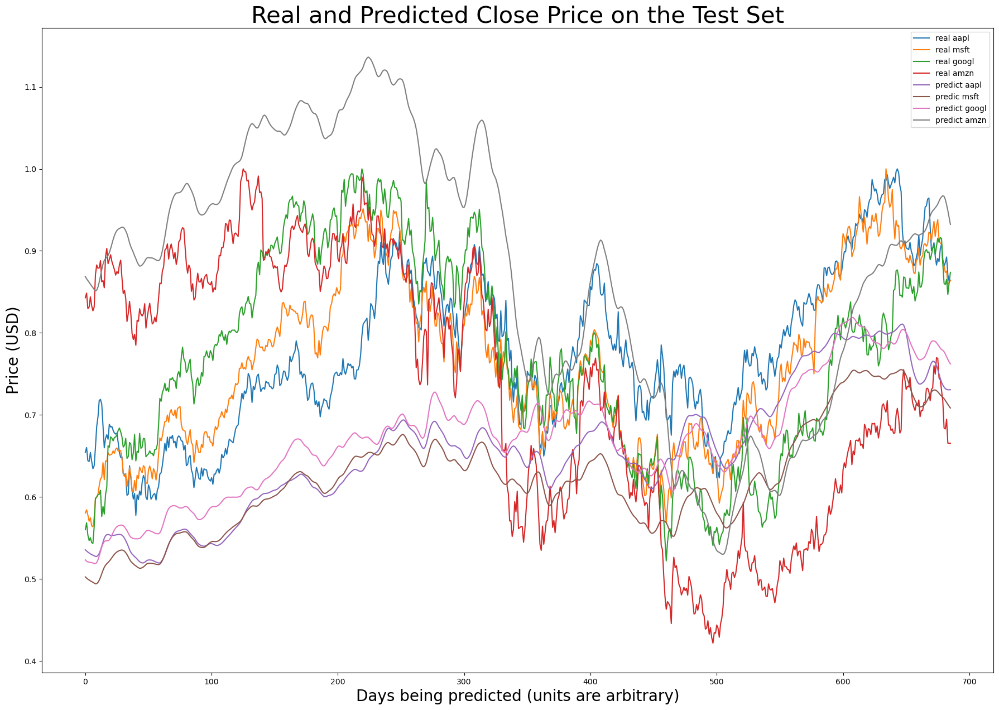

In [128]:
# Prediction data test
y_test_aapl_pred, y_test_msft_pred, y_test_googl_pred, y_test_amzn_pred= model4.predict([X_test_aapl,X_test_msft,X_test_googl,X_test_amzn])
preds_arr = np.hstack((y_test_aapl_pred, y_test_msft_pred, y_test_googl_pred, y_test_amzn_pred))
y_test_pred = preds_arr

aapl=0
msft=1
googl=2
amzn=3

plt.gcf().set_size_inches(22, 15, forward=True)
currentFig.set_facecolor('white')

real = plt.plot(y_test[:,:], label='real')
pred = plt.plot(y_test_pred[:,:], label='predicted')

plt.legend(['real aapl','real msft','real googl','real amzn','predict aapl','predic msft','predict googl','predict amzn'])
plt.xlabel('Days being predicted (units are arbitrary)', fontsize=20)
plt.ylabel('Price (USD)', fontsize=20)
plt.title('Real and Predicted Close Price on the Test Set', fontsize=30)

plt.show()

22/22 [==============================] - 8s 376ms/step


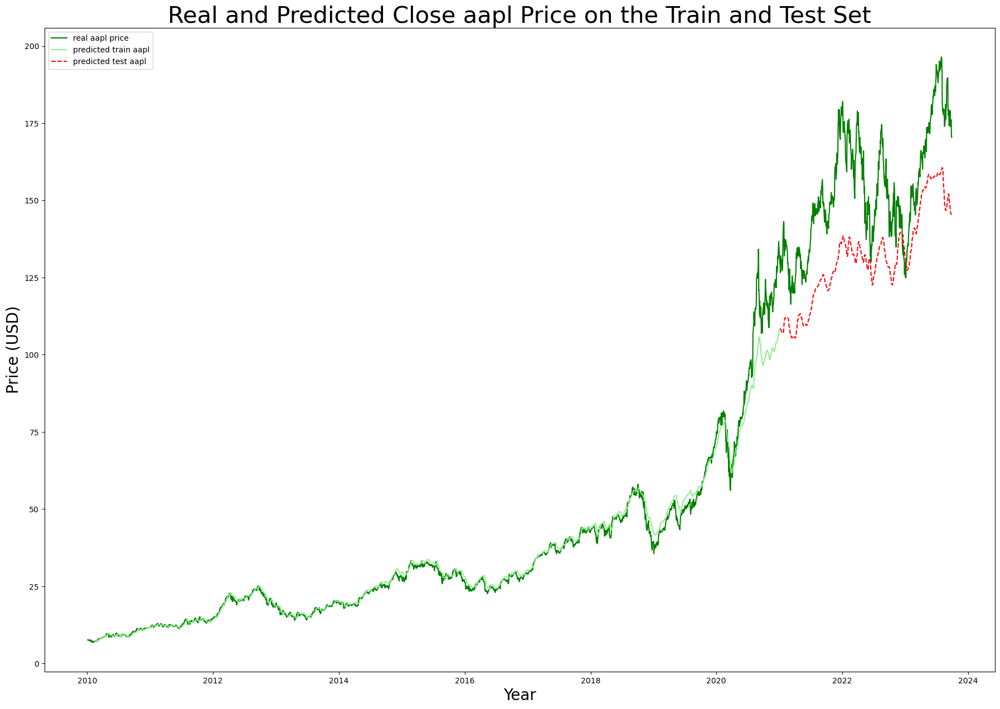

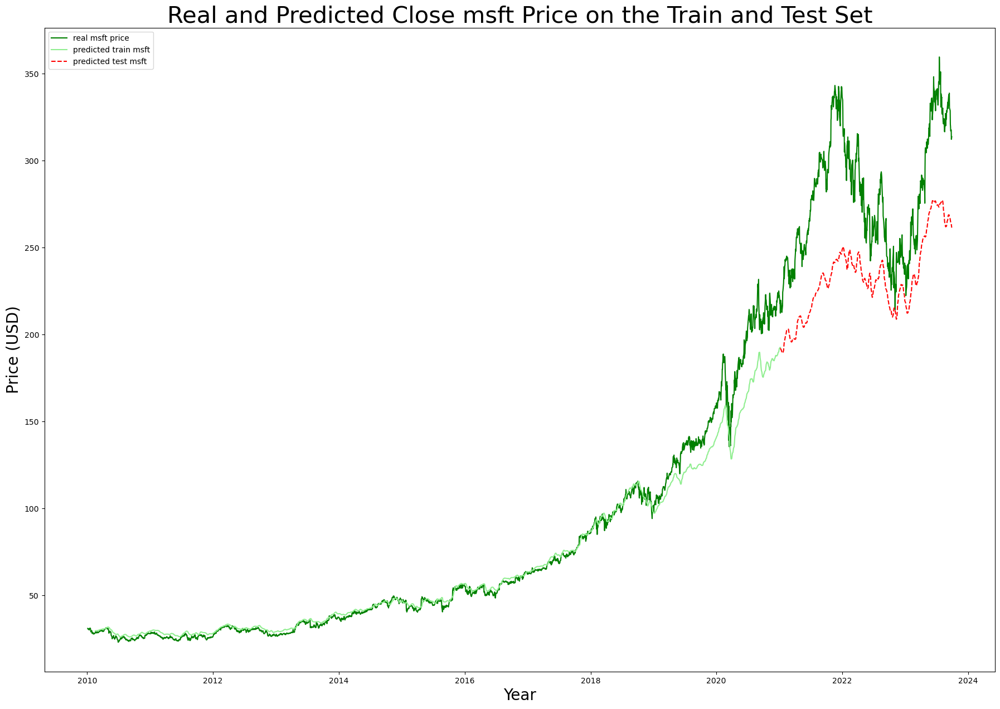

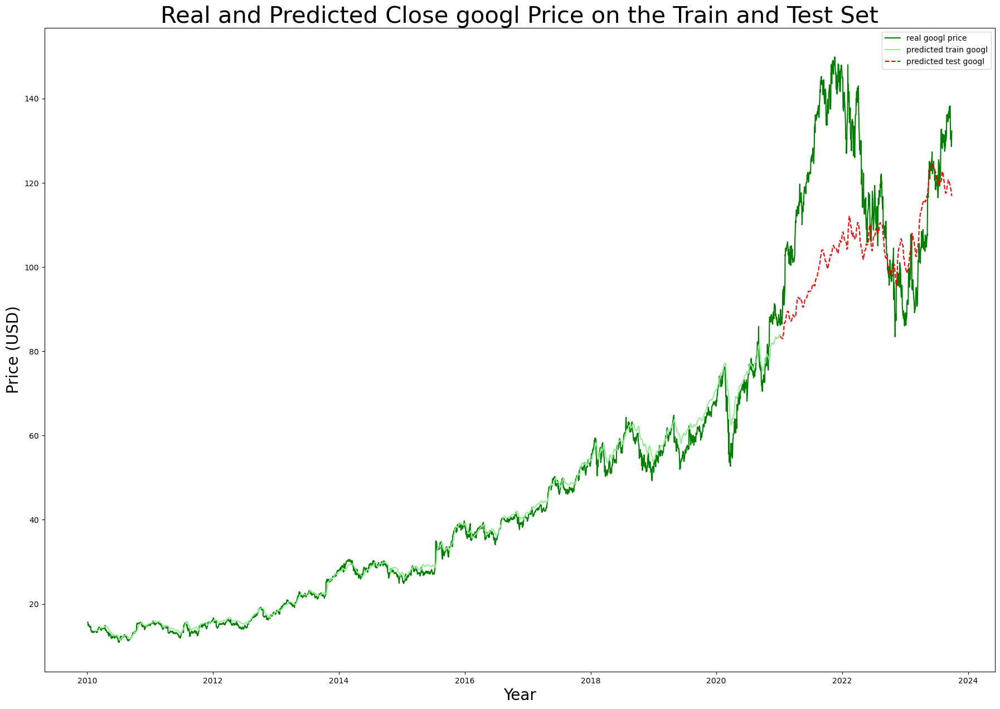

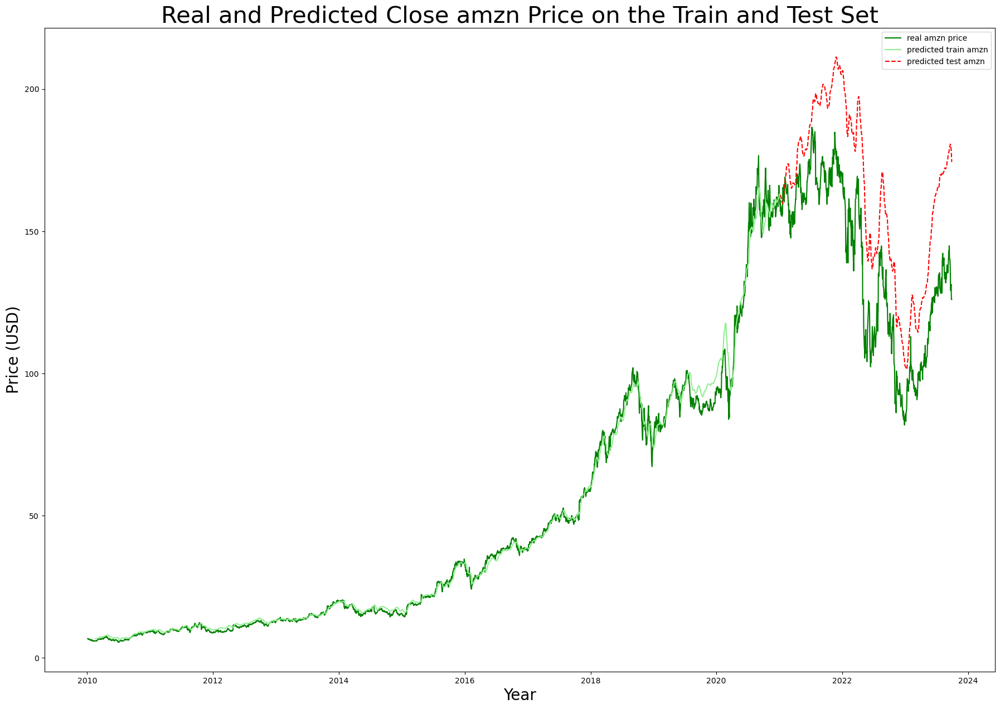

In [129]:
# Prediction data of each company
y_train_aapl_pred, y_train_msft_pred, y_train_googl_pred, y_train_amzn_pred= model4.predict([X_train_aapl,X_train_msft,X_train_googl,X_train_amzn])
y_test_aapl_pred, y_test_msft_pred, y_test_googl_pred, y_test_amzn_pred= model4.predict([X_test_aapl,X_test_msft,X_test_googl,X_test_amzn])
trainpreds_arr = np.hstack((y_train_aapl_pred, y_train_msft_pred, y_train_googl_pred, y_train_amzn_pred))
testpreds_arr = np.hstack((y_test_aapl_pred, y_test_msft_pred, y_test_googl_pred, y_test_amzn_pred))
y_train_pred = y_normaliser.inverse_transform(trainpreds_arr)
y_test_pred = y_normaliser.inverse_transform(testpreds_arr)

plt.gcf().set_size_inches(22, 15, forward=True)
# real values plotted
plt.plot(stock_df['Close_aapl'], label='real aapl price', color='g')

# predicted values plotted
plt.plot(dates_train, y_train_pred[:,aapl], label='predicted train aapl', color='lightgreen')
plt.plot(dates_test, y_test_pred[:,aapl], label='predicted test aapl', color='r', linestyle='dashed')

currentFig.set_facecolor('white')
plt.legend()
plt.xlabel('Year', fontsize=20)
plt.ylabel('Price (USD)', fontsize=20)
plt.title('Real and Predicted Close aapl Price on the Train and Test Set', fontsize=30)
plt.show()

plt.gcf().set_size_inches(22, 15, forward=True)
# real values plotted
plt.plot(stock_df['Close_msft'], label='real msft price', color='g')

# predicted values plotted
plt.plot(dates_train, y_train_pred[:,msft], label='predicted train msft', color='lightgreen')
plt.plot(dates_test, y_test_pred[:,msft], label='predicted test msft', color='r', linestyle='dashed')

currentFig.set_facecolor('white')
plt.legend()
plt.xlabel('Year', fontsize=20)
plt.ylabel('Price (USD)', fontsize=20)
plt.title('Real and Predicted Close msft Price on the Train and Test Set', fontsize=30)
plt.show()

plt.gcf().set_size_inches(22, 15, forward=True)
# real values plotted
plt.plot(stock_df['Close_googl'], label='real googl price', color='g')

# predicted values plotted
plt.plot(dates_train, y_train_pred[:,googl], label='predicted train googl', color='lightgreen')
plt.plot(dates_test, y_test_pred[:,googl], label='predicted test googl', color='r', linestyle='dashed')

currentFig.set_facecolor('white')
plt.legend()
plt.xlabel('Year', fontsize=20)
plt.ylabel('Price (USD)', fontsize=20)
plt.title('Real and Predicted Close googl Price on the Train and Test Set', fontsize=30)
plt.show()

plt.gcf().set_size_inches(22, 15, forward=True)
# real values plotted
plt.plot(stock_df['Close_amzn'], label='real amzn price', color='g')

# predicted values plotted
plt.plot(dates_train, y_train_pred[:,amzn], label='predicted train amzn', color='lightgreen')
plt.plot(dates_test, y_test_pred[:,amzn], label='predicted test amzn', color='r', linestyle='dashed')

currentFig.set_facecolor('white')
plt.legend()
plt.xlabel('Year', fontsize=20)
plt.ylabel('Price (USD)', fontsize=20)
plt.title('Real and Predicted Close amzn Price on the Train and Test Set', fontsize=30)
plt.show()

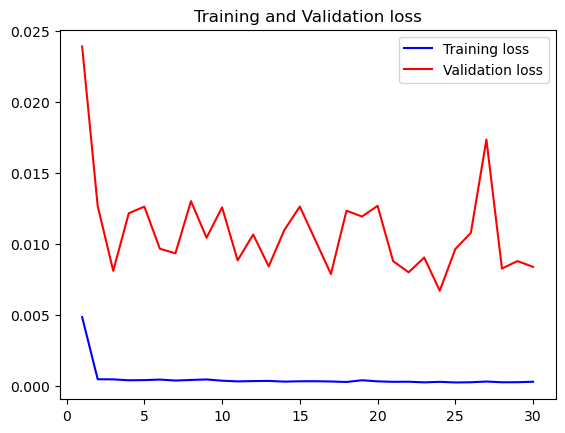

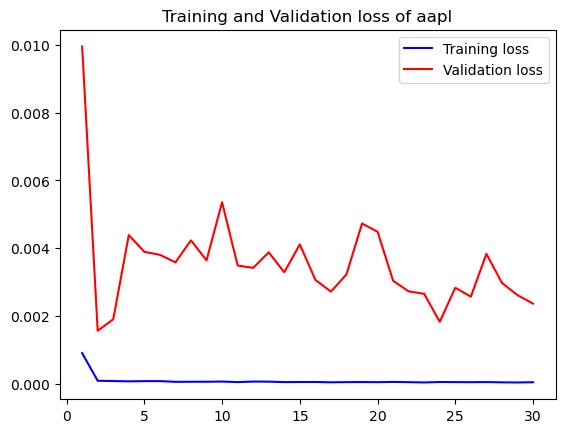

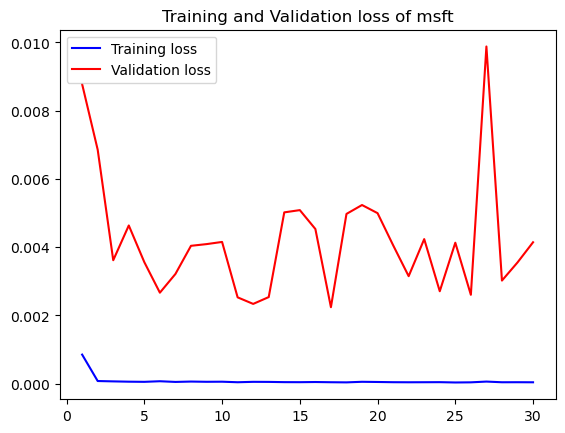

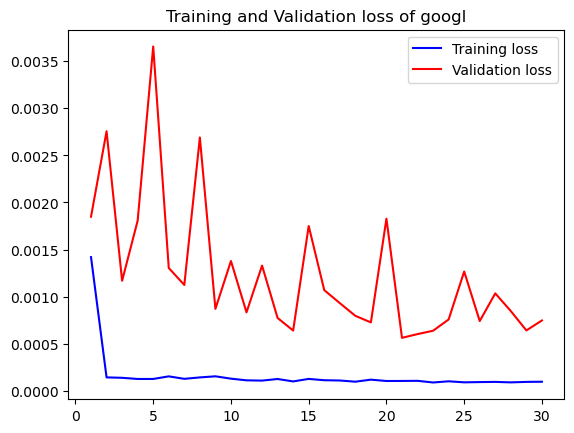

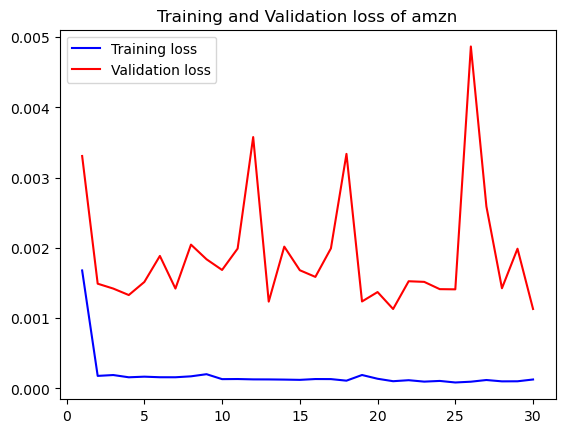

In [130]:
# visualization Loss
loss = history.history['loss']
val_loss = history.history['val_loss']
aapl_loss = history.history['aapl_final_loss']
val_aapl_loss = history.history['val_aapl_final_loss']
msft_loss = history.history['msft_final_loss']
val_msft_loss = history.history['val_msft_final_loss']
googl_loss = history.history['googl_final_loss']
val_googl_loss = history.history['val_googl_final_loss']
amzn_loss = history.history['amzn_final_loss']
val_amzn_loss = history.history['val_amzn_final_loss']
epochs = range(1, len(loss) + 1)
plt.figure()

#Train and validation loss
plt.plot(epochs, loss, 'b', label='Training loss')
plt.plot(epochs, val_loss, 'r', label='Validation loss')
plt.title('Training and Validation loss')
plt.legend()
plt.show()

plt.plot(epochs, aapl_loss, 'b', label='Training loss')
plt.plot(epochs, val_aapl_loss, 'r', label='Validation loss')
plt.title('Training and Validation loss of aapl')
plt.legend()
plt.show()

plt.plot(epochs, msft_loss, 'b', label='Training loss')
plt.plot(epochs, val_msft_loss, 'r', label='Validation loss')
plt.title('Training and Validation loss of msft')
plt.legend()
plt.show()

plt.plot(epochs, googl_loss, 'b', label='Training loss')
plt.plot(epochs, val_googl_loss, 'r', label='Validation loss')
plt.title('Training and Validation loss of googl')
plt.legend()
plt.show()

plt.plot(epochs, amzn_loss, 'b', label='Training loss')
plt.plot(epochs, val_amzn_loss, 'r', label='Validation loss')
plt.title('Training and Validation loss of amzn')
plt.legend()
plt.show()

In [131]:
#Evaluation MAE, MSE, RMSE, MAPE of aapl Price 

# Calculating MAE performance metrics
mae_aapl_train = mean_absolute_error(unscaled_y_train_aapl, y_train_pred[:,aapl])

# Calculating Test Data MAE
mae_aapl_test = mean_absolute_error(unscaled_y_test_aapl, y_test_pred[:,aapl])

# Calculating MSE performance metrics
mse_aapl_train = mean_squared_error(unscaled_y_train_aapl, y_train_pred[:,aapl])

# Calculating Test Data MSE
mse_aapl_test = mean_squared_error(unscaled_y_test_aapl, y_test_pred[:,aapl])

# Calculating RMSE performance metrics
rmse_aapl_train = math.sqrt(mean_squared_error(unscaled_y_train_aapl, y_train_pred[:,aapl]))

# Calculating Test Data RMSE
rmse_aapl_test = math.sqrt(mean_squared_error(unscaled_y_test_aapl, y_test_pred[:,aapl]))

# Calculating MAPE performance metrics
mape_aapl_train = np.mean(np.abs((unscaled_y_train_aapl - y_train_pred[:,aapl])/unscaled_y_train_aapl))*100

# Calculating Test Data MAPE
mape_aapl_test = np.mean(np.abs((unscaled_y_test_aapl - y_test_pred[:,aapl])/unscaled_y_test_aapl))*100

print('Evaluation of aapl price','\nMAE Train:', mae_aapl_train, '\nMAE Test:', mae_aapl_test,
      '\nMSE Train:', mse_aapl_train, '\nMSE Test:', mse_aapl_test,
      '\nRMSE Train1:', rmse_aapl_train, '\nRMSE Test1:', rmse_aapl_test,
      '\nMAPE Train:', mape_aapl_train, '\nMAPE Test:', mape_aapl_test)

Evaluation of aapl price 
MAE Train: 1.829083478163838 
MAE Test: 22.412116437194648 
MSE Train: 17.68455620840617 
MSE Test: 591.6020878029684 
RMSE Train1: 4.20530096525875 
RMSE Test1: 24.322871701404182 
MAPE Train: 3.9123806794499125 
MAPE Test: 14.352602526049244


In [132]:
#Evaluation MAE, MSE, RMSE, MAPE of msft Price 

# Calculating MAE performance metrics
mae_msft_train = mean_absolute_error(unscaled_y_train_msft, y_train_pred[:,msft])

# Calculating Test Data MAE
mae_msft_test = mean_absolute_error(unscaled_y_test_msft, y_test_pred[:,msft])

# Calculating MSE performance metrics
mse_msft_train = mean_squared_error(unscaled_y_train_msft, y_train_pred[:,msft])

# Calculating Test Data MSE
mse_msft_test = mean_squared_error(unscaled_y_test_msft, y_test_pred[:,msft])

# Calculating RMSE performance metrics
rmse_msft_train = math.sqrt(mean_squared_error(unscaled_y_train_msft, y_train_pred[:,msft]))

# Calculating Test Data RMSE
rmse_msft_test = math.sqrt(mean_squared_error(unscaled_y_test_msft, y_test_pred[:,msft]))

# Calculating MAPE performance metrics
mape_msft_train = np.mean(np.abs((unscaled_y_train_msft - y_train_pred[:,msft])/unscaled_y_train_msft))*100

# Calculating Test Data MAPE
mape_msft_test = np.mean(np.abs((unscaled_y_test_msft - y_test_pred[:,msft])/unscaled_y_test_msft))*100

print('Evaluation of msft price','\nMAE Train:', mae_msft_train, '\nMAE Test:', mae_msft_test,
      '\nMSE Train:', mse_msft_train, '\nMSE Test:', mse_msft_test,
      '\nRMSE Train1:', rmse_msft_train, '\nRMSE Test1:', rmse_msft_test,
      '\nMAPE Train:', mape_msft_train, '\nMAPE Test:', mape_msft_test)

Evaluation of msft price 
MAE Train: 5.043108253562476 
MAE Test: 47.504781027924565 
MSE Train: 97.22092937450633 
MSE Test: 2666.3915182159094 
RMSE Train1: 9.860067412269874 
RMSE Test1: 51.63711376728863 
MAPE Train: 5.627952196587711 
MAPE Test: 16.483352950916505


In [133]:
#Evaluation MAE, MSE, RMSE, MAPE of googl Price 

# Calculating MAE performance metrics
mae_googl_train = mean_absolute_error(unscaled_y_train_googl, y_train_pred[:,googl])

# Calculating Test Data MAE
mae_googl_test = mean_absolute_error(unscaled_y_test_googl, y_test_pred[:,googl])

# Calculating MSE performance metrics
mse_googl_train = mean_squared_error(unscaled_y_train_googl, y_train_pred[:,googl])

# Calculating Test Data MSE
mse_googl_test = mean_squared_error(unscaled_y_test_googl, y_test_pred[:,googl])

# Calculating RMSE performance metrics
rmse_googl_train = math.sqrt(mean_squared_error(unscaled_y_train_googl, y_train_pred[:,googl]))

# Calculating Test Data RMSE
rmse_googl_test = math.sqrt(mean_squared_error(unscaled_y_test_googl, y_test_pred[:,googl]))

# Calculating MAPE performance metrics
mape_googl_train = np.mean(np.abs((unscaled_y_train_googl - y_train_pred[:,googl])/unscaled_y_train_googl))*100

# Calculating Test Data MAPE
mape_googl_test = np.mean(np.abs((unscaled_y_test_googl - y_test_pred[:,googl])/unscaled_y_test_googl))*100

print('Evaluation of googl price','\nMAE Train:', mae_googl_train, '\nMAE Test:', mae_googl_test,
      '\nMSE Train:', mse_googl_train, '\nMSE Test:', mse_googl_test,
      '\nRMSE Train1:', rmse_googl_train, '\nRMSE Test1:', rmse_googl_test,
      '\nMAPE Train:', mape_googl_train, '\nMAPE Test:', mape_googl_test)

Evaluation of googl price 
MAE Train: 1.289963391121072 
MAE Test: 17.35878779241712 
MSE Train: 4.019884565978384 
MSE Test: 477.0988283276096 
RMSE Train1: 2.0049649787411212 
RMSE Test1: 21.842592069798165 
MAPE Train: 3.448226975293699 
MAPE Test: 13.867278539309282


In [134]:
#Evaluation MAE, MSE, RMSE, MAPE of amzn Price 

# Calculating MAE performance metrics
mae_amzn_train = mean_absolute_error(unscaled_y_train_amzn, y_train_pred[:,amzn])

# Calculating Test Data MAE
mae_amzn_test = mean_absolute_error(unscaled_y_test_amzn, y_test_pred[:,amzn])

# Calculating MSE performance metrics
mse_amzn_train = mean_squared_error(unscaled_y_train_amzn, y_train_pred[:,amzn])

# Calculating Test Data MSE
mse_amzn_test = mean_squared_error(unscaled_y_test_amzn, y_test_pred[:,amzn])

# Calculating RMSE performance metrics
rmse_amzn_train = math.sqrt(mean_squared_error(unscaled_y_train_amzn, y_train_pred[:,amzn]))

# Calculating Test Data RMSE
rmse_amzn_test = math.sqrt(mean_squared_error(unscaled_y_test_amzn, y_test_pred[:,amzn]))

# Calculating MAPE performance metrics
mape_amzn_train = np.mean(np.abs((unscaled_y_train_amzn - y_train_pred[:,amzn])/unscaled_y_train_amzn))*100

# Calculating Test Data MAPE
mape_amzn_test = np.mean(np.abs((unscaled_y_test_amzn - y_test_pred[:,amzn])/unscaled_y_test_amzn))*100

print('Evaluation of amzn price','\nMAE Train:', mae_amzn_train, '\nMAE Test:', mae_amzn_test,
      '\nMSE Train:', mse_amzn_train, '\nMSE Test:', mse_amzn_test,
      '\nRMSE Train1:', rmse_amzn_train, '\nRMSE Test1:', rmse_amzn_test,
      '\nMAPE Train:', mape_amzn_train, '\nMAPE Test:', mape_amzn_test)

Evaluation of amzn price 
MAE Train: 1.7202464986421346 
MAE Test: 26.218212861708928 
MSE Train: 8.983627508725824 
MSE Test: 810.7360484005585 
RMSE Train1: 2.997270009312779 
RMSE Test1: 28.473427057531353 
MAPE Train: 4.851396350663499 
MAPE Test: 20.08148154763825


In [135]:
# Save data to excel
df_pred_test_norm = pd.DataFrame(data=testpreds_arr)
df_pred_train_norm = pd.DataFrame(data=trainpreds_arr)
df_pred_test = pd.DataFrame(data=y_test_pred)
df_pred_train = pd.DataFrame(data=y_train_pred)

file_name15 = 'TestPredNormData4.xlsx'
file_name16 = 'TrainPredNormData4.xlsx'
file_name17 = 'TestPredData4.xlsx'
file_name18 = 'TrainPredData4.xlsx'

df_pred_test_norm.to_excel(file_name15)
df_pred_train_norm.to_excel(file_name16)
df_pred_test.to_excel(file_name17)
df_pred_train.to_excel(file_name18)

# **Model3**

In [136]:
input_aapl = Input(shape=(num_days_used, num_features_aapl), name = 'input_aapl')
input_msft = Input(shape=(num_days_used, num_features_msft), name = 'input_msft')
input_googl = Input(shape=(num_days_used, num_features_googl), name = 'input_googl')
input_amzn = Input(shape=(num_days_used, num_features_amzn), name = 'input_amzn')

x1 = LSTM(150, return_sequences=True, name='LSTM1_aapl')(input_aapl)
x1 = Dropout(0.5)(x1)
x1 = LSTM(150, return_sequences=True, name='LSTM2_aapl')(x1)
x1 = Dropout(0.5)(x1)

x2 = LSTM(150, return_sequences=True, name='LSTM1_msft')(input_msft)
x2 = Dropout(0.5)(x2)
x2 = LSTM(150, return_sequences=True, name='LSTM2_msft')(x2)
x2 = Dropout(0.5)(x2)

x3 = LSTM(150, return_sequences=True, name='LSTM1_googl')(input_googl)
x3 = Dropout(0.5)(x3)
x3 = LSTM(150, return_sequences=True, name='LSTM2_googl')(x3)
x3 = Dropout(0.5)(x3)

x4 = LSTM(150, return_sequences=True, name='LSTM1_amzn')(input_amzn)
x4 = Dropout(0.5)(x4)
x4 = LSTM(150, return_sequences=True, name='LSTM2_amzn')(x4)
x4 = Dropout(0.5)(x4)

conc = concatenate([x1,x2,x3,x4])
conc = LSTM(150, return_sequences=True, name='LSTM_conc')(conc)
conc = Dropout(0.5)(conc)

output1 = LSTM(150, name='aapl_0')(conc)
output1 = Dense(1, name='aapl_final')(output1)

output2 = LSTM(150, name='msft_0')(conc)
output2 = Dense(1, name='msft_final')(output2)

output3 = LSTM(150, name='googl_0')(conc)
output3 = Dense(1, name='googl_final')(output3)

output4 = LSTM(150, name='amzn_0')(conc)
output4 = Dense(1, name='amzn_final')(output4)

model5 = Model(inputs = [input_aapl, input_msft, input_googl, input_amzn], outputs = [output1, output2, output3, output4])

adam = Adam(learning_rate=0.001)

model5.compile(optimizer=adam, loss='mse')
model5.summary()

Model: "model_7"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_aapl (InputLayer)     [(None, 30, 1)]              0         []                            
                                                                                                  
 input_msft (InputLayer)     [(None, 30, 1)]              0         []                            
                                                                                                  
 input_googl (InputLayer)    [(None, 30, 1)]              0         []                            
                                                                                                  
 input_amzn (InputLayer)     [(None, 30, 1)]              0         []                            
                                                                                            

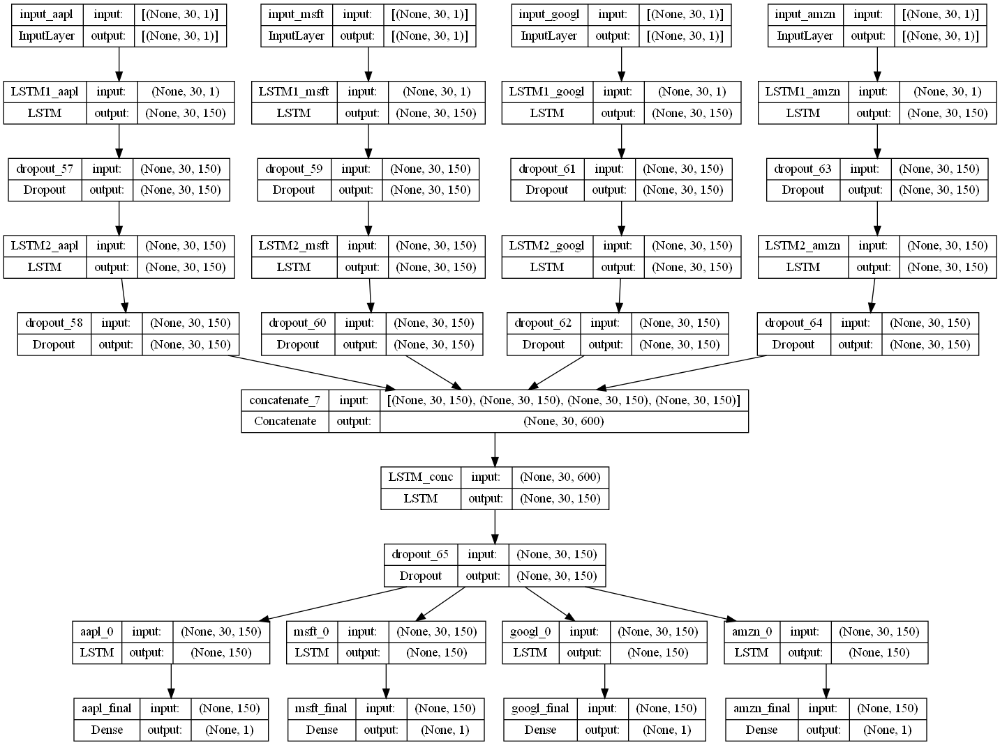

In [137]:
# Displaying the structure of the final model
plot_model(model5, show_shapes=True)

In [138]:
# Fitting Model
history = model5.fit(x=[X_train_aapl,X_train_msft,X_train_googl,X_train_amzn], y=[y_train_aapl,y_train_msft,y_train_googl,y_train_amzn], batch_size=32, epochs=30, validation_split=0.2)
evaluation = model5.evaluate([X_test_aapl,X_test_msft,X_test_googl,X_test_amzn], [y_test_aapl,y_test_msft,y_test_googl,y_test_amzn])
print(evaluation)

Epoch 1/30
69/69 [==============================] - 171s 2s/step - loss: 0.0050 - aapl_final_loss: 0.0012 - msft_final_loss: 7.0455e-04 - googl_final_loss: 0.0014 - amzn_final_loss: 0.0017 - val_loss: 0.0279 - val_aapl_final_loss: 0.0107 - val_msft_final_loss: 0.0136 - val_googl_final_loss: 0.0018 - val_amzn_final_loss: 0.0018
Epoch 2/30
69/69 [==============================] - 145s 2s/step - loss: 9.7936e-04 - aapl_final_loss: 1.5765e-04 - msft_final_loss: 1.2935e-04 - googl_final_loss: 2.4814e-04 - amzn_final_loss: 4.4421e-04 - val_loss: 0.0148 - val_aapl_final_loss: 0.0023 - val_msft_final_loss: 0.0074 - val_googl_final_loss: 0.0013 - val_amzn_final_loss: 0.0039
Epoch 3/30
69/69 [==============================] - 140s 2s/step - loss: 6.2131e-04 - aapl_final_loss: 9.2334e-05 - msft_final_loss: 8.7409e-05 - googl_final_loss: 1.9809e-04 - amzn_final_loss: 2.4347e-04 - val_loss: 0.0139 - val_aapl_final_loss: 0.0023 - val_msft_final_loss: 0.0082 - val_googl_final_loss: 0.0021 - val_amzn_

22/22 [==============================] - 15s 443ms/step


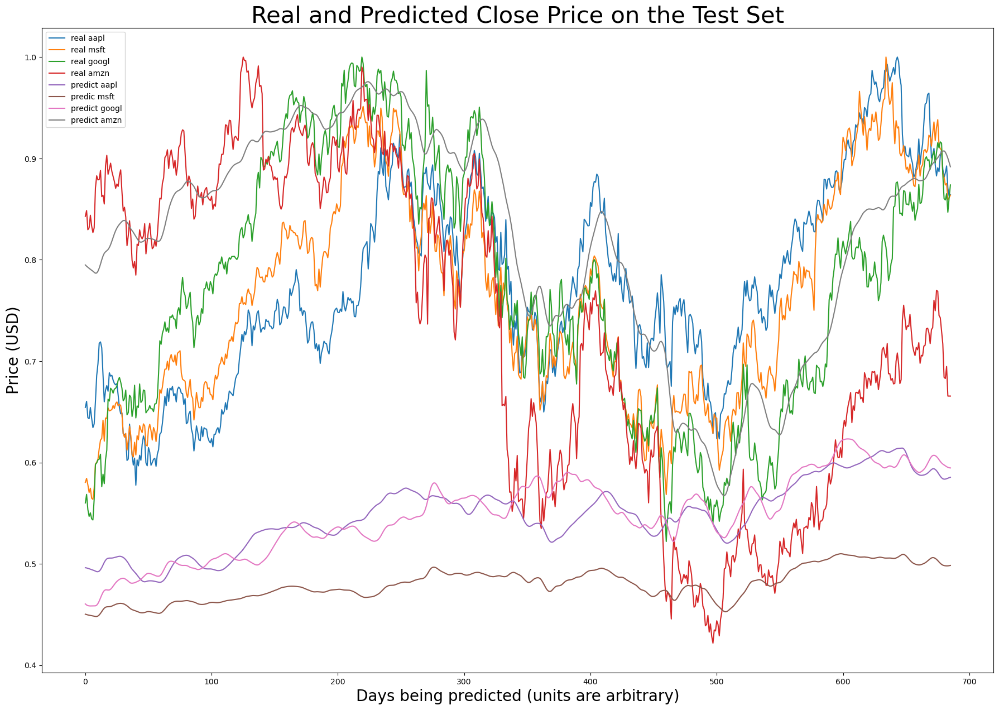

In [139]:
# Prediction data test
y_test_aapl_pred, y_test_msft_pred, y_test_googl_pred, y_test_amzn_pred= model5.predict([X_test_aapl,X_test_msft,X_test_googl,X_test_amzn])
preds_arr = np.hstack((y_test_aapl_pred, y_test_msft_pred, y_test_googl_pred, y_test_amzn_pred))
y_test_pred = preds_arr

aapl=0
msft=1
googl=2
amzn=3

plt.gcf().set_size_inches(22, 15, forward=True)
currentFig.set_facecolor('white')

real = plt.plot(y_test[:,:], label='real')
pred = plt.plot(y_test_pred[:,:], label='predicted')

plt.legend(['real aapl','real msft','real googl','real amzn','predict aapl','predic msft','predict googl','predict amzn'])
plt.xlabel('Days being predicted (units are arbitrary)', fontsize=20)
plt.ylabel('Price (USD)', fontsize=20)
plt.title('Real and Predicted Close Price on the Test Set', fontsize=30)

plt.show()

22/22 [==============================] - 7s 336ms/step


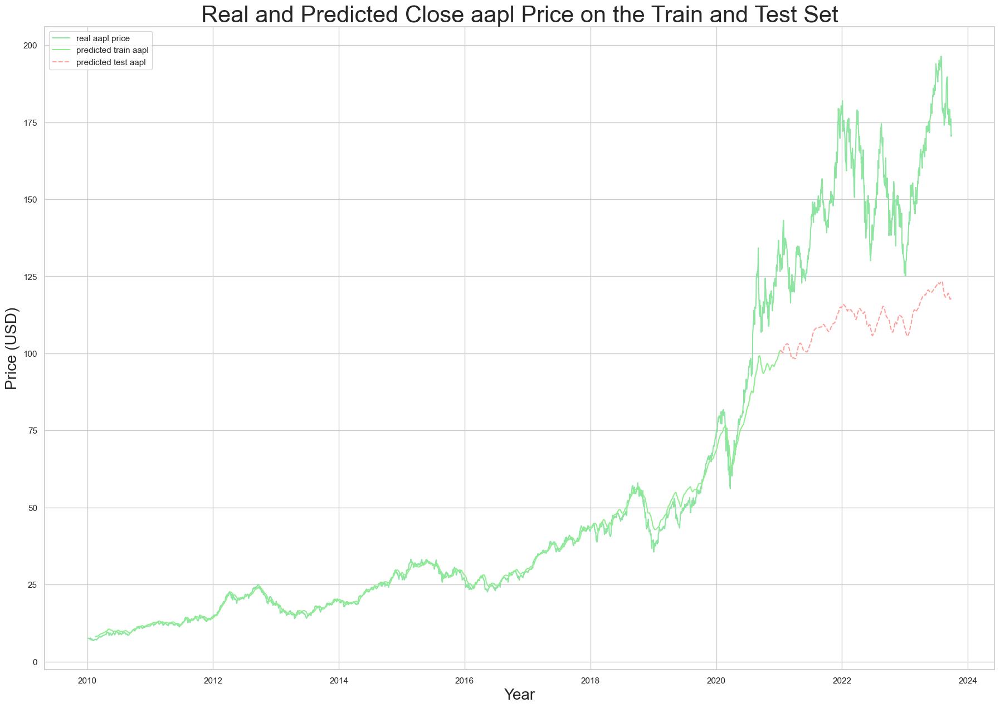

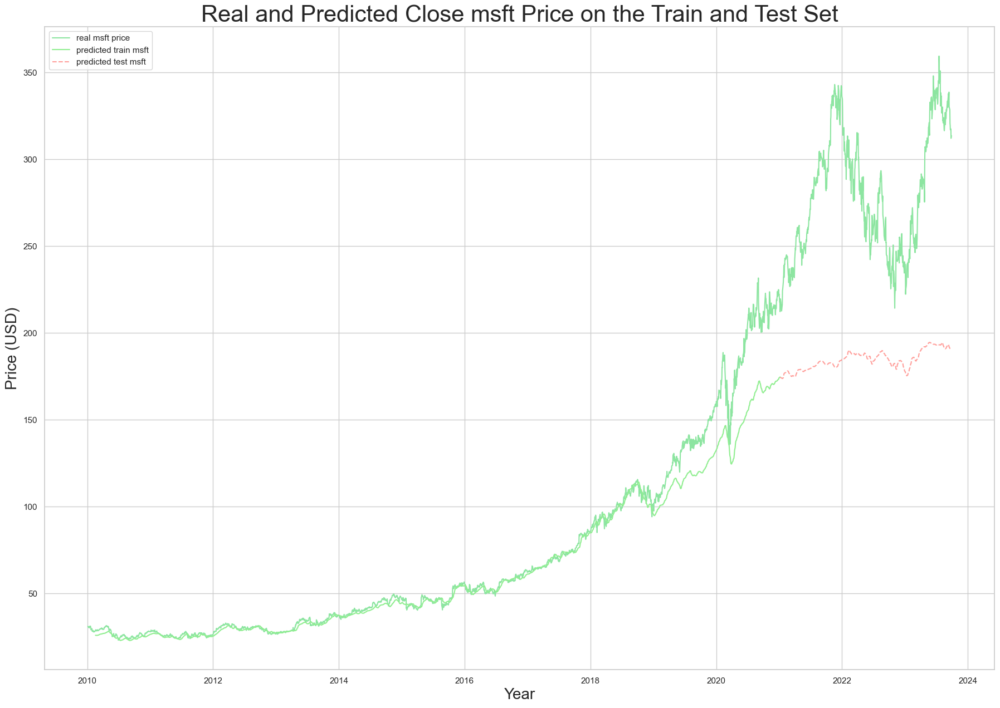

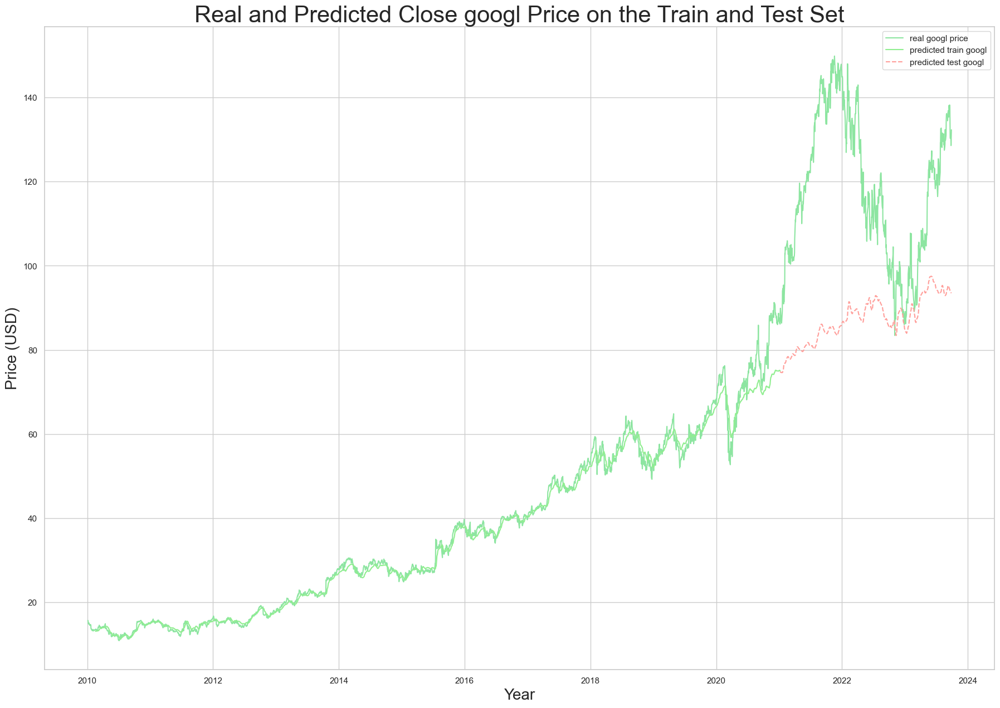

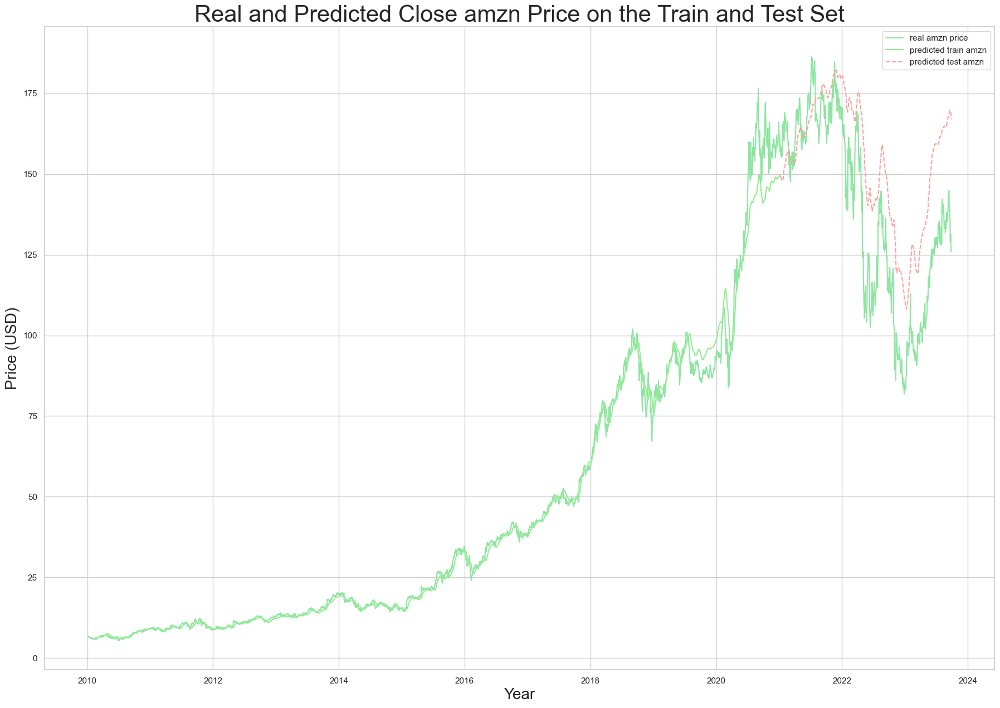

In [226]:
# Prediction data of each company
y_train_aapl_pred, y_train_msft_pred, y_train_googl_pred, y_train_amzn_pred= model5.predict([X_train_aapl,X_train_msft,X_train_googl,X_train_amzn])
y_test_aapl_pred, y_test_msft_pred, y_test_googl_pred, y_test_amzn_pred= model5.predict([X_test_aapl,X_test_msft,X_test_googl,X_test_amzn])
trainpreds_arr = np.hstack((y_train_aapl_pred, y_train_msft_pred, y_train_googl_pred, y_train_amzn_pred))
testpreds_arr = np.hstack((y_test_aapl_pred, y_test_msft_pred, y_test_googl_pred, y_test_amzn_pred))
y_train_pred = y_normaliser.inverse_transform(trainpreds_arr)
y_test_pred = y_normaliser.inverse_transform(testpreds_arr)

plt.gcf().set_size_inches(22, 15, forward=True)
# real values plotted
plt.plot(stock_df['Close_aapl'], label='real aapl price', color='g')

# predicted values plotted
plt.plot(dates_train, y_train_pred[:,aapl], label='predicted train aapl', color='lightgreen')
plt.plot(dates_test, y_test_pred[:,aapl], label='predicted test aapl', color='r', linestyle='dashed')

currentFig.set_facecolor('white')
plt.legend()
plt.xlabel('Year', fontsize=20)
plt.ylabel('Price (USD)', fontsize=20)
plt.title('Real and Predicted Close aapl Price on the Train and Test Set', fontsize=30)
plt.show()

plt.gcf().set_size_inches(22, 15, forward=True)
# real values plotted
plt.plot(stock_df['Close_msft'], label='real msft price', color='g')

# predicted values plotted
plt.plot(dates_train, y_train_pred[:,msft], label='predicted train msft', color='lightgreen')
plt.plot(dates_test, y_test_pred[:,msft], label='predicted test msft', color='r', linestyle='dashed')

currentFig.set_facecolor('white')
plt.legend()
plt.xlabel('Year', fontsize=20)
plt.ylabel('Price (USD)', fontsize=20)
plt.title('Real and Predicted Close msft Price on the Train and Test Set', fontsize=30)
plt.show()

plt.gcf().set_size_inches(22, 15, forward=True)
# real values plotted
plt.plot(stock_df['Close_googl'], label='real googl price', color='g')

# predicted values plotted
plt.plot(dates_train, y_train_pred[:,googl], label='predicted train googl', color='lightgreen')
plt.plot(dates_test, y_test_pred[:,googl], label='predicted test googl', color='r', linestyle='dashed')

currentFig.set_facecolor('white')
plt.legend()
plt.xlabel('Year', fontsize=20)
plt.ylabel('Price (USD)', fontsize=20)
plt.title('Real and Predicted Close googl Price on the Train and Test Set', fontsize=30)
plt.show()

plt.gcf().set_size_inches(22, 15, forward=True)
# real values plotted
plt.plot(stock_df['Close_amzn'], label='real amzn price', color='g')

# predicted values plotted
plt.plot(dates_train, y_train_pred[:,amzn], label='predicted train amzn', color='lightgreen')
plt.plot(dates_test, y_test_pred[:,amzn], label='predicted test amzn', color='r', linestyle='dashed')

currentFig.set_facecolor('white')
plt.legend()
plt.xlabel('Year', fontsize=20)
plt.ylabel('Price (USD)', fontsize=20)
plt.title('Real and Predicted Close amzn Price on the Train and Test Set', fontsize=30)
plt.show()

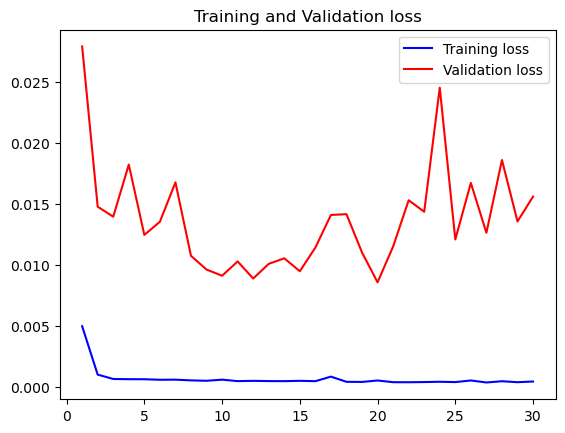

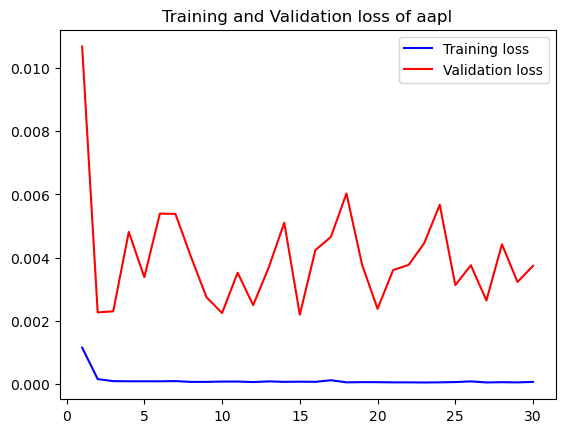

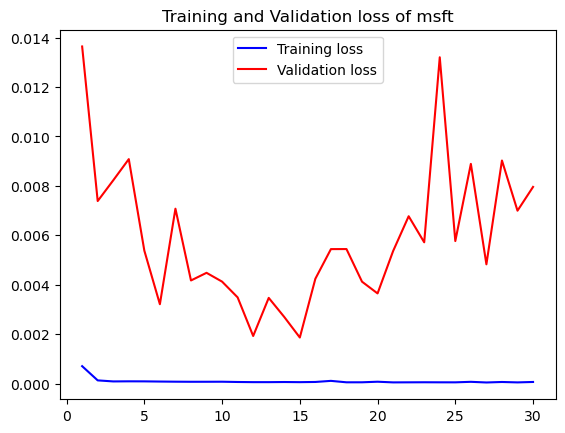

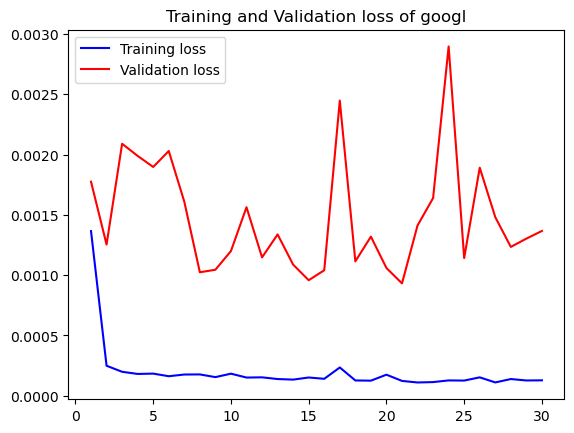

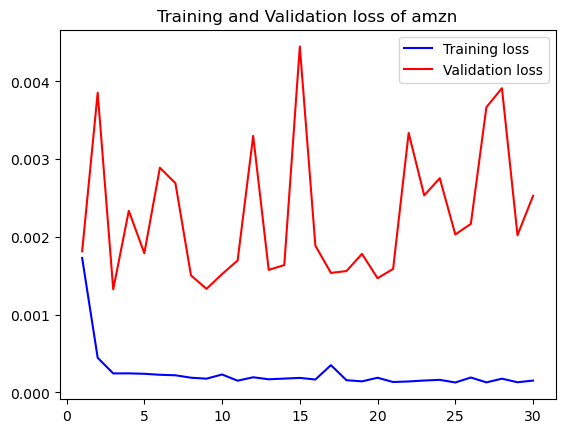

In [141]:
# Visualization Loss
loss = history.history['loss']
val_loss = history.history['val_loss']
aapl_loss = history.history['aapl_final_loss']
val_aapl_loss = history.history['val_aapl_final_loss']
msft_loss = history.history['msft_final_loss']
val_msft_loss = history.history['val_msft_final_loss']
googl_loss = history.history['googl_final_loss']
val_googl_loss = history.history['val_googl_final_loss']
amzn_loss = history.history['amzn_final_loss']
val_amzn_loss = history.history['val_amzn_final_loss']
epochs = range(1, len(loss) + 1)
plt.figure()

#Train and validation loss
plt.plot(epochs, loss, 'b', label='Training loss')
plt.plot(epochs, val_loss, 'r', label='Validation loss')
plt.title('Training and Validation loss')
plt.legend()
plt.show()

plt.plot(epochs, aapl_loss, 'b', label='Training loss')
plt.plot(epochs, val_aapl_loss, 'r', label='Validation loss')
plt.title('Training and Validation loss of aapl')
plt.legend()
plt.show()

plt.plot(epochs, msft_loss, 'b', label='Training loss')
plt.plot(epochs, val_msft_loss, 'r', label='Validation loss')
plt.title('Training and Validation loss of msft')
plt.legend()
plt.show()

plt.plot(epochs, googl_loss, 'b', label='Training loss')
plt.plot(epochs, val_googl_loss, 'r', label='Validation loss')
plt.title('Training and Validation loss of googl')
plt.legend()
plt.show()

plt.plot(epochs, amzn_loss, 'b', label='Training loss')
plt.plot(epochs, val_amzn_loss, 'r', label='Validation loss')
plt.title('Training and Validation loss of amzn')
plt.legend()
plt.show()

In [142]:
#Evaluation MAE, MSE, RMSE, MAPE of aapl Price 

# Calculating MAE performance metrics
mae_aapl_train = mean_absolute_error(unscaled_y_train_aapl, y_train_pred[:,aapl])

# Calculating Test Data MAE
mae_aapl_test = mean_absolute_error(unscaled_y_test_aapl, y_test_pred[:,aapl])

# Calculating MSE performance metrics
mse_aapl_train = mean_squared_error(unscaled_y_train_aapl, y_train_pred[:,aapl])

# Calculating Test Data MSE
mse_aapl_test = mean_squared_error(unscaled_y_test_aapl, y_test_pred[:,aapl])

# Calculating RMSE performance metrics
rmse_aapl_train = math.sqrt(mean_squared_error(unscaled_y_train_aapl, y_train_pred[:,aapl]))

# Calculating Test Data RMSE
rmse_aapl_test = math.sqrt(mean_squared_error(unscaled_y_test_aapl, y_test_pred[:,aapl]))

# Calculating MAPE performance metrics
mape_aapl_train = np.mean(np.abs((unscaled_y_train_aapl - y_train_pred[:,aapl])/unscaled_y_train_aapl))*100

# Calculating Test Data MAPE
mape_aapl_test = np.mean(np.abs((unscaled_y_test_aapl - y_test_pred[:,aapl])/unscaled_y_test_aapl))*100

print('Evaluation of aapl price','\nMAE Train:', mae_aapl_train, '\nMAE Test:', mae_aapl_test,
      '\nMSE Train:', mse_aapl_train, '\nMSE Test:', mse_aapl_test,
      '\nRMSE Train1:', rmse_aapl_train, '\nRMSE Test1:', rmse_aapl_test,
      '\nMAPE Train:', mape_aapl_train, '\nMAPE Test:', mape_aapl_test)

Evaluation of aapl price 
MAE Train: 2.1727567346838597 
MAE Test: 42.77449906463178 
MSE Train: 27.551355277965694 
MSE Test: 2000.5226558812192 
RMSE Train1: 5.248938490586996 
RMSE Test1: 44.72720263867638 
MAPE Train: 4.624037763716666 
MAPE Test: 27.25811915619331


In [143]:
#Evaluation MAE, MSE, RMSE, MAPE of msft Price 

# Calculating MAE performance metrics
mae_msft_train = mean_absolute_error(unscaled_y_train_msft, y_train_pred[:,msft])

# Calculating Test Data MAE
mae_msft_test = mean_absolute_error(unscaled_y_test_msft, y_test_pred[:,msft])

# Calculating MSE performance metrics
mse_msft_train = mean_squared_error(unscaled_y_train_msft, y_train_pred[:,msft])

# Calculating Test Data MSE
mse_msft_test = mean_squared_error(unscaled_y_test_msft, y_test_pred[:,msft])

# Calculating RMSE performance metrics
rmse_msft_train = math.sqrt(mean_squared_error(unscaled_y_train_msft, y_train_pred[:,msft]))

# Calculating Test Data RMSE
rmse_msft_test = math.sqrt(mean_squared_error(unscaled_y_test_msft, y_test_pred[:,msft]))

# Calculating MAPE performance metrics
mape_msft_train = np.mean(np.abs((unscaled_y_train_msft - y_train_pred[:,msft])/unscaled_y_train_msft))*100

# Calculating Test Data MAPE
mape_msft_test = np.mean(np.abs((unscaled_y_test_msft - y_test_pred[:,msft])/unscaled_y_test_msft))*100

print('Evaluation of msft price','\nMAE Train:', mae_msft_train, '\nMAE Test:', mae_msft_test,
      '\nMSE Train:', mse_msft_train, '\nMSE Test:', mse_msft_test,
      '\nRMSE Train1:', rmse_msft_train, '\nRMSE Test1:', rmse_msft_test,
      '\nMAPE Train:', mape_msft_train, '\nMAPE Test:', mape_msft_test)

Evaluation of msft price 
MAE Train: 6.322362013579633 
MAE Test: 95.5957798193217 
MSE Train: 183.09361272521787 
MSE Test: 10148.683869397319 
RMSE Train1: 13.531208841977788 
RMSE Test1: 100.74067633978501 
MAPE Train: 5.69345699016711 
MAPE Test: 33.25939097775471


In [144]:
#Evaluation MAE, MSE, RMSE, MAPE of googl Price 

# Calculating MAE performance metrics
mae_googl_train = mean_absolute_error(unscaled_y_train_googl, y_train_pred[:,googl])

# Calculating Test Data MAE
mae_googl_test = mean_absolute_error(unscaled_y_test_googl, y_test_pred[:,googl])

# Calculating MSE performance metrics
mse_googl_train = mean_squared_error(unscaled_y_train_googl, y_train_pred[:,googl])

# Calculating Test Data MSE
mse_googl_test = mean_squared_error(unscaled_y_test_googl, y_test_pred[:,googl])

# Calculating RMSE performance metrics
rmse_googl_train = math.sqrt(mean_squared_error(unscaled_y_train_googl, y_train_pred[:,googl]))

# Calculating Test Data RMSE
rmse_googl_test = math.sqrt(mean_squared_error(unscaled_y_test_googl, y_test_pred[:,googl]))

# Calculating MAPE performance metrics
mape_googl_train = np.mean(np.abs((unscaled_y_train_googl - y_train_pred[:,googl])/unscaled_y_train_googl))*100

# Calculating Test Data MAPE
mape_googl_test = np.mean(np.abs((unscaled_y_test_googl - y_test_pred[:,googl])/unscaled_y_test_googl))*100

print('Evaluation of googl price','\nMAE Train:', mae_googl_train, '\nMAE Test:', mae_googl_test,
      '\nMSE Train:', mse_googl_train, '\nMSE Test:', mse_googl_test,
      '\nRMSE Train1:', rmse_googl_train, '\nRMSE Test1:', rmse_googl_test,
      '\nMAPE Train:', mape_googl_train, '\nMAPE Test:', mape_googl_test)

Evaluation of googl price 
MAE Train: 1.3508913480479035 
MAE Test: 30.92459368914279 
MSE Train: 6.29585765911778 
MSE Test: 1258.5452599643547 
RMSE Train1: 2.509154769861313 
RMSE Test1: 35.47598145174217 
MAPE Train: 3.241558476105083 
MAPE Test: 24.675460026057134


In [145]:
#Evaluation MAE, MSE, RMSE, MAPE of amzn Price 

# Calculating MAE performance metrics
mae_amzn_train = mean_absolute_error(unscaled_y_train_amzn, y_train_pred[:,amzn])

# Calculating Test Data MAE
mae_amzn_test = mean_absolute_error(unscaled_y_test_amzn, y_test_pred[:,amzn])

# Calculating MSE performance metrics
mse_amzn_train = mean_squared_error(unscaled_y_train_amzn, y_train_pred[:,amzn])

# Calculating Test Data MSE
mse_amzn_test = mean_squared_error(unscaled_y_test_amzn, y_test_pred[:,amzn])

# Calculating RMSE performance metrics
rmse_amzn_train = math.sqrt(mean_squared_error(unscaled_y_train_amzn, y_train_pred[:,amzn]))

# Calculating Test Data RMSE
rmse_amzn_test = math.sqrt(mean_squared_error(unscaled_y_test_amzn, y_test_pred[:,amzn]))

# Calculating MAPE performance metrics
mape_amzn_train = np.mean(np.abs((unscaled_y_train_amzn - y_train_pred[:,amzn])/unscaled_y_train_amzn))*100

# Calculating Test Data MAPE
mape_amzn_test = np.mean(np.abs((unscaled_y_test_amzn - y_test_pred[:,amzn])/unscaled_y_test_amzn))*100

print('Evaluation of amzn price','\nMAE Train:', mae_amzn_train, '\nMAE Test:', mae_amzn_test,
      '\nMSE Train:', mse_amzn_train, '\nMSE Test:', mse_amzn_test,
      '\nRMSE Train1:', rmse_amzn_train, '\nRMSE Test1:', rmse_amzn_test,
      '\nMAPE Train:', mape_amzn_train, '\nMAPE Test:', mape_amzn_test)

Evaluation of amzn price 
MAE Train: 2.082124702431354 
MAE Test: 18.716907890475525 
MSE Train: 18.08080183395863 
MSE Test: 479.7984838848964 
RMSE Train1: 4.252152611790719 
RMSE Test1: 21.90430286233498 
MAPE Train: 4.149300322508759 
MAPE Test: 15.608893265383669


In [146]:
# Save data to excel
df_pred_test_norm = pd.DataFrame(data=testpreds_arr)
df_pred_train_norm = pd.DataFrame(data=trainpreds_arr)
df_pred_test = pd.DataFrame(data=y_test_pred)
df_pred_train = pd.DataFrame(data=y_train_pred)

file_name19 = 'TestPredNormData5.xlsx'
file_name20 = 'TrainPredNormData5.xlsx'
file_name21 = 'TestPredData5.xlsx'
file_name22 = 'TrainPredData5.xlsx'

df_pred_test_norm.to_excel(file_name19)
df_pred_train_norm.to_excel(file_name20)
df_pred_test.to_excel(file_name21)
df_pred_train.to_excel(file_name22)

# **Model4**

In [147]:
input_aapl = Input(shape=(num_days_used, num_features_aapl), name = 'input_aapl')
input_msft = Input(shape=(num_days_used, num_features_msft), name = 'input_msft')
input_googl = Input(shape=(num_days_used, num_features_googl), name = 'input_googl')
input_amzn = Input(shape=(num_days_used, num_features_amzn), name = 'input_amzn')

x1 = LSTM(150, return_sequences=True, name='LSTM1_aapl')(input_aapl)
x1 = Dropout(0.5)(x1)
x1 = LSTM(150, return_sequences=True, name='LSTM2_aapl')(x1)
x1 = Dropout(0.5)(x1)

x2 = LSTM(150, return_sequences=True, name='LSTM1_msft')(input_msft)
x2 = Dropout(0.5)(x2)
x2 = LSTM(150, return_sequences=True, name='LSTM2_msft')(x2)
x2 = Dropout(0.5)(x2)

x3 = LSTM(150, return_sequences=True, name='LSTM1_googl')(input_googl)
x3 = Dropout(0.5)(x3)
x3 = LSTM(150, return_sequences=True, name='LSTM2_googl')(x3)
x3 = Dropout(0.5)(x3)

x4 = LSTM(150, return_sequences=True, name='LSTM1_amzn')(input_amzn)
x4 = Dropout(0.5)(x4)
x4 = LSTM(150, return_sequences=True, name='LSTM2_amzn')(x4)
x4 = Dropout(0.5)(x4)

conc = concatenate([x1,x2,x3,x4])
conc = LSTM(150, return_sequences=True, name='LSTM_conc1')(conc)
conc = LSTM(150, return_sequences=True, name='LSTM_conc2')(conc)

output1 = LSTM(150, name='aapl_0')(conc)
output1 = Dense(1, name='aapl_final')(output1)

output2 = LSTM(150, name='msft_0')(conc)
output2 = Dense(1, name='msft_final')(output2)

output3 = LSTM(150, name='googl_0')(conc)
output3 = Dense(1, name='googl_final')(output3)

output4 = LSTM(150, name='amzn_0')(conc)
output4 = Dense(1, name='amzn_final')(output4)

model6 = Model(inputs = [input_aapl, input_msft, input_googl, input_amzn], outputs = [output1, output2, output3, output4])

adam = Adam(learning_rate=0.001)

model6.compile(optimizer=adam, loss='mse')
model6.summary()

Model: "model_8"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_aapl (InputLayer)     [(None, 30, 1)]              0         []                            
                                                                                                  
 input_msft (InputLayer)     [(None, 30, 1)]              0         []                            
                                                                                                  
 input_googl (InputLayer)    [(None, 30, 1)]              0         []                            
                                                                                                  
 input_amzn (InputLayer)     [(None, 30, 1)]              0         []                            
                                                                                            

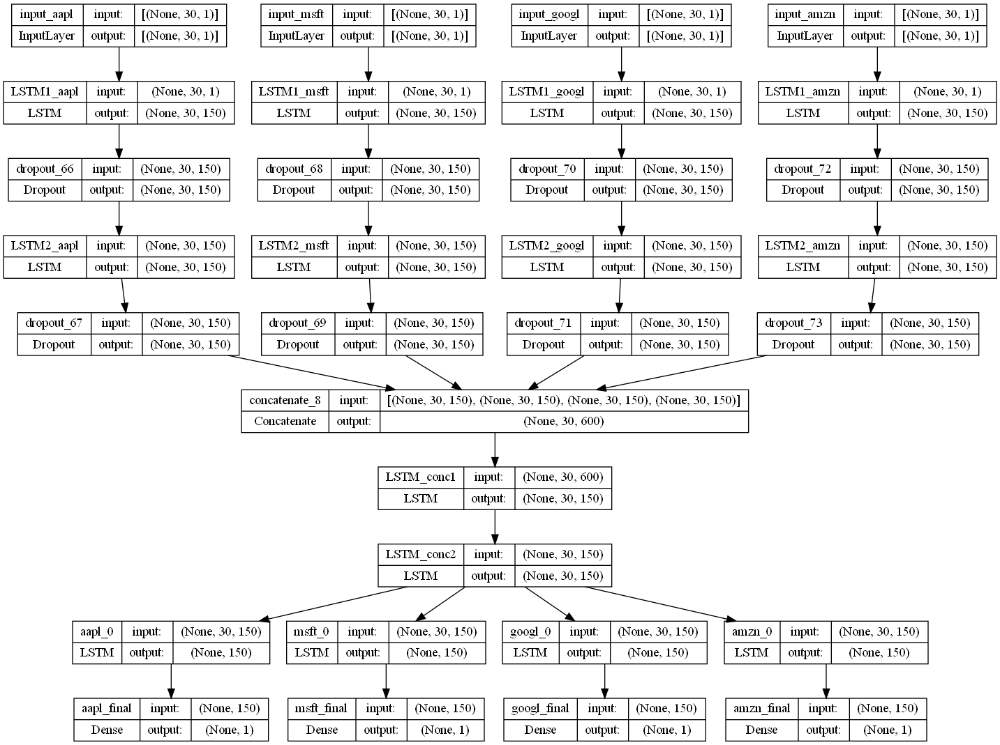

In [148]:
# Displaying the structure of the final model
plot_model(model6, show_shapes=True)

In [149]:
# Fitting Model
history = model6.fit(x=[X_train_aapl,X_train_msft,X_train_googl,X_train_amzn], y=[y_train_aapl,y_train_msft,y_train_googl,y_train_amzn], batch_size=32, epochs=30, validation_split=0.2)
evaluation = model6.evaluate([X_test_aapl,X_test_msft,X_test_googl,X_test_amzn], [y_test_aapl,y_test_msft,y_test_googl,y_test_amzn])
print(evaluation)

Epoch 1/30
69/69 [==============================] - 200s 2s/step - loss: 0.0081 - aapl_final_loss: 0.0014 - msft_final_loss: 0.0013 - googl_final_loss: 0.0024 - amzn_final_loss: 0.0029 - val_loss: 0.0303 - val_aapl_final_loss: 0.0149 - val_msft_final_loss: 0.0119 - val_googl_final_loss: 0.0014 - val_amzn_final_loss: 0.0021
Epoch 2/30
69/69 [==============================] - 164s 2s/step - loss: 7.7814e-04 - aapl_final_loss: 2.3126e-04 - msft_final_loss: 9.8476e-05 - googl_final_loss: 1.9893e-04 - amzn_final_loss: 2.4947e-04 - val_loss: 0.0372 - val_aapl_final_loss: 0.0128 - val_msft_final_loss: 0.0184 - val_googl_final_loss: 0.0040 - val_amzn_final_loss: 0.0020
Epoch 3/30
69/69 [==============================] - 160s 2s/step - loss: 6.0512e-04 - aapl_final_loss: 8.5106e-05 - msft_final_loss: 9.1595e-05 - googl_final_loss: 1.8211e-04 - amzn_final_loss: 2.4632e-04 - val_loss: 0.0253 - val_aapl_final_loss: 0.0035 - val_msft_final_loss: 0.0123 - val_googl_final_loss: 0.0068 - val_amzn_fina

22/22 [==============================] - 29s 548ms/step


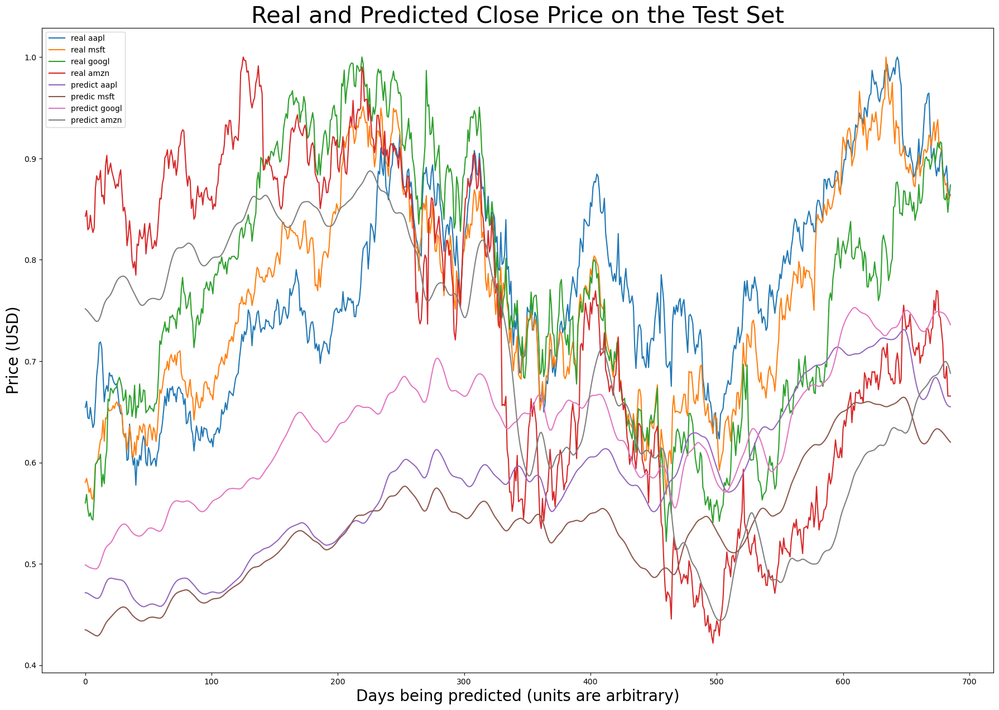

In [150]:
# Prediction data test
y_test_aapl_pred, y_test_msft_pred, y_test_googl_pred, y_test_amzn_pred= model6.predict([X_test_aapl,X_test_msft,X_test_googl,X_test_amzn])
preds_arr = np.hstack((y_test_aapl_pred, y_test_msft_pred, y_test_googl_pred, y_test_amzn_pred))
y_test_pred = preds_arr

aapl=0
msft=1
googl=2
amzn=3

plt.gcf().set_size_inches(22, 15, forward=True)
currentFig.set_facecolor('white')

real = plt.plot(y_test[:,:], label='real')
pred = plt.plot(y_test_pred[:,:], label='predicted')

plt.legend(['real aapl','real msft','real googl','real amzn','predict aapl','predic msft','predict googl','predict amzn'])
plt.xlabel('Days being predicted (units are arbitrary)', fontsize=20)
plt.ylabel('Price (USD)', fontsize=20)
plt.title('Real and Predicted Close Price on the Test Set', fontsize=30)

plt.show()

22/22 [==============================] - 12s 535ms/step


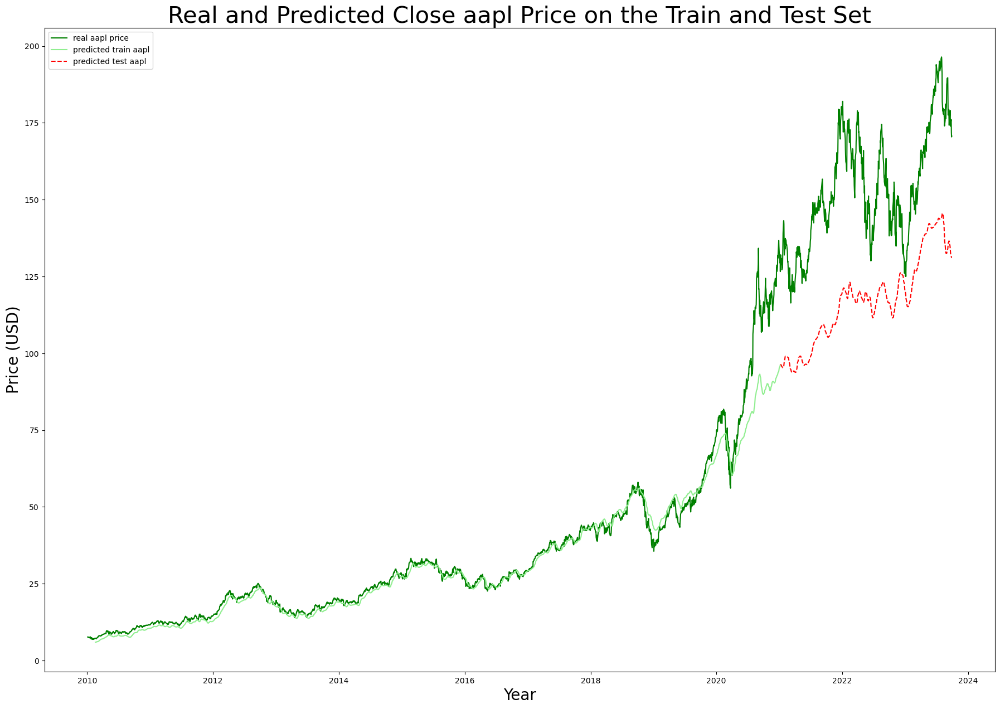

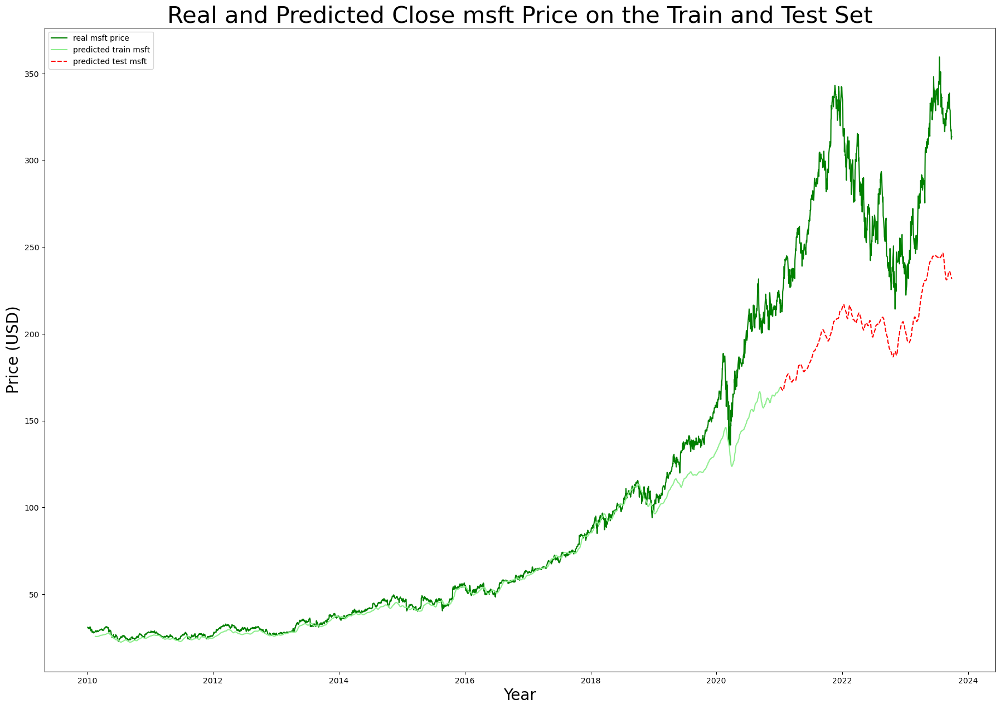

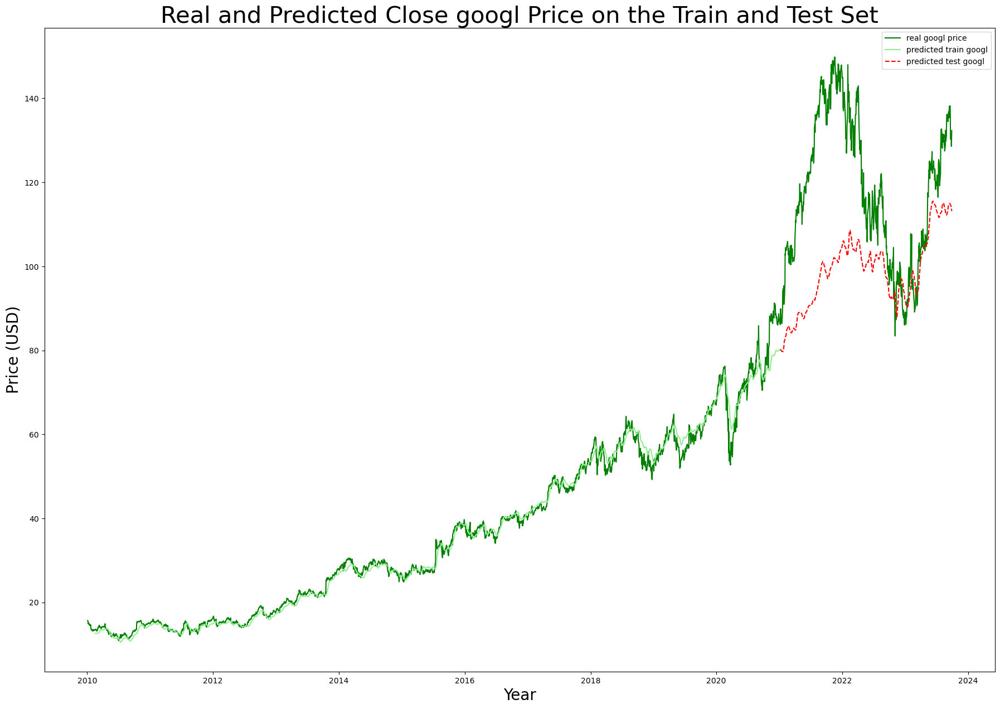

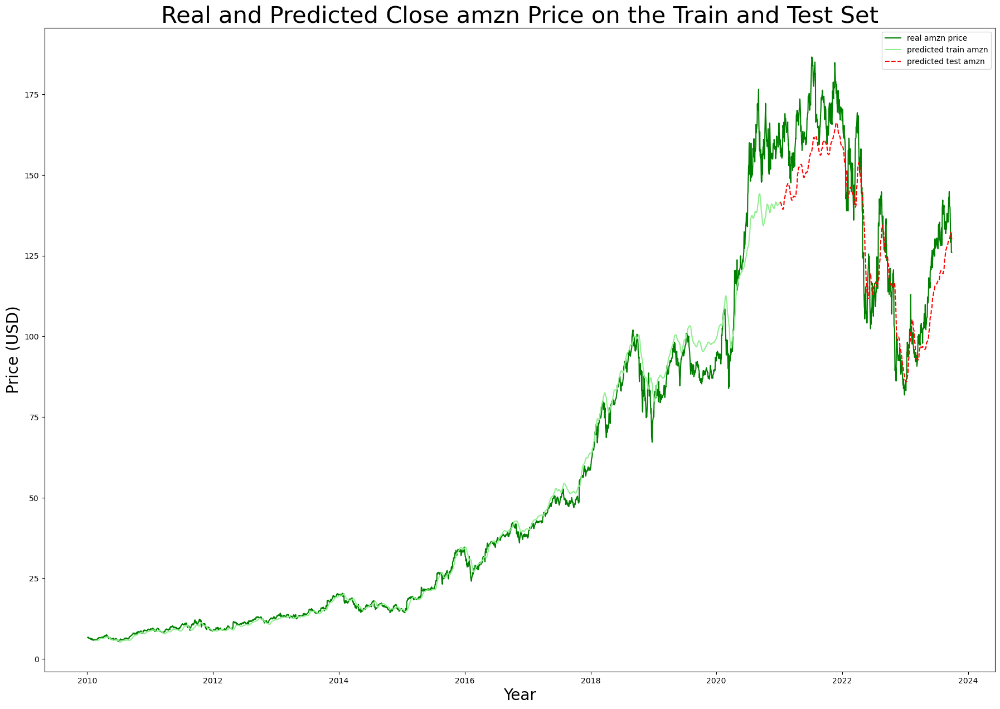

In [151]:
# Prediction data of each company
y_train_aapl_pred, y_train_msft_pred, y_train_googl_pred, y_train_amzn_pred= model6.predict([X_train_aapl,X_train_msft,X_train_googl,X_train_amzn])
y_test_aapl_pred, y_test_msft_pred, y_test_googl_pred, y_test_amzn_pred= model6.predict([X_test_aapl,X_test_msft,X_test_googl,X_test_amzn])
trainpreds_arr = np.hstack((y_train_aapl_pred, y_train_msft_pred, y_train_googl_pred, y_train_amzn_pred))
testpreds_arr = np.hstack((y_test_aapl_pred, y_test_msft_pred, y_test_googl_pred, y_test_amzn_pred))
y_train_pred = y_normaliser.inverse_transform(trainpreds_arr)
y_test_pred = y_normaliser.inverse_transform(testpreds_arr)

plt.gcf().set_size_inches(22, 15, forward=True)
# real values plotted
plt.plot(stock_df['Close_aapl'], label='real aapl price', color='g')

# predicted values plotted
plt.plot(dates_train, y_train_pred[:,aapl], label='predicted train aapl', color='lightgreen')
plt.plot(dates_test, y_test_pred[:,aapl], label='predicted test aapl', color='r', linestyle='dashed')

currentFig.set_facecolor('white')
plt.legend()
plt.xlabel('Year', fontsize=20)
plt.ylabel('Price (USD)', fontsize=20)
plt.title('Real and Predicted Close aapl Price on the Train and Test Set', fontsize=30)
plt.show()

plt.gcf().set_size_inches(22, 15, forward=True)
# real values plotted
plt.plot(stock_df['Close_msft'], label='real msft price', color='g')

# predicted values plotted
plt.plot(dates_train, y_train_pred[:,msft], label='predicted train msft', color='lightgreen')
plt.plot(dates_test, y_test_pred[:,msft], label='predicted test msft', color='r', linestyle='dashed')

currentFig.set_facecolor('white')
plt.legend()
plt.xlabel('Year', fontsize=20)
plt.ylabel('Price (USD)', fontsize=20)
plt.title('Real and Predicted Close msft Price on the Train and Test Set', fontsize=30)
plt.show()

plt.gcf().set_size_inches(22, 15, forward=True)
# real values plotted
plt.plot(stock_df['Close_googl'], label='real googl price', color='g')

# predicted values plotted
plt.plot(dates_train, y_train_pred[:,googl], label='predicted train googl', color='lightgreen')
plt.plot(dates_test, y_test_pred[:,googl], label='predicted test googl', color='r', linestyle='dashed')

currentFig.set_facecolor('white')
plt.legend()
plt.xlabel('Year', fontsize=20)
plt.ylabel('Price (USD)', fontsize=20)
plt.title('Real and Predicted Close googl Price on the Train and Test Set', fontsize=30)
plt.show()

plt.gcf().set_size_inches(22, 15, forward=True)
# real values plotted
plt.plot(stock_df['Close_amzn'], label='real amzn price', color='g')

# predicted values plotted
plt.plot(dates_train, y_train_pred[:,amzn], label='predicted train amzn', color='lightgreen')
plt.plot(dates_test, y_test_pred[:,amzn], label='predicted test amzn', color='r', linestyle='dashed')

currentFig.set_facecolor('white')
plt.legend()
plt.xlabel('Year', fontsize=20)
plt.ylabel('Price (USD)', fontsize=20)
plt.title('Real and Predicted Close amzn Price on the Train and Test Set', fontsize=30)
plt.show()

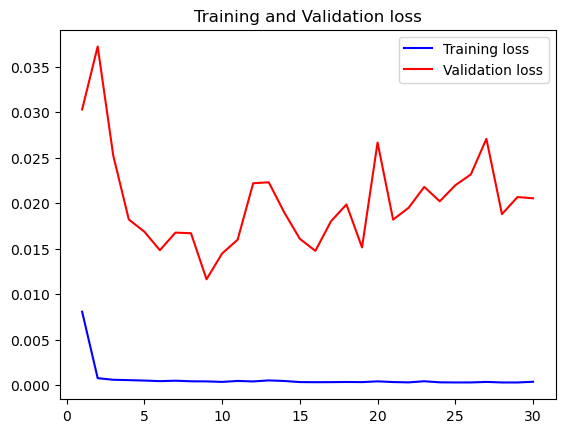

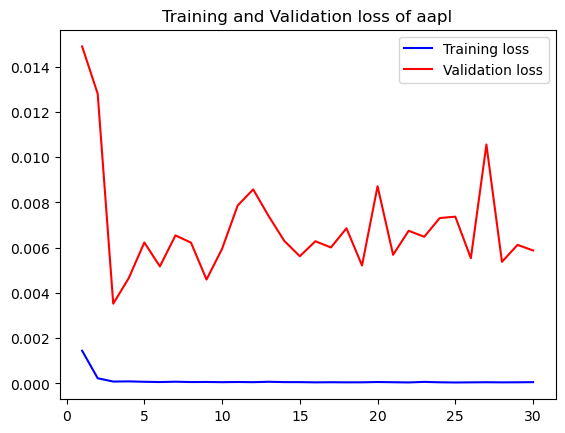

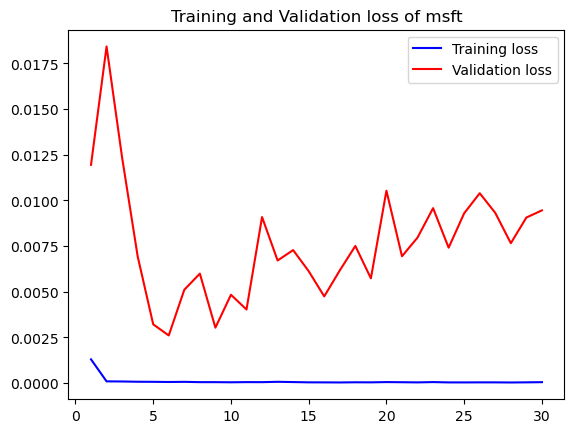

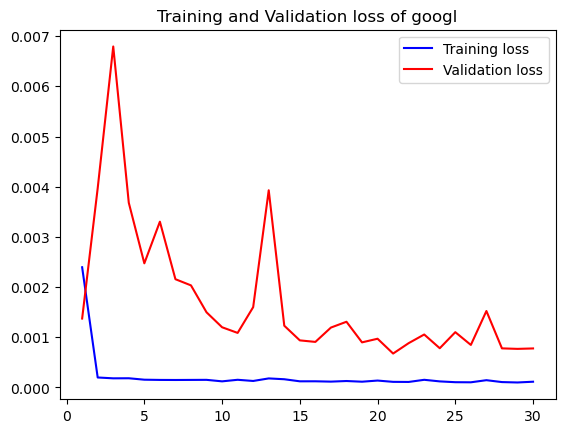

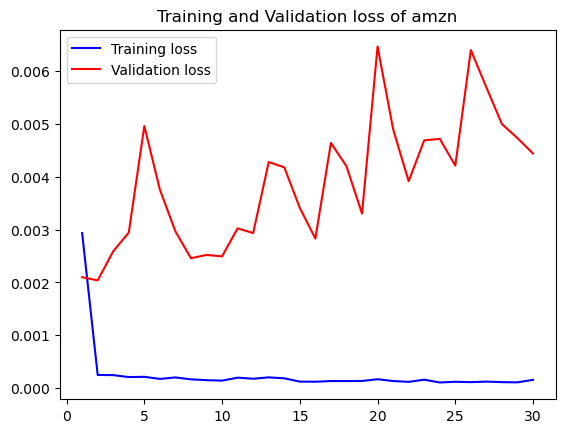

In [152]:
# Visualization Loss
loss = history.history['loss']
val_loss = history.history['val_loss']
aapl_loss = history.history['aapl_final_loss']
val_aapl_loss = history.history['val_aapl_final_loss']
msft_loss = history.history['msft_final_loss']
val_msft_loss = history.history['val_msft_final_loss']
googl_loss = history.history['googl_final_loss']
val_googl_loss = history.history['val_googl_final_loss']
amzn_loss = history.history['amzn_final_loss']
val_amzn_loss = history.history['val_amzn_final_loss']
epochs = range(1, len(loss) + 1)
plt.figure()

#Train and validation loss
plt.plot(epochs, loss, 'b', label='Training loss')
plt.plot(epochs, val_loss, 'r', label='Validation loss')
plt.title('Training and Validation loss')
plt.legend()
plt.show()

plt.plot(epochs, aapl_loss, 'b', label='Training loss')
plt.plot(epochs, val_aapl_loss, 'r', label='Validation loss')
plt.title('Training and Validation loss of aapl')
plt.legend()
plt.show()

plt.plot(epochs, msft_loss, 'b', label='Training loss')
plt.plot(epochs, val_msft_loss, 'r', label='Validation loss')
plt.title('Training and Validation loss of msft')
plt.legend()
plt.show()

plt.plot(epochs, googl_loss, 'b', label='Training loss')
plt.plot(epochs, val_googl_loss, 'r', label='Validation loss')
plt.title('Training and Validation loss of googl')
plt.legend()
plt.show()

plt.plot(epochs, amzn_loss, 'b', label='Training loss')
plt.plot(epochs, val_amzn_loss, 'r', label='Validation loss')
plt.title('Training and Validation loss of amzn')
plt.legend()
plt.show()

In [153]:
#Evaluation MAE, MSE, RMSE, MAPE of aapl Price 

# Calculating MAE performance metrics
mae_aapl_train = mean_absolute_error(unscaled_y_train_aapl, y_train_pred[:,aapl])

# Calculating Test Data MAE
mae_aapl_test = mean_absolute_error(unscaled_y_test_aapl, y_test_pred[:,aapl])

# Calculating MSE performance metrics
mse_aapl_train = mean_squared_error(unscaled_y_train_aapl, y_train_pred[:,aapl])

# Calculating Test Data MSE
mse_aapl_test = mean_squared_error(unscaled_y_test_aapl, y_test_pred[:,aapl])

# Calculating RMSE performance metrics
rmse_aapl_train = math.sqrt(mean_squared_error(unscaled_y_train_aapl, y_train_pred[:,aapl]))

# Calculating Test Data RMSE
rmse_aapl_test = math.sqrt(mean_squared_error(unscaled_y_test_aapl, y_test_pred[:,aapl]))

# Calculating MAPE performance metrics
mape_aapl_train = np.mean(np.abs((unscaled_y_train_aapl - y_train_pred[:,aapl])/unscaled_y_train_aapl))*100

# Calculating Test Data MAPE
mape_aapl_test = np.mean(np.abs((unscaled_y_test_aapl - y_test_pred[:,aapl])/unscaled_y_test_aapl))*100

print('Evaluation of aapl price','\nMAE Train:', mae_aapl_train, '\nMAE Test:', mae_aapl_test,
      '\nMSE Train:', mse_aapl_train, '\nMSE Test:', mse_aapl_test,
      '\nRMSE Train1:', rmse_aapl_train, '\nRMSE Test1:', rmse_aapl_test,
      '\nMAPE Train:', mape_aapl_train, '\nMAPE Test:', mape_aapl_test)

Evaluation of aapl price 
MAE Train: 2.857992227889603 
MAE Test: 36.527275274515844 
MSE Train: 43.45682123177444 
MSE Test: 1453.0993007016395 
RMSE Train1: 6.592178792461142 
RMSE Test1: 38.119539618175345 
MAPE Train: 6.873603117121391 
MAPE Test: 23.57768211961587


In [154]:
#Evaluation MAE, MSE, RMSE, MAPE of msft Price 

# Calculating MAE performance metrics
mae_msft_train = mean_absolute_error(unscaled_y_train_msft, y_train_pred[:,msft])

# Calculating Test Data MAE
mae_msft_test = mean_absolute_error(unscaled_y_test_msft, y_test_pred[:,msft])

# Calculating MSE performance metrics
mse_msft_train = mean_squared_error(unscaled_y_train_msft, y_train_pred[:,msft])

# Calculating Test Data MSE
mse_msft_test = mean_squared_error(unscaled_y_test_msft, y_test_pred[:,msft])

# Calculating RMSE performance metrics
rmse_msft_train = math.sqrt(mean_squared_error(unscaled_y_train_msft, y_train_pred[:,msft]))

# Calculating Test Data RMSE
rmse_msft_test = math.sqrt(mean_squared_error(unscaled_y_test_msft, y_test_pred[:,msft]))

# Calculating MAPE performance metrics
mape_msft_train = np.mean(np.abs((unscaled_y_train_msft - y_train_pred[:,msft])/unscaled_y_train_msft))*100

# Calculating Test Data MAPE
mape_msft_test = np.mean(np.abs((unscaled_y_test_msft - y_test_pred[:,msft])/unscaled_y_test_msft))*100

print('Evaluation of msft price','\nMAE Train:', mae_msft_train, '\nMAE Test:', mae_msft_test,
      '\nMSE Train:', mse_msft_train, '\nMSE Test:', mse_msft_test,
      '\nRMSE Train1:', rmse_msft_train, '\nRMSE Test1:', rmse_msft_test,
      '\nMAPE Train:', mape_msft_train, '\nMAPE Test:', mape_msft_test)

Evaluation of msft price 
MAE Train: 6.945965057389741 
MAE Test: 75.54123345199896 
MSE Train: 218.23954885294478 
MSE Test: 6268.669974198561 
RMSE Train1: 14.772932980723388 
RMSE Test1: 79.17493273883194 
MAPE Train: 6.738755999636205 
MAPE Test: 26.498722986759738


In [155]:
#Evaluation MAE, MSE, RMSE, MAPE of googl Price 

# Calculating MAE performance metrics
mae_googl_train = mean_absolute_error(unscaled_y_train_googl, y_train_pred[:,googl])

# Calculating Test Data MAE
mae_googl_test = mean_absolute_error(unscaled_y_test_googl, y_test_pred[:,googl])

# Calculating MSE performance metrics
mse_googl_train = mean_squared_error(unscaled_y_train_googl, y_train_pred[:,googl])

# Calculating Test Data MSE
mse_googl_test = mean_squared_error(unscaled_y_test_googl, y_test_pred[:,googl])

# Calculating RMSE performance metrics
rmse_googl_train = math.sqrt(mean_squared_error(unscaled_y_train_googl, y_train_pred[:,googl]))

# Calculating Test Data RMSE
rmse_googl_test = math.sqrt(mean_squared_error(unscaled_y_test_googl, y_test_pred[:,googl]))

# Calculating MAPE performance metrics
mape_googl_train = np.mean(np.abs((unscaled_y_train_googl - y_train_pred[:,googl])/unscaled_y_train_googl))*100

# Calculating Test Data MAPE
mape_googl_test = np.mean(np.abs((unscaled_y_test_googl - y_test_pred[:,googl])/unscaled_y_test_googl))*100

print('Evaluation of googl price','\nMAE Train:', mae_googl_train, '\nMAE Test:', mae_googl_test,
      '\nMSE Train:', mse_googl_train, '\nMSE Test:', mse_googl_test,
      '\nRMSE Train1:', rmse_googl_train, '\nRMSE Test1:', rmse_googl_test,
      '\nMAPE Train:', mape_googl_train, '\nMAPE Test:', mape_googl_test)

Evaluation of googl price 
MAE Train: 1.273842636292038 
MAE Test: 19.77367450057939 
MSE Train: 4.179028022293669 
MSE Test: 588.3901670320308 
RMSE Train1: 2.044267111287972 
RMSE Test1: 24.256755080431322 
MAPE Train: 3.534303110621833 
MAPE Test: 15.644069050869852


In [156]:
#Evaluation MAE, MSE, RMSE, MAPE of amzn Price 

# Calculating MAE performance metrics
mae_amzn_train = mean_absolute_error(unscaled_y_train_amzn, y_train_pred[:,amzn])

# Calculating Test Data MAE
mae_amzn_test = mean_absolute_error(unscaled_y_test_amzn, y_test_pred[:,amzn])

# Calculating MSE performance metrics
mse_amzn_train = mean_squared_error(unscaled_y_train_amzn, y_train_pred[:,amzn])

# Calculating Test Data MSE
mse_amzn_test = mean_squared_error(unscaled_y_test_amzn, y_test_pred[:,amzn])

# Calculating RMSE performance metrics
rmse_amzn_train = math.sqrt(mean_squared_error(unscaled_y_train_amzn, y_train_pred[:,amzn]))

# Calculating Test Data RMSE
rmse_amzn_test = math.sqrt(mean_squared_error(unscaled_y_test_amzn, y_test_pred[:,amzn]))

# Calculating MAPE performance metrics
mape_amzn_train = np.mean(np.abs((unscaled_y_train_amzn - y_train_pred[:,amzn])/unscaled_y_train_amzn))*100

# Calculating Test Data MAPE
mape_amzn_test = np.mean(np.abs((unscaled_y_test_amzn - y_test_pred[:,amzn])/unscaled_y_test_amzn))*100

print('Evaluation of amzn price','\nMAE Train:', mae_amzn_train, '\nMAE Test:', mae_amzn_test,
      '\nMSE Train:', mse_amzn_train, '\nMSE Test:', mse_amzn_test,
      '\nRMSE Train1:', rmse_amzn_train, '\nRMSE Test1:', rmse_amzn_test,
      '\nMAPE Train:', mape_amzn_train, '\nMAPE Test:', mape_amzn_test)

Evaluation of amzn price 
MAE Train: 2.8419787746376577 
MAE Test: 10.001010349818639 
MSE Train: 31.95666980197495 
MSE Test: 140.05430076023242 
RMSE Train1: 5.653023067525459 
RMSE Test1: 11.834453969669763 
MAPE Train: 5.506351376748582 
MAPE Test: 7.09469114365739


In [157]:
# Save data to excel
df_pred_test_norm = pd.DataFrame(data=testpreds_arr)
df_pred_train_norm = pd.DataFrame(data=trainpreds_arr)
df_pred_test = pd.DataFrame(data=y_test_pred)
df_pred_train = pd.DataFrame(data=y_train_pred)

file_name23 = 'TestPredNormData6.xlsx'
file_name24 = 'TrainPredNormData6.xlsx'
file_name25 = 'TestPredData6.xlsx'
file_name26 = 'TrainPredData6.xlsx'

df_pred_test_norm.to_excel(file_name23)
df_pred_train_norm.to_excel(file_name24)
df_pred_test.to_excel(file_name25)
df_pred_train.to_excel(file_name26)

# **Accuracy MAPE (Mean Absolute Percentage Error), RMSPE (Roor Mean Square Percentage Error) and RMDPE (Root Mean Dimention Percentage Error) GRU**

In [212]:
# access data excel from drive
path_lstm = 'C:/Users/ab854fx/OneDrive - EY/Desktop/LSTM and GRU/Code/LSTM/for accuracy calculation/LSTM.xlsx'
df_lstm = pd.ExcelFile(path_lstm)

In [213]:
# Read data excel
df0_lstm = pd.read_excel(path_lstm, 'Data Asli')
df3_lstm = pd.read_excel(path_lstm, 'Model3')
df4_lstm = pd.read_excel(path_lstm, 'Model4')
df5_lstm = pd.read_excel(path_lstm, 'Model5')
df6_lstm = pd.read_excel(path_lstm, 'Model6')

In [214]:
# drop unused data column
df0_gru.drop(['Date'],axis=1,inplace=True)
df3_gru.drop(['Date','Unnamed: 5'],axis=1,inplace=True)
df4_gru.drop(['Date','Unnamed: 5'],axis=1,inplace=True)
df5_gru.drop(['Date','Unnamed: 5'],axis=1,inplace=True)
df6_gru.drop(['Date','Unnamed: 5'],axis=1,inplace=True)

NameError: name 'df0_gru' is not defined

In [215]:
df0_lstm

,Close_aapl,Close_msft,Close_googl,Close_amzn
0,7.643214,30.950001,15.684434,6.695000
1,7.656429,30.959999,15.615365,6.734500
2,7.534643,30.770000,15.221722,6.612500
3,7.520714,30.450001,14.867367,6.500000
4,7.570714,30.660000,15.065566,6.676000
...,...,...,...,...
3453,174.789993,317.010010,130.250000,129.119995
3454,176.080002,317.540009,131.110001,131.270004
3455,171.960007,312.140015,128.570007,125.980003
3456,170.429993,312.790009,130.539993,125.980003


In [216]:
# Get data test
unscaled_data_lstm = df0_lstm.to_numpy()[2766:][0:len(df0_lstm)-2766, :]
unscaled_df3_lstm = df3_lstm.to_numpy()[2736:][0:len(df3_lstm)-2736, :]
unscaled_df4_lstm = df4_lstm.to_numpy()[2736:][0:len(df4_lstm)-2736, :]
unscaled_df5_lstm = df5_lstm.to_numpy()[2736:][0:len(df5_lstm)-2736, :]
unscaled_df6_lstm = df6_lstm.to_numpy()[2736:][0:len(df6_lstm)-2736, :]

In [209]:
unscaled_data_lstm

array([[134.86999512, 224.1499939 ,  87.88800049, 166.1000061 ],
       [133.72000122, 221.67999268,  86.8125    , 164.29249573],
       [132.69000244, 222.41999817,  87.63200378, 162.84649658],
       [129.41000366, 217.69000244,  86.3065033 , 159.33149719],
       [131.00999451, 217.8999939 ,  87.00250244, 160.92550659],
       [126.59999847, 212.25      ,  86.14399719, 156.91900635],
       [130.91999817, 218.28999329,  88.71700287, 158.10800171],
       [132.05000305, 219.61999512,  89.89150238, 159.13499451],
       [128.97999573, 217.49000549,  87.8144989 , 155.710495  ],
       [128.80000305, 214.92999268,  86.87149811, 156.04150391],
       [130.88999939, 216.33999634,  87.36250305, 158.29449463],
       [128.91000366, 213.02000427,  86.54599762, 156.37350464],
       [127.13999939, 212.6499939 ,  86.3809967 , 155.2124939 ],
       [127.83000183, 216.44000244,  89.22350311, 156.03799438],
       [132.02999878, 224.33999634,  94.00350189, 163.16900635],
       [136.86999512, 224

In [217]:
unscaled_data_lstm.shape

(692, 4)

In [219]:
aapl = 0
msft = 1
googl = 2
amzn = 3

# Calculate MAPE (Mean Absolute Percentage Error), RMSPE (Roor Mean Square Percentage Error) and RMDPE (Root Mean Dimention Percentage Error) for each company

#aapl
# MAPE
mape_aapl_model3_lstm = np.mean(np.abs((unscaled_data_lstm[:,aapl] - unscaled_df3_lstm[:,aapl])/unscaled_data_lstm[:,aapl]))*100
accuracy_mape_aapl_model3_lstm = 100-mape_aapl_model3_lstm
mape_aapl_model4_lstm = np.mean(np.abs((unscaled_data_lstm[:,aapl] - unscaled_df4_lstm[:,aapl])/unscaled_data_lstm[:,aapl]))*100
accuracy_mape_aapl_model4_lstm = 100-mape_aapl_model4_lstm
mape_aapl_model5_lstm = np.mean(np.abs((unscaled_data_lstm[:,aapl] - unscaled_df5_lstm[:,aapl])/unscaled_data_lstm[:,aapl]))*100
accuracy_mape_aapl_model5_lstm = 100-mape_aapl_model5_lstm
mape_aapl_model6_lstm = np.mean(np.abs((unscaled_data_lstm[:,aapl] - unscaled_df6_lstm[:,aapl])/unscaled_data_lstm[:,aapl]))*100
accuracy_mape_aapl_model6_lstm = 100-mape_aapl_model6_lstm

aapl_model3_lstm = ((unscaled_df3_lstm[:,aapl] - unscaled_data_lstm[:,aapl])/unscaled_data_lstm[:,aapl])
aapl_model4_lstm = ((unscaled_df4_lstm[:,aapl] - unscaled_data_lstm[:,aapl])/unscaled_data_lstm[:,aapl])
aapl_model5_lstm = ((unscaled_df5_lstm[:,aapl] - unscaled_data_lstm[:,aapl])/unscaled_data_lstm[:,aapl])
aapl_model6_lstm = ((unscaled_df6_lstm[:,aapl] - unscaled_data_lstm[:,aapl])/unscaled_data_lstm[:,aapl])

# RMSPE
rmspe_aapl_model3_lstm = np.array([None]*692)
for i in range(692):
  rmspe_aapl_model3_lstm[i] = math.pow(aapl_model3_lstm[i],2)
rmspe_aapl_model3_lstm = math.sqrt(np.mean(rmspe_aapl_model3_lstm))*100
accuracy_rmspe_aapl_model3_lstm = 100-rmspe_aapl_model3_lstm
rmspe_aapl_model4_lstm = np.array([None]*692)
for i in range(692):
  rmspe_aapl_model4_lstm[i] = math.pow(aapl_model4_lstm[i],2)
rmspe_aapl_model4_lstm = math.sqrt(np.mean(rmspe_aapl_model4_lstm))*100
accuracy_rmspe_aapl_model4_lstm = 100-rmspe_aapl_model4_lstm
rmspe_aapl_model5_lstm = np.array([None]*692)
for i in range(692):
  rmspe_aapl_model5_lstm[i] = math.pow(aapl_model5_lstm[i],2)
rmspe_aapl_model5_lstm = math.sqrt(np.mean(rmspe_aapl_model5_lstm))*100
accuracy_rmspe_aapl_model5_lstm = 100-rmspe_aapl_model5_lstm
rmspe_aapl_model6_lstm = np.array([None]*692)
for i in range(692):
  rmspe_aapl_model6_lstm[i] = math.pow(aapl_model6_lstm[i],2)
rmspe_aapl_model6_lstm = math.sqrt(np.mean(rmspe_aapl_model6_lstm))*100
accuracy_rmspe_aapl_model6_lstm = 100-rmspe_aapl_model6_lstm

# RMDPE
rmdpe_aapl_model3_lstm = np.array([None]*692)
for i in range(692):
  rmdpe_aapl_model3_lstm[i] = math.pow(aapl_model3_lstm[i],30)
rmdpe_aapl_model3_lstm = math.pow(np.mean(rmdpe_aapl_model3_lstm),1/30)*100
accuracy_rmdpe_aapl_model3_lstm = 100-rmdpe_aapl_model3_lstm
rmdpe_aapl_model4_lstm = np.array([None]*692)
for i in range(692):
  rmdpe_aapl_model4_lstm[i] = math.pow(aapl_model4_lstm[i],30)
rmdpe_aapl_model4_lstm = math.pow(np.mean(rmdpe_aapl_model4_lstm),1/30)*100
accuracy_rmdpe_aapl_model4_lstm = 100-rmdpe_aapl_model4_lstm
rmdpe_aapl_model5_lstm = np.array([None]*692)
for i in range(692):
  rmdpe_aapl_model5_lstm[i] = math.pow(aapl_model5_lstm[i],30)
rmdpe_aapl_model5_lstm = math.pow(np.mean(rmdpe_aapl_model5_lstm),1/30)*100
accuracy_rmdpe_aapl_model5_lstm = 100-rmdpe_aapl_model5_lstm
rmdpe_aapl_model6_lstm = np.array([None]*692)
for i in range(692):
  rmdpe_aapl_model6_lstm[i] = math.pow(aapl_model6_lstm[i],30)
rmdpe_aapl_model6_lstm = math.pow(np.mean(rmdpe_aapl_model6_lstm),1/30)*100
accuracy_rmdpe_aapl_model6_lstm = 100-rmdpe_aapl_model6_lstm

#msft
# MAPE
mape_msft_model3_lstm = np.mean(np.abs((unscaled_data_lstm[:,msft] - unscaled_df3_lstm[:,msft])/unscaled_data_lstm[:,msft]))*100
accuracy_mape_msft_model3_lstm = 100-mape_msft_model3_lstm
mape_msft_model4_lstm = np.mean(np.abs((unscaled_data_lstm[:,msft] - unscaled_df4_lstm[:,msft])/unscaled_data_lstm[:,msft]))*100
accuracy_mape_msft_model4_lstm = 100-mape_msft_model4_lstm
mape_msft_model5_lstm = np.mean(np.abs((unscaled_data_lstm[:,msft] - unscaled_df5_lstm[:,msft])/unscaled_data_lstm[:,msft]))*100
accuracy_mape_msft_model5_lstm = 100-mape_msft_model5_lstm
mape_msft_model6_lstm = np.mean(np.abs((unscaled_data_lstm[:,msft] - unscaled_df6_lstm[:,msft])/unscaled_data_lstm[:,msft]))*100
accuracy_mape_msft_model6_lstm = 100-mape_msft_model6_lstm

msft_model3_lstm = ((unscaled_df3_lstm[:,msft] - unscaled_data_lstm[:,msft])/unscaled_data_lstm[:,msft])
msft_model4_lstm = ((unscaled_df4_lstm[:,msft] - unscaled_data_lstm[:,msft])/unscaled_data_lstm[:,msft])
msft_model5_lstm = ((unscaled_df5_lstm[:,msft] - unscaled_data_lstm[:,msft])/unscaled_data_lstm[:,msft])
msft_model6_lstm = ((unscaled_df6_lstm[:,msft] - unscaled_data_lstm[:,msft])/unscaled_data_lstm[:,msft])

# RMSPE
rmspe_msft_model3_lstm = np.array([None]*692)
for i in range(692):
  rmspe_msft_model3_lstm[i] = math.pow(msft_model3_lstm[i],2)
rmspe_msft_model3_lstm = math.sqrt(np.mean(rmspe_msft_model3_lstm))*100
accuracy_rmspe_msft_model3_lstm = 100-rmspe_msft_model3_lstm
rmspe_msft_model4_lstm = np.array([None]*692)
for i in range(692):
  rmspe_msft_model4_lstm[i] = math.pow(msft_model4_lstm[i],2)
rmspe_msft_model4_lstm = math.sqrt(np.mean(rmspe_msft_model4_lstm))*100
accuracy_rmspe_msft_model4_lstm = 100-rmspe_msft_model4_lstm
rmspe_msft_model5_lstm = np.array([None]*692)
for i in range(692):
  rmspe_msft_model5_lstm[i] = math.pow(msft_model5_lstm[i],2)
rmspe_msft_model5_lstm = math.sqrt(np.mean(rmspe_msft_model5_lstm))*100
accuracy_rmspe_msft_model5_lstm = 100-rmspe_msft_model5_lstm
rmspe_msft_model6_lstm = np.array([None]*692)
for i in range(692):
  rmspe_msft_model6_lstm[i] = math.pow(msft_model6_lstm[i],2)
rmspe_msft_model6_lstm = math.sqrt(np.mean(rmspe_msft_model6_lstm))*100
accuracy_rmspe_msft_model6_lstm = 100-rmspe_msft_model6_lstm

# RMDPE
rmdpe_msft_model3_lstm = np.array([None]*692)
for i in range(692):
  rmdpe_msft_model3_lstm[i] = math.pow(msft_model3_lstm[i],30)
rmdpe_msft_model3_lstm = math.pow(np.mean(rmdpe_msft_model3_lstm),1/30)*100
accuracy_rmdpe_msft_model3_lstm = 100-rmdpe_msft_model3_lstm
rmdpe_msft_model4_lstm = np.array([None]*692)
for i in range(692):
  rmdpe_msft_model4_lstm[i] = math.pow(msft_model4_lstm[i],30)
rmdpe_msft_model4_lstm = math.pow(np.mean(rmdpe_msft_model4_lstm),1/30)*100
accuracy_rmdpe_msft_model4_lstm = 100-rmdpe_msft_model4_lstm
rmdpe_msft_model5_lstm = np.array([None]*692)
for i in range(692):
  rmdpe_msft_model5_lstm[i] = math.pow(msft_model5_lstm[i],30)
rmdpe_msft_model5_lstm = math.pow(np.mean(rmdpe_msft_model5_lstm),1/30)*100
accuracy_rmdpe_msft_model5_lstm = 100-rmdpe_msft_model5_lstm
rmdpe_msft_model6_lstm = np.array([None]*692)
for i in range(692):
  rmdpe_msft_model6_lstm[i] = math.pow(msft_model6_lstm[i],30)
rmdpe_msft_model6_lstm = math.pow(np.mean(rmdpe_msft_model6_lstm),1/30)*100
accuracy_rmdpe_msft_model6_lstm = 100-rmdpe_msft_model6_lstm

#googl
# MAPE
mape_googl_model3_lstm = np.mean(np.abs((unscaled_data_lstm[:,googl] - unscaled_df3_lstm[:,googl])/unscaled_data_lstm[:,googl]))*100
accuracy_mape_googl_model3_lstm = 100-mape_googl_model3_lstm
mape_googl_model4_lstm = np.mean(np.abs((unscaled_data_lstm[:,googl] - unscaled_df4_lstm[:,googl])/unscaled_data_lstm[:,googl]))*100
accuracy_mape_googl_model4_lstm = 100-mape_googl_model4_lstm
mape_googl_model5_lstm = np.mean(np.abs((unscaled_data_lstm[:,googl] - unscaled_df5_lstm[:,googl])/unscaled_data_lstm[:,googl]))*100
accuracy_mape_googl_model5_lstm = 100-mape_googl_model5_lstm
mape_googl_model6_lstm = np.mean(np.abs((unscaled_data_lstm[:,googl] - unscaled_df6_lstm[:,googl])/unscaled_data_lstm[:,googl]))*100
accuracy_mape_googl_model6_lstm = 100-mape_googl_model6_lstm

googl_model3_lstm = ((unscaled_df3_lstm[:,googl] - unscaled_data_lstm[:,googl])/unscaled_data_lstm[:,googl])
googl_model4_lstm = ((unscaled_df4_lstm[:,googl] - unscaled_data_lstm[:,googl])/unscaled_data_lstm[:,googl])
googl_model5_lstm = ((unscaled_df5_lstm[:,googl] - unscaled_data_lstm[:,googl])/unscaled_data_lstm[:,googl])
googl_model6_lstm = ((unscaled_df6_lstm[:,googl] - unscaled_data_lstm[:,googl])/unscaled_data_lstm[:,googl])

# RMSPE
rmspe_googl_model3_lstm = np.array([None]*692)
for i in range(692):
  rmspe_googl_model3_lstm[i] = math.pow(googl_model3_lstm[i],2)
rmspe_googl_model3_lstm = math.sqrt(np.mean(rmspe_googl_model3_lstm))*100
accuracy_rmspe_googl_model3_lstm = 100-rmspe_googl_model3_lstm
rmspe_googl_model4_lstm = np.array([None]*692)
for i in range(692):
  rmspe_googl_model4_lstm[i] = math.pow(googl_model4_lstm[i],2)
rmspe_googl_model4_lstm = math.sqrt(np.mean(rmspe_googl_model4_lstm))*100
accuracy_rmspe_googl_model4_lstm = 100-rmspe_googl_model4_lstm
rmspe_googl_model5_lstm = np.array([None]*692)
for i in range(692):
  rmspe_googl_model5_lstm[i] = math.pow(googl_model5_lstm[i],2)
rmspe_googl_model5_lstm = math.sqrt(np.mean(rmspe_googl_model5_lstm))*100
accuracy_rmspe_googl_model5_lstm = 100-rmspe_googl_model5_lstm
rmspe_googl_model6_lstm = np.array([None]*692)
for i in range(692):
  rmspe_googl_model6_lstm[i] = math.pow(googl_model6_lstm[i],2)
rmspe_googl_model6_lstm = math.sqrt(np.mean(rmspe_googl_model6_lstm))*100
accuracy_rmspe_googl_model6_lstm = 100-rmspe_googl_model6_lstm

# RMDPE
rmdpe_googl_model3_lstm = np.array([None]*692)
for i in range(692):
  rmdpe_googl_model3_lstm[i] = math.pow(googl_model3_lstm[i],30)
rmdpe_googl_model3_lstm = math.pow(np.mean(rmdpe_googl_model3_lstm),1/30)*100
accuracy_rmdpe_googl_model3_lstm = 100-rmdpe_googl_model3_lstm
rmdpe_googl_model4_lstm = np.array([None]*692)
for i in range(692):
  rmdpe_googl_model4_lstm[i] = math.pow(googl_model4_lstm[i],30)
rmdpe_googl_model4_lstm = math.pow(np.mean(rmdpe_googl_model4_lstm),1/30)*100
accuracy_rmdpe_googl_model4_lstm = 100-rmdpe_googl_model4_lstm
rmdpe_googl_model5_lstm = np.array([None]*692)
for i in range(692):
  rmdpe_googl_model5_lstm[i] = math.pow(googl_model5_lstm[i],30)
rmdpe_googl_model5_lstm = math.pow(np.mean(rmdpe_googl_model5_lstm),1/30)*100
accuracy_rmdpe_googl_model5_lstm = 100-rmdpe_googl_model5_lstm
rmdpe_googl_model6_lstm = np.array([None]*692)
for i in range(692):
  rmdpe_googl_model6_lstm[i] = math.pow(googl_model6_lstm[i],30)
rmdpe_googl_model6_lstm = math.pow(np.mean(rmdpe_googl_model6_lstm),1/30)*100
accuracy_rmdpe_googl_model6_lstm = 100-rmdpe_googl_model6_lstm

#amzn
# MAPE
mape_amzn_model3_lstm = np.mean(np.abs((unscaled_data_lstm[:,amzn] - unscaled_df3_lstm[:,amzn])/unscaled_data_lstm[:,amzn]))*100
accuracy_mape_amzn_model3_lstm = 100-mape_amzn_model3_lstm
mape_amzn_model4_lstm = np.mean(np.abs((unscaled_data_lstm[:,amzn] - unscaled_df4_lstm[:,amzn])/unscaled_data_lstm[:,amzn]))*100
accuracy_mape_amzn_model4_lstm = 100-mape_amzn_model4_lstm
mape_amzn_model5_lstm = np.mean(np.abs((unscaled_data_lstm[:,amzn] - unscaled_df5_lstm[:,amzn])/unscaled_data_lstm[:,amzn]))*100
accuracy_mape_amzn_model5_lstm = 100-mape_amzn_model5_lstm
mape_amzn_model6_lstm = np.mean(np.abs((unscaled_data_lstm[:,amzn] - unscaled_df6_lstm[:,amzn])/unscaled_data_lstm[:,amzn]))*100
accuracy_mape_amzn_model6_lstm = 100-mape_amzn_model6_lstm

amzn_model3_lstm = ((unscaled_df3_lstm[:,amzn] - unscaled_data_lstm[:,amzn])/unscaled_data_lstm[:,amzn])
amzn_model4_lstm = ((unscaled_df4_lstm[:,amzn] - unscaled_data_lstm[:,amzn])/unscaled_data_lstm[:,amzn])
amzn_model5_lstm = ((unscaled_df5_lstm[:,amzn] - unscaled_data_lstm[:,amzn])/unscaled_data_lstm[:,amzn])
amzn_model6_lstm = ((unscaled_df6_lstm[:,amzn] - unscaled_data_lstm[:,amzn])/unscaled_data_lstm[:,amzn])

# RMSPE
rmspe_amzn_model3_lstm = np.array([None]*692)
for i in range(692):
  rmspe_amzn_model3_lstm[i] = math.pow(amzn_model3_lstm[i],2)
rmspe_amzn_model3_lstm = math.sqrt(np.mean(rmspe_amzn_model3_lstm))*100
accuracy_rmspe_amzn_model3_lstm = 100-rmspe_amzn_model3_lstm
rmspe_amzn_model4_lstm = np.array([None]*692)
for i in range(692):
  rmspe_amzn_model4_lstm[i] = math.pow(amzn_model4_lstm[i],2)
rmspe_amzn_model4_lstm = math.sqrt(np.mean(rmspe_amzn_model4_lstm))*100
accuracy_rmspe_amzn_model4_lstm = 100-rmspe_amzn_model4_lstm
rmspe_amzn_model5_lstm = np.array([None]*692)
for i in range(692):
  rmspe_amzn_model5_lstm[i] = math.pow(amzn_model5_lstm[i],2)
rmspe_amzn_model5_lstm = math.sqrt(np.mean(rmspe_amzn_model5_lstm))*100
accuracy_rmspe_amzn_model5_lstm = 100-rmspe_amzn_model5_lstm
rmspe_amzn_model6_lstm = np.array([None]*692)
for i in range(692):
  rmspe_amzn_model6_lstm[i] = math.pow(amzn_model6_lstm[i],2)
rmspe_amzn_model6_lstm = math.sqrt(np.mean(rmspe_amzn_model6_lstm))*100
accuracy_rmspe_amzn_model6_lstm = 100-rmspe_amzn_model6_lstm

# RMDPE
rmdpe_amzn_model3_lstm = np.array([None]*692)
for i in range(692):
  rmdpe_amzn_model3_lstm[i] = math.pow(amzn_model3_lstm[i],30)
rmdpe_amzn_model3_lstm = math.pow(np.mean(rmdpe_amzn_model3_lstm),1/30)*100
accuracy_rmdpe_amzn_model3_lstm = 100-rmdpe_amzn_model3_lstm
rmdpe_amzn_model4_lstm = np.array([None]*692)
for i in range(692):
  rmdpe_amzn_model4_lstm[i] = math.pow(amzn_model4_lstm[i],30)
rmdpe_amzn_model4_lstm = math.pow(np.mean(rmdpe_amzn_model4_lstm),1/30)*100
accuracy_rmdpe_amzn_model4_lstm = 100-rmdpe_amzn_model4_lstm
rmdpe_amzn_model5_lstm = np.array([None]*692)
for i in range(692):
  rmdpe_amzn_model5_lstm[i] = math.pow(amzn_model5_lstm[i],30)
rmdpe_amzn_model5_lstm = math.pow(np.mean(rmdpe_amzn_model5_lstm),1/30)*100
accuracy_rmdpe_amzn_model5_lstm = 100-rmdpe_amzn_model5_lstm
rmdpe_amzn_model6_lstm = np.array([None]*692)
for i in range(692):
  rmdpe_amzn_model6_lstm[i] = math.pow(amzn_model6_lstm[i],30)
rmdpe_amzn_model6_lstm = math.pow(np.mean(rmdpe_amzn_model6_lstm),1/30)*100
accuracy_rmdpe_amzn_model6_lstm = 100-rmdpe_amzn_model6_lstm

print('\n\nMODEL 1 lstm', '\nMAPE_model3_aapl:', mape_aapl_model3_lstm, '\nRMSPE_model3_aapl:', rmspe_aapl_model3_lstm, '\nRMDPE_model3_aapl:', rmdpe_aapl_model3_lstm, 
      '\nAkurasi_MAPE_model3_aapl:', accuracy_mape_aapl_model3_lstm, '\nAkurasi_RMSPE_model3_aapl:', accuracy_rmspe_aapl_model3_lstm, 
      '\nAkurasi_RMDPE_model3_aapl:', accuracy_rmdpe_aapl_model3_lstm, 
      '\n\nMAPE_model3_msft:', mape_msft_model3_lstm, '\nRMSPE_model3_msft:', rmspe_msft_model3_lstm, '\nRMDPE_model3_msft:', rmdpe_msft_model3_lstm, 
      '\nAkurasi_MAPE_model3_msft:', accuracy_mape_msft_model3_lstm, '\nAkurasi_RMSPE_model3_msft:', accuracy_rmspe_msft_model3_lstm, 
      '\nAkurasi_RMDPE_model3_msft:', accuracy_rmdpe_msft_model3_lstm,
      '\n\nMAPE_model3_googl:', mape_googl_model3_lstm, '\nRMSPE_model3_googl:', rmspe_googl_model3_lstm, '\nRMDPE_model3_googl:', rmdpe_googl_model3_lstm, 
      '\nAkurasi_MAPE_model3_googl:', accuracy_mape_googl_model3_lstm, '\nAkurasi_RMSPE_model3_googl:', accuracy_rmspe_googl_model3_lstm, 
      '\nAkurasi_RMDPE_model3_googl:', accuracy_rmdpe_googl_model3_lstm,
      '\n\nMAPE_model3_amzn:', mape_amzn_model3_lstm, '\nRMSPE_model3_amzn:', rmspe_amzn_model3_lstm, '\nRMDPE_model3_amzn:', rmdpe_amzn_model3_lstm, 
      '\nAkurasi_MAPE_model3_amzn:', accuracy_mape_amzn_model3_lstm, '\nAkurasi_RMSPE_model3_amzn:', accuracy_rmspe_amzn_model3_lstm, 
      '\nAkurasi_RMDPE_model3_amzn:', accuracy_rmdpe_amzn_model3_lstm,
    '\n\nMODEL 2 lstm', '\nMAPE_model4_aapl:', mape_aapl_model4_lstm, '\nRMSPE_model4_aapl:', rmspe_aapl_model4_lstm, '\nRMDPE_model4_aapl:', rmdpe_aapl_model4_lstm, 
      '\nAkurasi_MAPE_model4_aapl:', accuracy_mape_aapl_model4_lstm, '\nAkurasi_RMSPE_model4_aapl:', accuracy_rmspe_aapl_model4_lstm, 
      '\nAkurasi_RMDPE_model4_aapl:', accuracy_rmdpe_aapl_model4_lstm, 
      '\n\nMAPE_model4_msft:', mape_msft_model4_lstm, '\nRMSPE_model4_msft:', rmspe_msft_model4_lstm, '\nRMDPE_model4_msft:', rmdpe_msft_model4_lstm, 
      '\nAkurasi_MAPE_model4_msft:', accuracy_mape_msft_model4_lstm, '\nAkurasi_RMSPE_model4_msft:', accuracy_rmspe_msft_model4_lstm, 
      '\nAkurasi_RMDPE_model4_msft:', accuracy_rmdpe_msft_model4_lstm,
      '\n\nMAPE_model4_googl:', mape_googl_model4_lstm, '\nRMSPE_model4_googl:', rmspe_googl_model4_lstm, '\nRMDPE_model4_googl:', rmdpe_googl_model4_lstm, 
      '\nAkurasi_MAPE_model4_googl:', accuracy_mape_googl_model4_lstm, '\nAkurasi_RMSPE_model4_googl:', accuracy_rmspe_googl_model4_lstm, 
      '\nAkurasi_RMDPE_model4_googl:', accuracy_rmdpe_googl_model4_lstm,
      '\n\nMAPE_model4_amzn:', mape_amzn_model4_lstm, '\nRMSPE_model4_amzn:', rmspe_amzn_model4_lstm, '\nRMDPE_model4_amzn:', rmdpe_amzn_model4_lstm, 
      '\nAkurasi_MAPE_model4_amzn:', accuracy_mape_amzn_model4_lstm, '\nAkurasi_RMSPE_model4_amzn:', accuracy_rmspe_amzn_model4_lstm, 
      '\nAkurasi_RMDPE_model4_amzn:', accuracy_rmdpe_amzn_model4_lstm,
    '\n\nMODEL 3 lstm', '\nMAPE_model5_aapl:', mape_aapl_model5_lstm, '\nRMSPE_model5_aapl:', rmspe_aapl_model5_lstm, '\nRMDPE_model5_aapl:', rmdpe_aapl_model5_lstm, 
      '\nAkurasi_MAPE_model5_aapl:', accuracy_mape_aapl_model5_lstm, '\nAkurasi_RMSPE_model5_aapl:', accuracy_rmspe_aapl_model5_lstm, 
      '\nAkurasi_RMDPE_model5_aapl:', accuracy_rmdpe_aapl_model5_lstm, 
      '\n\nMAPE_model5_msft:', mape_msft_model5_lstm, '\nRMSPE_model5_msft:', rmspe_msft_model5_lstm, '\nRMDPE_model5_msft:', rmdpe_msft_model5_lstm, 
      '\nAkurasi_MAPE_model5_msft:', accuracy_mape_msft_model5_lstm, '\nAkurasi_RMSPE_model5_msft:', accuracy_rmspe_msft_model5_lstm, 
      '\nAkurasi_RMDPE_model5_msft:', accuracy_rmdpe_msft_model5_lstm,
      '\n\nMAPE_model5_googl:', mape_googl_model5_lstm, '\nRMSPE_model5_googl:', rmspe_googl_model5_lstm, '\nRMDPE_model5_googl:', rmdpe_googl_model5_lstm, 
      '\nAkurasi_MAPE_model5_googl:', accuracy_mape_googl_model5_lstm, '\nAkurasi_RMSPE_model5_googl:', accuracy_rmspe_googl_model5_lstm, 
      '\nAkurasi_RMDPE_model5_googl:', accuracy_rmdpe_googl_model5_lstm,
      '\n\nMAPE_model5_amzn:', mape_amzn_model5_lstm, '\nRMSPE_model5_amzn:', rmspe_amzn_model5_lstm, '\nRMDPE_model5_amzn:', rmdpe_amzn_model5_lstm, 
      '\nAkurasi_MAPE_model5_amzn:', accuracy_mape_amzn_model5_lstm, '\nAkurasi_RMSPE_model5_amzn:', accuracy_rmspe_amzn_model5_lstm, 
      '\nAkurasi_RMDPE_model5_amzn:', accuracy_rmdpe_amzn_model5_lstm,
    '\n\nMODEL 4 lstm', '\nMAPE_model6_aapl:', mape_aapl_model6_lstm, '\nRMSPE_model6_aapl:', rmspe_aapl_model6_lstm, '\nRMDPE_model6_aapl:', rmdpe_aapl_model6_lstm, 
      '\nAkurasi_MAPE_model6_aapl:', accuracy_mape_aapl_model6_lstm, '\nAkurasi_RMSPE_model6_aapl:', accuracy_rmspe_aapl_model6_lstm, 
      '\nAkurasi_RMDPE_model6_aapl:', accuracy_rmdpe_aapl_model6_lstm, 
      '\n\nMAPE_model6_msft:', mape_msft_model6_lstm, '\nRMSPE_model6_msft:', rmspe_msft_model6_lstm, '\nRMDPE_model6_msft:', rmdpe_msft_model6_lstm, 
      '\nAkurasi_MAPE_model6_msft:', accuracy_mape_msft_model6_lstm, '\nAkurasi_RMSPE_model6_msft:', accuracy_rmspe_msft_model6_lstm, 
      '\nAkurasi_RMDPE_model6_msft:', accuracy_rmdpe_msft_model6_lstm,
      '\n\nMAPE_model6_googl:', mape_googl_model6_lstm, '\nRMSPE_model6_googl:', rmspe_googl_model6_lstm, '\nRMDPE_model6_googl:', rmdpe_googl_model6_lstm, 
      '\nAkurasi_MAPE_model6_googl:', accuracy_mape_googl_model6_lstm, '\nAkurasi_RMSPE_model6_googl:', accuracy_rmspe_googl_model6_lstm, 
      '\nAkurasi_RMDPE_model6_googl:', accuracy_rmdpe_googl_model6_lstm,
      '\n\nMAPE_model6_amzn:', mape_amzn_model6_lstm, '\nRMSPE_model6_amzn:', rmspe_amzn_model6_lstm, '\nRMDPE_model6_amzn:', rmdpe_amzn_model6_lstm, 
      '\nAkurasi_MAPE_model6_amzn:', accuracy_mape_amzn_model6_lstm, '\nAkurasi_RMSPE_model6_amzn:', accuracy_rmspe_amzn_model6_lstm, 
      '\nAkurasi_RMDPE_model6_amzn:', accuracy_rmdpe_amzn_model6_lstm)



MODEL 1 lstm 
MAPE_model3_aapl: 19.515131871473063 
RMSPE_model3_aapl: 19.861478184684934 
RMDPE_model3_aapl: 24.044335363703958 
Akurasi_MAPE_model3_aapl: 80.48486812852694 
Akurasi_RMSPE_model3_aapl: 80.13852181531507 
Akurasi_RMDPE_model3_aapl: 75.95566463629604 

MAPE_model3_msft: 15.012971832838737 
RMSPE_model3_msft: 15.590342311465799 
RMDPE_model3_msft: 21.07815192324636 
Akurasi_MAPE_model3_msft: 84.98702816716127 
Akurasi_RMSPE_model3_msft: 84.4096576885342 
Akurasi_RMDPE_model3_msft: 78.92184807675363 

MAPE_model3_googl: 15.921648265780297 
RMSPE_model3_googl: 17.096641368862787 
RMDPE_model3_googl: 24.1106252040898 
Akurasi_MAPE_model3_googl: 84.07835173421971 
Akurasi_RMSPE_model3_googl: 82.90335863113721 
Akurasi_RMDPE_model3_googl: 75.8893747959102 

MAPE_model3_amzn: 19.291718024856205 
RMSPE_model3_amzn: 21.32192351638162 
RMDPE_model3_amzn: 40.94295102438562 
Akurasi_MAPE_model3_amzn: 80.70828197514379 
Akurasi_RMSPE_model3_amzn: 78.67807648361838 
Akurasi_RMDPE_mo

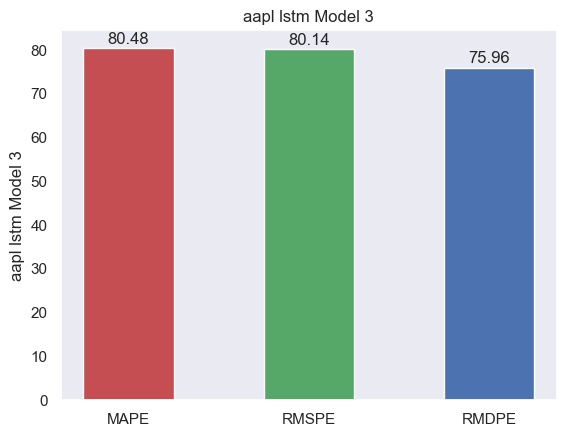

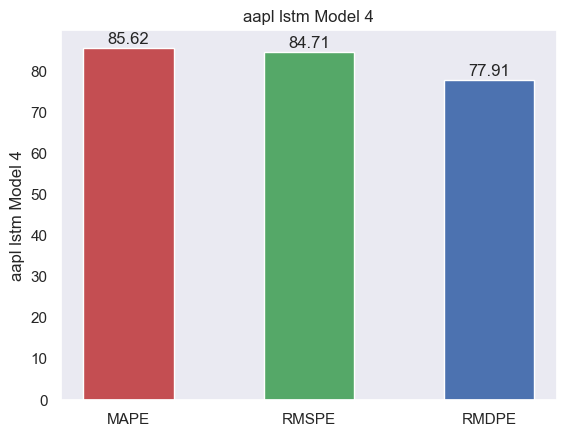

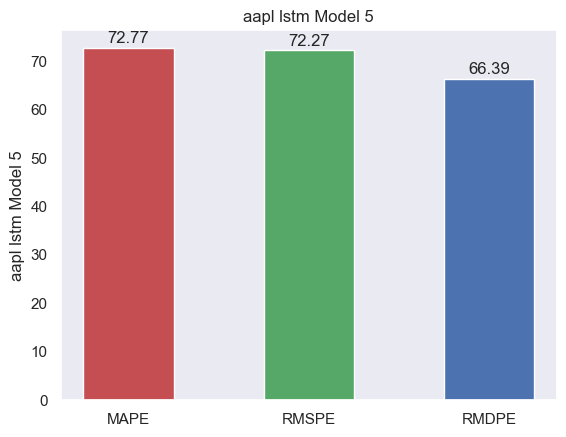

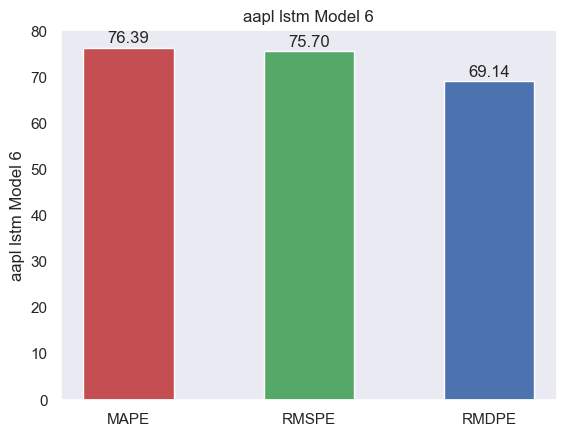

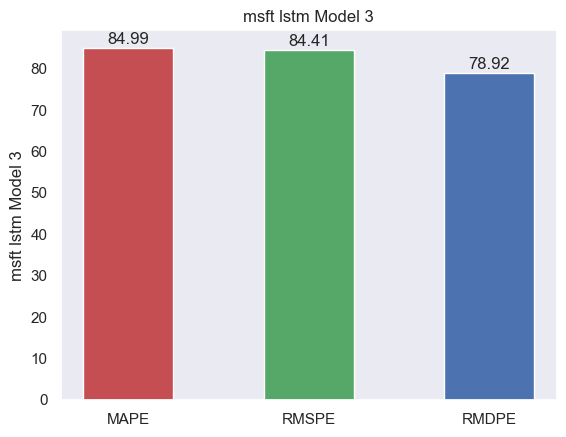

...

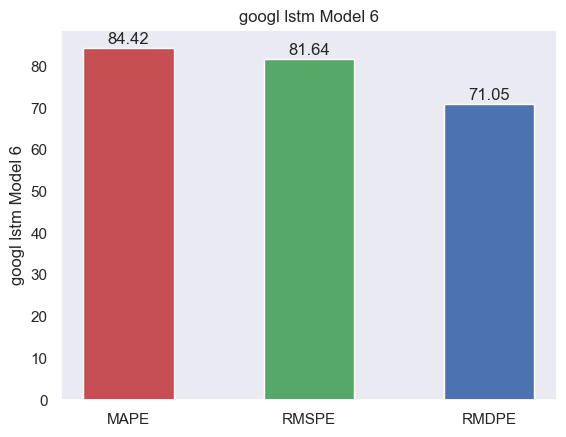

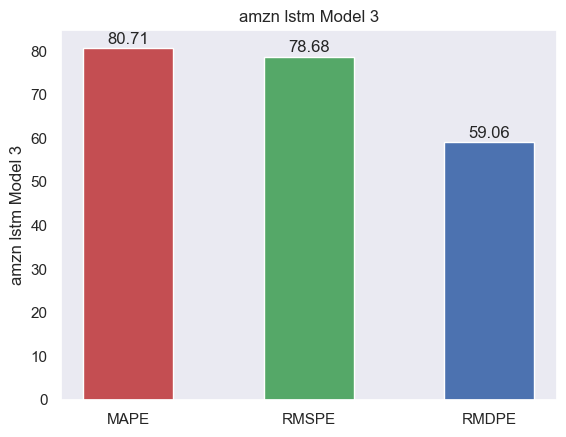

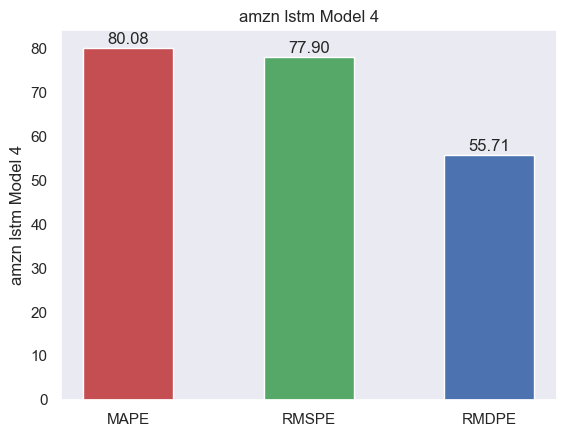

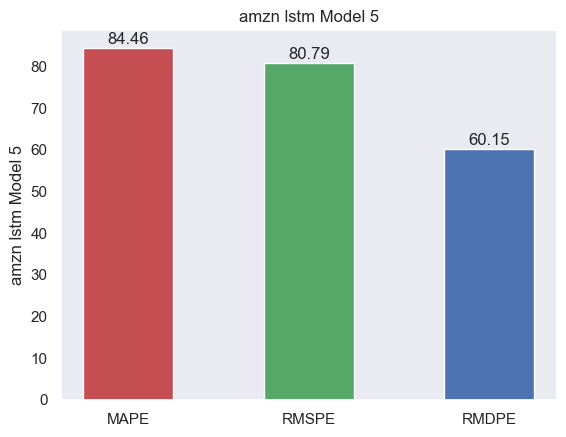

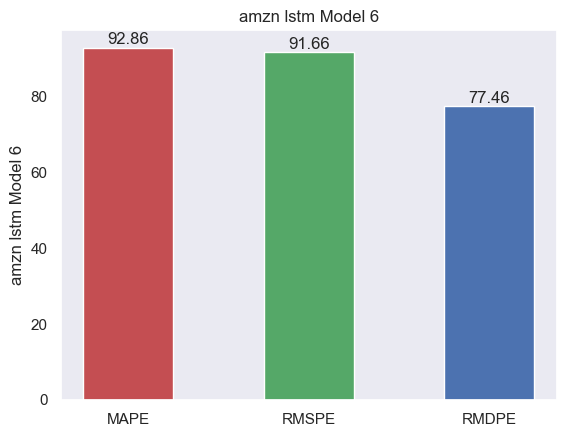

In [220]:
# Visualization accuracy model

#aapl
aapl_lstm_model3 = [accuracy_mape_aapl_model3_lstm,accuracy_rmspe_aapl_model3_lstm,accuracy_rmdpe_aapl_model3_lstm]
aapl_lstm_model4 = [accuracy_mape_aapl_model4_lstm,accuracy_rmspe_aapl_model4_lstm,accuracy_rmdpe_aapl_model4_lstm]
aapl_lstm_model5 = [accuracy_mape_aapl_model5_lstm,accuracy_rmspe_aapl_model5_lstm,accuracy_rmdpe_aapl_model5_lstm]
aapl_lstm_model6 = [accuracy_mape_aapl_model6_lstm,accuracy_rmspe_aapl_model6_lstm,accuracy_rmdpe_aapl_model6_lstm]

j = 1
colors = ['r','g','b']

plt.bar(['MAPE','RMSPE','RMDPE'], aapl_lstm_model3, width= 0.5, color=colors)
for i in range(len(aapl_lstm_model3)):
    plt.annotate('%.2f'%aapl_lstm_model3[i], (i, aapl_lstm_model3[i] + j),horizontalalignment='center')
plt.ylabel('aapl lstm Model 3')
plt.title('aapl lstm Model 3')
plt.show()

plt.bar(['MAPE','RMSPE','RMDPE'], aapl_lstm_model4, width= 0.5, color=colors)
for i in range(len(aapl_lstm_model4)):
    plt.annotate('%.2f'%aapl_lstm_model4[i], (i, aapl_lstm_model4[i] + j),horizontalalignment='center')
plt.ylabel('aapl lstm Model 4')
plt.title('aapl lstm Model 4')
plt.show()

plt.bar(['MAPE','RMSPE','RMDPE'], aapl_lstm_model5, width= 0.5, color=colors)
for i in range(len(aapl_lstm_model5)):
    plt.annotate('%.2f'%aapl_lstm_model5[i], (i, aapl_lstm_model5[i] + j),horizontalalignment='center')
plt.ylabel('aapl lstm Model 5')
plt.title('aapl lstm Model 5')
plt.show()

plt.bar(['MAPE','RMSPE','RMDPE'], aapl_lstm_model6, width= 0.5, color=colors)
for i in range(len(aapl_lstm_model6)):
    plt.annotate('%.2f'%aapl_lstm_model6[i], (i, aapl_lstm_model6[i] + j),horizontalalignment='center')
plt.ylabel('aapl lstm Model 6')
plt.title('aapl lstm Model 6')
plt.show()

#msft
msft_lstm_model3 = [accuracy_mape_msft_model3_lstm,accuracy_rmspe_msft_model3_lstm,accuracy_rmdpe_msft_model3_lstm]
msft_lstm_model4 = [accuracy_mape_msft_model4_lstm,accuracy_rmspe_msft_model4_lstm,accuracy_rmdpe_msft_model4_lstm]
msft_lstm_model5 = [accuracy_mape_msft_model5_lstm,accuracy_rmspe_msft_model5_lstm,accuracy_rmdpe_msft_model5_lstm]
msft_lstm_model6 = [accuracy_mape_msft_model6_lstm,accuracy_rmspe_msft_model6_lstm,accuracy_rmdpe_msft_model6_lstm]

j = 1
plt.bar(['MAPE','RMSPE','RMDPE'], msft_lstm_model3, width= 0.5, color=colors)
for i in range(len(msft_lstm_model3)):
    plt.annotate('%.2f'%msft_lstm_model3[i], (i, msft_lstm_model3[i] + j),horizontalalignment='center')
plt.ylabel('msft lstm Model 3')
plt.title('msft lstm Model 3')
plt.show()

plt.bar(['MAPE','RMSPE','RMDPE'], msft_lstm_model4, width= 0.5, color=colors)
for i in range(len(msft_lstm_model4)):
    plt.annotate('%.2f'%msft_lstm_model4[i], (i, msft_lstm_model4[i] + j),horizontalalignment='center')
plt.ylabel('msft lstm Model 4')
plt.title('msft lstm Model 4')
plt.show()

plt.bar(['MAPE','RMSPE','RMDPE'], msft_lstm_model5, width= 0.5, color=colors)
for i in range(len(msft_lstm_model5)):
    plt.annotate('%.2f'%msft_lstm_model5[i], (i, msft_lstm_model5[i] + j),horizontalalignment='center')
plt.ylabel('msft lstm Model 5')
plt.title('msft lstm Model 5')
plt.show()

plt.bar(['MAPE','RMSPE','RMDPE'], msft_lstm_model6, width= 0.5, color=colors)
for i in range(len(msft_lstm_model6)):
    plt.annotate('%.2f'%msft_lstm_model6[i], (i, msft_lstm_model6[i] + j),horizontalalignment='center')
plt.ylabel('msft lstm Model 6')
plt.title('msft lstm Model 6')
plt.show()

#googl
googl_lstm_model3 = [accuracy_mape_googl_model3_lstm,accuracy_rmspe_googl_model3_lstm,accuracy_rmdpe_googl_model3_lstm]
googl_lstm_model4 = [accuracy_mape_googl_model4_lstm,accuracy_rmspe_googl_model4_lstm,accuracy_rmdpe_googl_model4_lstm]
googl_lstm_model5 = [accuracy_mape_googl_model5_lstm,accuracy_rmspe_googl_model5_lstm,accuracy_rmdpe_googl_model5_lstm]
googl_lstm_model6 = [accuracy_mape_googl_model6_lstm,accuracy_rmspe_googl_model6_lstm,accuracy_rmdpe_googl_model6_lstm]

j = 1
plt.bar(['MAPE','RMSPE','RMDPE'], googl_lstm_model3, width= 0.5, color=colors)
for i in range(len(googl_lstm_model3)):
    plt.annotate('%.2f'%googl_lstm_model3[i], (i, googl_lstm_model3[i] + j),horizontalalignment='center')
plt.ylabel('googl lstm Model 3')
plt.title('googl lstm Model 3')
plt.show()

plt.bar(['MAPE','RMSPE','RMDPE'], googl_lstm_model4, width= 0.5, color=colors)
for i in range(len(googl_lstm_model4)):
    plt.annotate('%.2f'%googl_lstm_model4[i], (i, googl_lstm_model4[i] + j),horizontalalignment='center')
plt.ylabel('googl lstm Model 4')
plt.title('googl lstm Model 4')
plt.show()

plt.bar(['MAPE','RMSPE','RMDPE'], googl_lstm_model5, width= 0.5, color=colors)
for i in range(len(googl_lstm_model5)):
    plt.annotate('%.2f'%googl_lstm_model5[i], (i, googl_lstm_model5[i] + j),horizontalalignment='center')
plt.ylabel('googl lstm Model 5')
plt.title('googl lstm Model 5')
plt.show()

plt.bar(['MAPE','RMSPE','RMDPE'], googl_lstm_model6, width= 0.5, color=colors)
for i in range(len(googl_lstm_model6)):
    plt.annotate('%.2f'%googl_lstm_model6[i], (i, googl_lstm_model6[i] + j),horizontalalignment='center')
plt.ylabel('googl lstm Model 6')
plt.title('googl lstm Model 6')
plt.show()

#amzn
amzn_lstm_model3 = [accuracy_mape_amzn_model3_lstm,accuracy_rmspe_amzn_model3_lstm,accuracy_rmdpe_amzn_model3_lstm]
amzn_lstm_model4 = [accuracy_mape_amzn_model4_lstm,accuracy_rmspe_amzn_model4_lstm,accuracy_rmdpe_amzn_model4_lstm]
amzn_lstm_model5 = [accuracy_mape_amzn_model5_lstm,accuracy_rmspe_amzn_model5_lstm,accuracy_rmdpe_amzn_model5_lstm]
amzn_lstm_model6 = [accuracy_mape_amzn_model6_lstm,accuracy_rmspe_amzn_model6_lstm,accuracy_rmdpe_amzn_model6_lstm]

j = 1
plt.bar(['MAPE','RMSPE','RMDPE'], amzn_lstm_model3, width= 0.5, color=colors)
for i in range(len(amzn_lstm_model3)):
    plt.annotate('%.2f'%amzn_lstm_model3[i], (i, amzn_lstm_model3[i] + j),horizontalalignment='center')
plt.ylabel('amzn lstm Model 3')
plt.title('amzn lstm Model 3')
plt.show()

plt.bar(['MAPE','RMSPE','RMDPE'], amzn_lstm_model4, width= 0.5, color=colors)
for i in range(len(amzn_lstm_model4)):
    plt.annotate('%.2f'%amzn_lstm_model4[i], (i, amzn_lstm_model4[i] + j),horizontalalignment='center')
plt.ylabel('amzn lstm Model 4')
plt.title('amzn lstm Model 4')
plt.show()

plt.bar(['MAPE','RMSPE','RMDPE'], amzn_lstm_model5, width= 0.5, color=colors)
for i in range(len(amzn_lstm_model5)):
    plt.annotate('%.2f'%amzn_lstm_model5[i], (i, amzn_lstm_model5[i] + j),horizontalalignment='center')
plt.ylabel('amzn lstm Model 5')
plt.title('amzn lstm Model 5')
plt.show()

plt.bar(['MAPE','RMSPE','RMDPE'], amzn_lstm_model6, width= 0.5, color=colors)
for i in range(len(amzn_lstm_model6)):
    plt.annotate('%.2f'%amzn_lstm_model6[i], (i, amzn_lstm_model6[i] + j),horizontalalignment='center')
plt.ylabel('amzn lstm Model 6')
plt.title('amzn lstm Model 6')
plt.show()

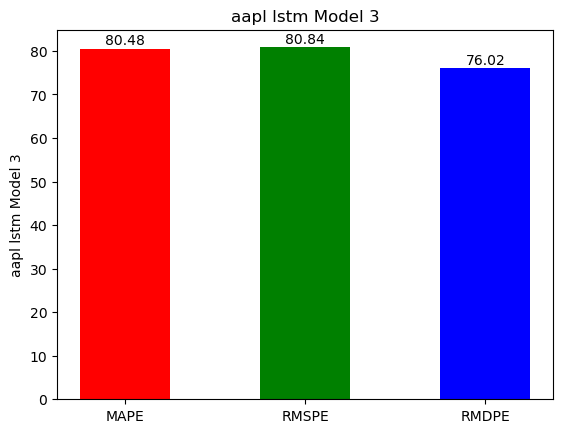

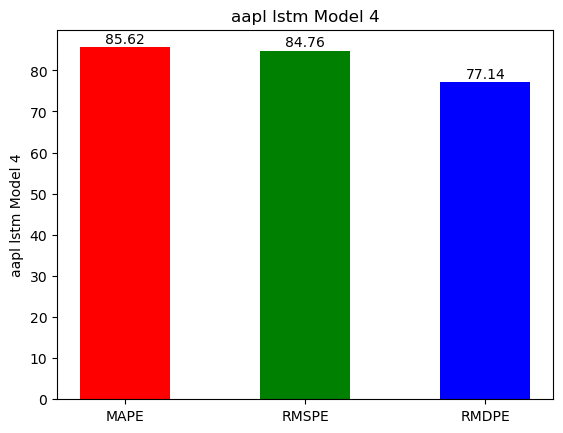

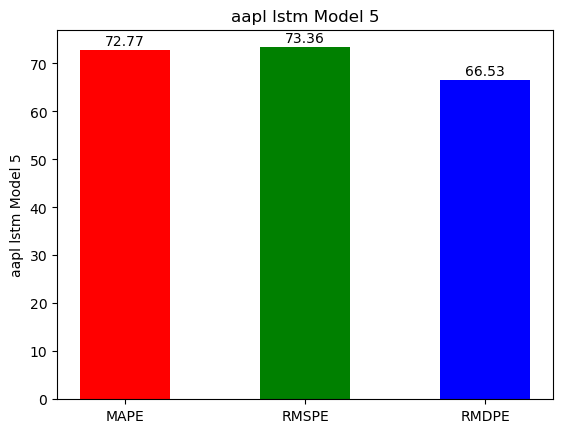

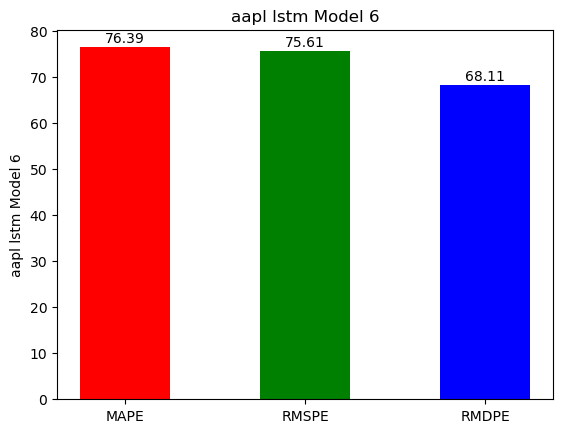

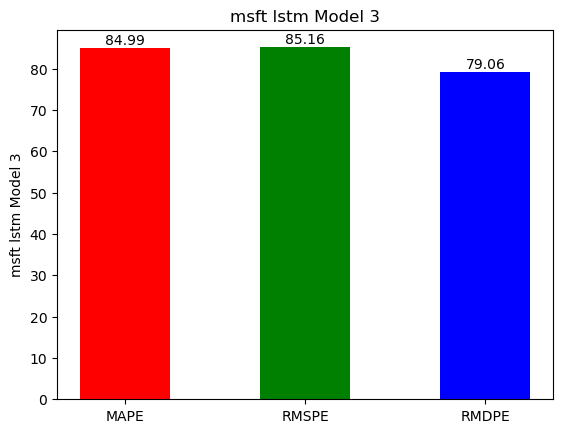

...

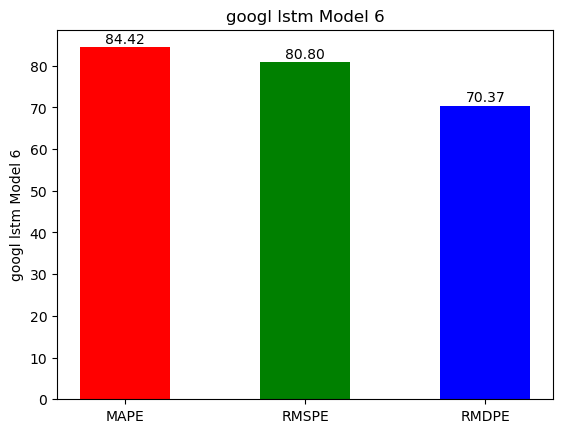

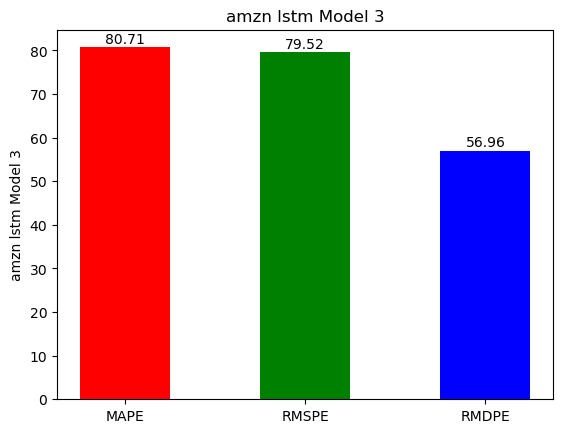

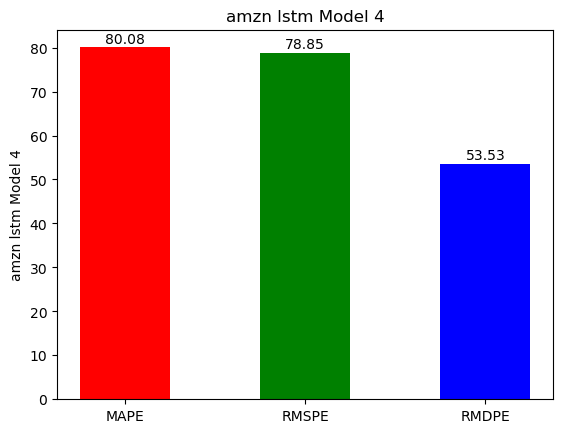

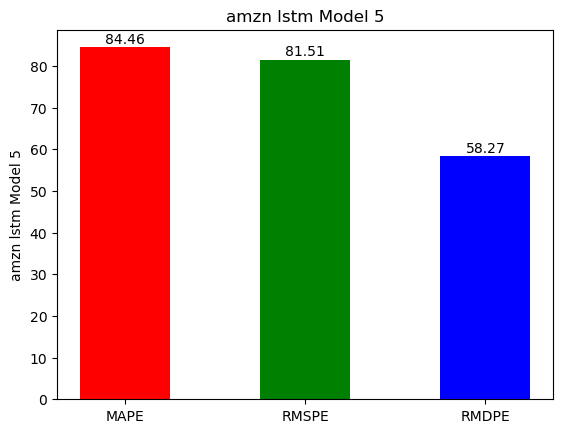

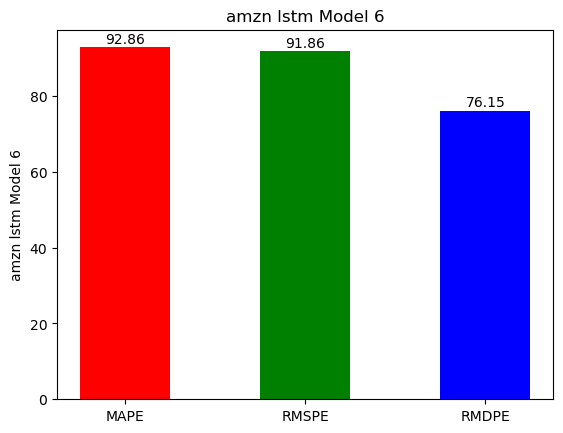

In [179]:
import matplotlib.pyplot as plt
import numpy as np

def plot_accuracy_bar(stock_name, model_name, accuracy_values):
    j = 1
    colors = ['r', 'g', 'b']

    plt.bar(['MAPE', 'RMSPE', 'RMDPE'], accuracy_values, width=0.5, color=colors)
    for i in range(len(accuracy_values)):
        plt.annotate('%.2f' % accuracy_values[i], (i, accuracy_values[i] + j), horizontalalignment='center')

    plt.ylabel(f'{stock_name} lstm {model_name}')
    plt.title(f'{stock_name} lstm {model_name}')
    plt.show()

# Visualization accuracy model

# AAPL
plot_accuracy_bar('aapl', 'Model 3', [accuracy_mape_aapl_model3_lstm, accuracy_rmspe_aapl_model3_lstm, accuracy_rmdpe_aapl_model3_lstm])
plot_accuracy_bar('aapl', 'Model 4', [accuracy_mape_aapl_model4_lstm, accuracy_rmspe_aapl_model4_lstm, accuracy_rmdpe_aapl_model4_lstm])
plot_accuracy_bar('aapl', 'Model 5', [accuracy_mape_aapl_model5_lstm, accuracy_rmspe_aapl_model5_lstm, accuracy_rmdpe_aapl_model5_lstm])
plot_accuracy_bar('aapl', 'Model 6', [accuracy_mape_aapl_model6_lstm, accuracy_rmspe_aapl_model6_lstm, accuracy_rmdpe_aapl_model6_lstm])

# MSFT
plot_accuracy_bar('msft', 'Model 3', [accuracy_mape_msft_model3_lstm, accuracy_rmspe_msft_model3_lstm, accuracy_rmdpe_msft_model3_lstm])
plot_accuracy_bar('msft', 'Model 4', [accuracy_mape_msft_model4_lstm, accuracy_rmspe_msft_model4_lstm, accuracy_rmdpe_msft_model4_lstm])
plot_accuracy_bar('msft', 'Model 5', [accuracy_mape_msft_model5_lstm, accuracy_rmspe_msft_model5_lstm, accuracy_rmdpe_msft_model5_lstm])
plot_accuracy_bar('msft', 'Model 6', [accuracy_mape_msft_model6_lstm, accuracy_rmspe_msft_model6_lstm, accuracy_rmdpe_msft_model6_lstm])

# GOOGL
plot_accuracy_bar('googl', 'Model 3', [accuracy_mape_googl_model3_lstm, accuracy_rmspe_googl_model3_lstm, accuracy_rmdpe_googl_model3_lstm])
plot_accuracy_bar('googl', 'Model 4', [accuracy_mape_googl_model4_lstm, accuracy_rmspe_googl_model4_lstm, accuracy_rmdpe_googl_model4_lstm])
plot_accuracy_bar('googl', 'Model 5', [accuracy_mape_googl_model5_lstm, accuracy_rmspe_googl_model5_lstm, accuracy_rmdpe_googl_model5_lstm])
plot_accuracy_bar('googl', 'Model 6', [accuracy_mape_googl_model6_lstm, accuracy_rmspe_googl_model6_lstm, accuracy_rmdpe_googl_model6_lstm])

# AMZN
plot_accuracy_bar('amzn', 'Model 3', [accuracy_mape_amzn_model3_lstm, accuracy_rmspe_amzn_model3_lstm, accuracy_rmdpe_amzn_model3_lstm])
plot_accuracy_bar('amzn', 'Model 4', [accuracy_mape_amzn_model4_lstm, accuracy_rmspe_amzn_model4_lstm, accuracy_rmdpe_amzn_model4_lstm])
plot_accuracy_bar('amzn', 'Model 5', [accuracy_mape_amzn_model5_lstm, accuracy_rmspe_amzn_model5_lstm, accuracy_rmdpe_amzn_model5_lstm])
plot_accuracy_bar('amzn', 'Model 6', [accuracy_mape_amzn_model6_lstm, accuracy_rmspe_amzn_model6_lstm, accuracy_rmdpe_amzn_model6_lstm])


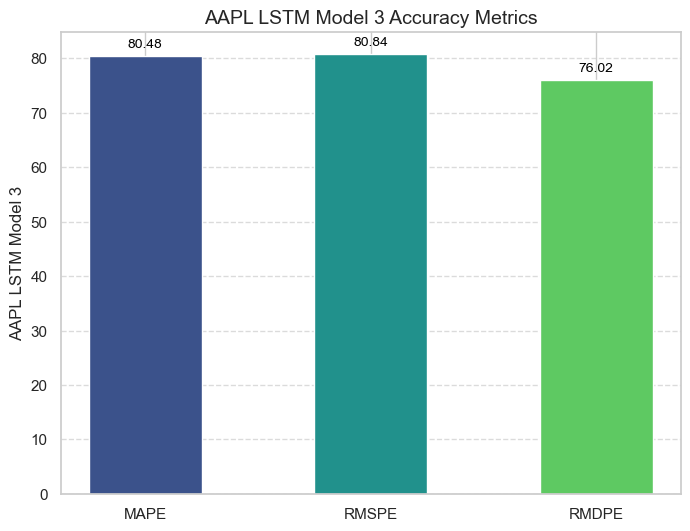

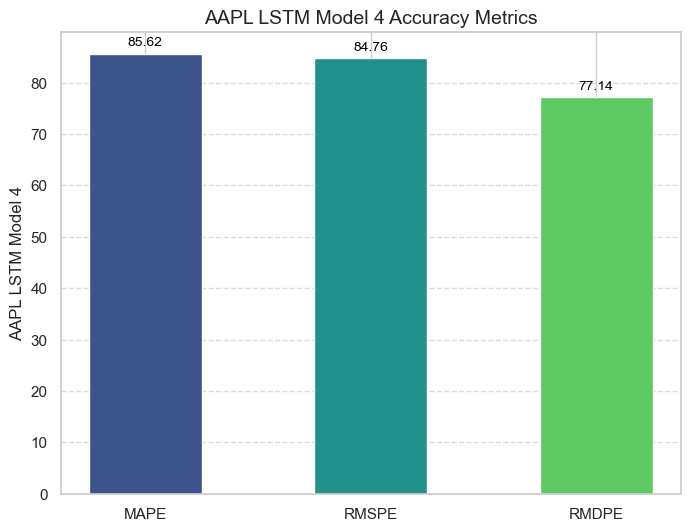

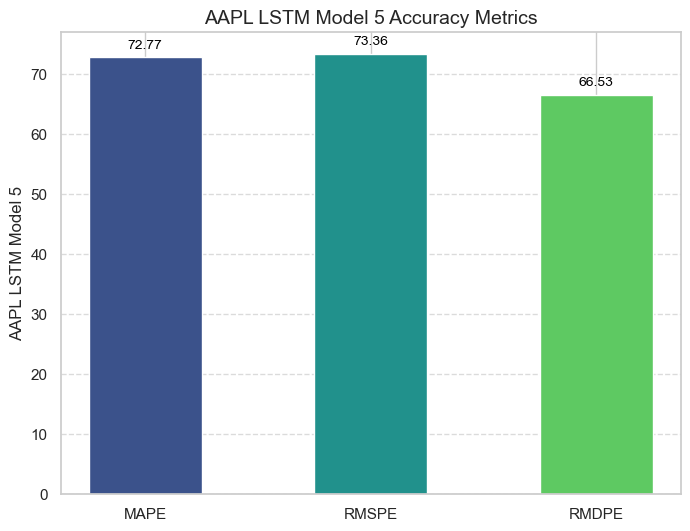

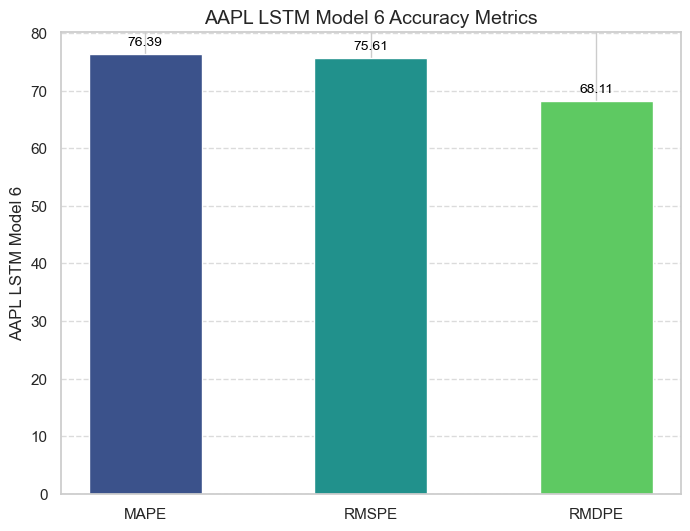

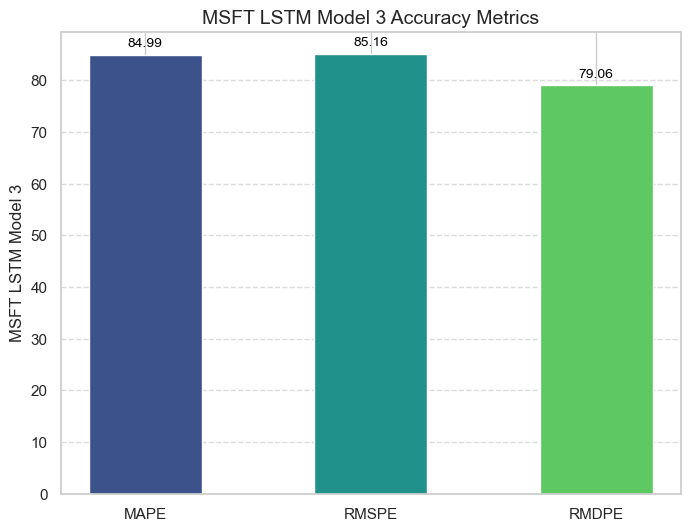

...

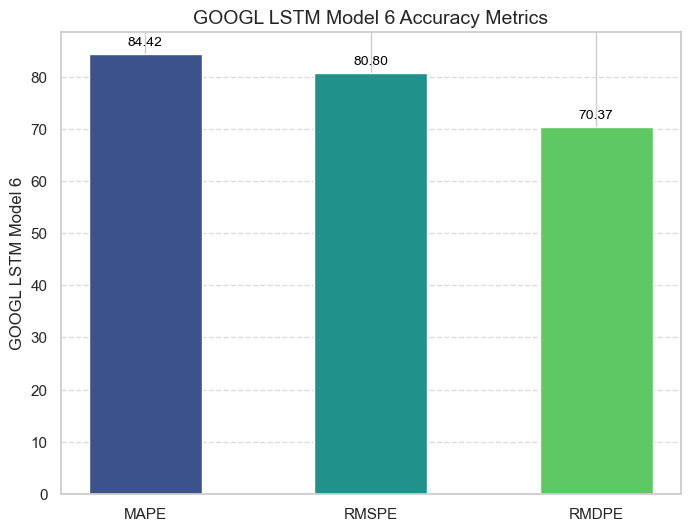

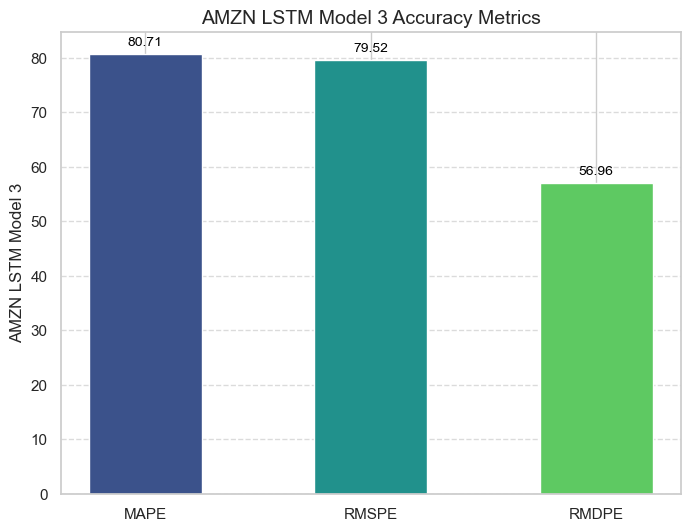

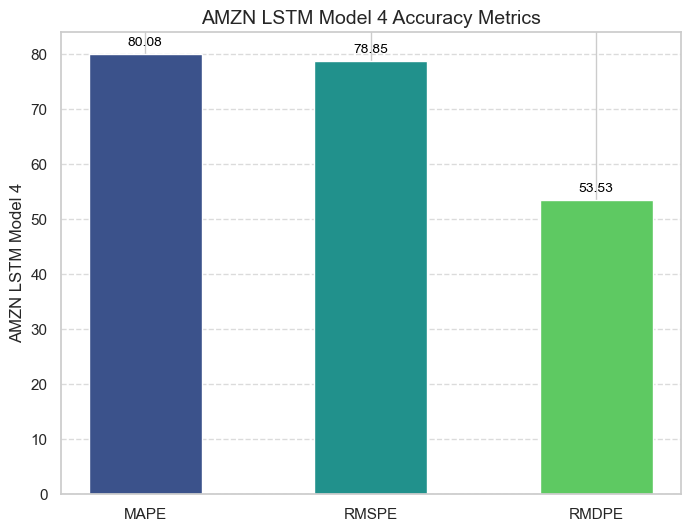

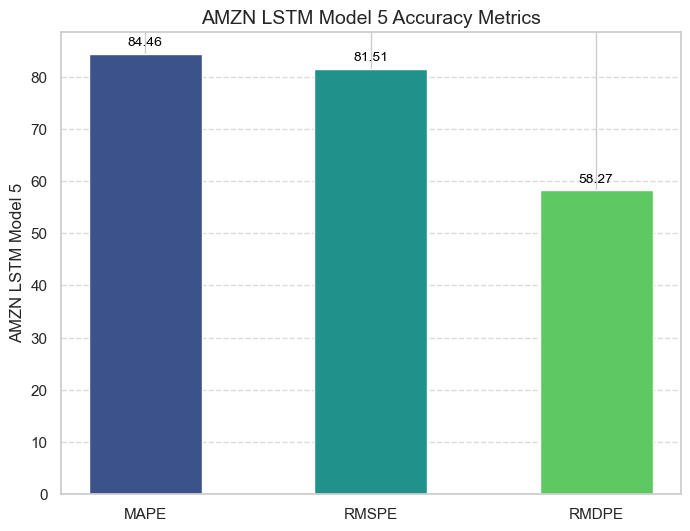

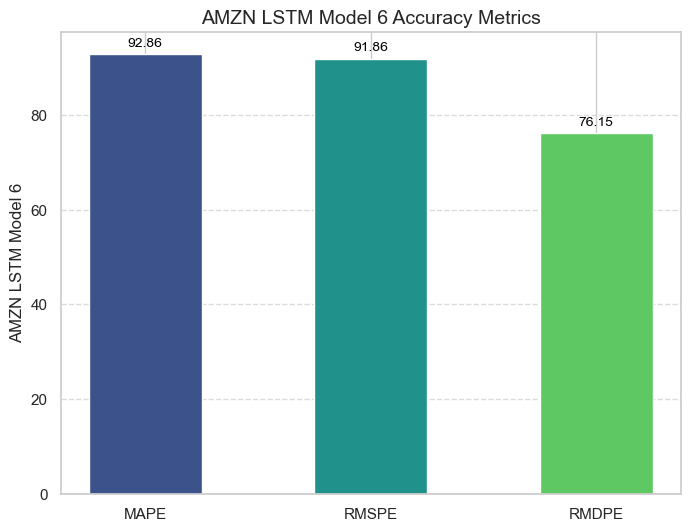

In [180]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Set Seaborn style
sns.set(style="whitegrid")

def plot_accuracy_bar(stock_name, model_name, accuracy_values):
    j = 1
    colors = sns.color_palette("viridis", len(accuracy_values))

    # Set figure size
    plt.figure(figsize=(8, 6))

    plt.bar(['MAPE', 'RMSPE', 'RMDPE'], accuracy_values, width=0.5, color=colors)
    for i in range(len(accuracy_values)):
        plt.text(i, accuracy_values[i] + j, f'{accuracy_values[i]:.2f}', ha='center', va='bottom', fontsize=10, color='black')

    plt.ylabel(f'{stock_name} LSTM {model_name}', fontsize=12)
    plt.title(f'{stock_name} LSTM {model_name} Accuracy Metrics', fontsize=14)

    # Add grid lines
    plt.grid(axis='y', linestyle='--', alpha=0.7)

    # Show plot
    plt.show()

# Visualization accuracy model

# AAPL
plot_accuracy_bar('AAPL', 'Model 3', [accuracy_mape_aapl_model3_lstm, accuracy_rmspe_aapl_model3_lstm, accuracy_rmdpe_aapl_model3_lstm])
plot_accuracy_bar('AAPL', 'Model 4', [accuracy_mape_aapl_model4_lstm, accuracy_rmspe_aapl_model4_lstm, accuracy_rmdpe_aapl_model4_lstm])
plot_accuracy_bar('AAPL', 'Model 5', [accuracy_mape_aapl_model5_lstm, accuracy_rmspe_aapl_model5_lstm, accuracy_rmdpe_aapl_model5_lstm])
plot_accuracy_bar('AAPL', 'Model 6', [accuracy_mape_aapl_model6_lstm, accuracy_rmspe_aapl_model6_lstm, accuracy_rmdpe_aapl_model6_lstm])

# MSFT
plot_accuracy_bar('MSFT', 'Model 3', [accuracy_mape_msft_model3_lstm, accuracy_rmspe_msft_model3_lstm, accuracy_rmdpe_msft_model3_lstm])
plot_accuracy_bar('MSFT', 'Model 4', [accuracy_mape_msft_model4_lstm, accuracy_rmspe_msft_model4_lstm, accuracy_rmdpe_msft_model4_lstm])
plot_accuracy_bar('MSFT', 'Model 5', [accuracy_mape_msft_model5_lstm, accuracy_rmspe_msft_model5_lstm, accuracy_rmdpe_msft_model5_lstm])
plot_accuracy_bar('MSFT', 'Model 6', [accuracy_mape_msft_model6_lstm, accuracy_rmspe_msft_model6_lstm, accuracy_rmdpe_msft_model6_lstm])

# GOOGL
plot_accuracy_bar('GOOGL', 'Model 3', [accuracy_mape_googl_model3_lstm, accuracy_rmspe_googl_model3_lstm, accuracy_rmdpe_googl_model3_lstm])
plot_accuracy_bar('GOOGL', 'Model 4', [accuracy_mape_googl_model4_lstm, accuracy_rmspe_googl_model4_lstm, accuracy_rmdpe_googl_model4_lstm])
plot_accuracy_bar('GOOGL', 'Model 5', [accuracy_mape_googl_model5_lstm, accuracy_rmspe_googl_model5_lstm, accuracy_rmdpe_googl_model5_lstm])
plot_accuracy_bar('GOOGL', 'Model 6', [accuracy_mape_googl_model6_lstm, accuracy_rmspe_googl_model6_lstm, accuracy_rmdpe_googl_model6_lstm])

# AMZN
plot_accuracy_bar('AMZN', 'Model 3', [accuracy_mape_amzn_model3_lstm, accuracy_rmspe_amzn_model3_lstm, accuracy_rmdpe_amzn_model3_lstm])
plot_accuracy_bar('AMZN', 'Model 4', [accuracy_mape_amzn_model4_lstm, accuracy_rmspe_amzn_model4_lstm, accuracy_rmdpe_amzn_model4_lstm])
plot_accuracy_bar('AMZN', 'Model 5', [accuracy_mape_amzn_model5_lstm, accuracy_rmspe_amzn_model5_lstm, accuracy_rmdpe_amzn_model5_lstm])
plot_accuracy_bar('AMZN', 'Model 6', [accuracy_mape_amzn_model6_lstm, accuracy_rmspe_amzn_model6_lstm, accuracy_rmdpe_amzn_model6_lstm])


In [181]:
pip install plotly


Note: you may need to restart the kernel to use updated packages.


In [183]:
import plotly.graph_objects as go
import numpy as np

def plot_accuracy_bar(stock_name, model_name, accuracy_values):
    colors = ['rgb(155, 0, 0)', 'rgb(0, 155, 0)', 'rgb(0, 0, 155)']

    # Create bar chart
    fig = go.Figure(data=[
        go.Bar(x=['MAPE', 'RMSPE', 'RMDPE'], y=accuracy_values, marker_color=colors)
    ])

    # Add accuracy values on top of bars
    for i, value in enumerate(accuracy_values):
        fig.add_annotation(
            x=i,
            y=value,
            text=f'{value:.2f}',
            showarrow=True,
            arrowhead=5,
            arrowcolor='black',
            arrowsize=1,
            arrowwidth=2,
            ax=0,
            ay=-30
        )

    # Update layout
    fig.update_layout(
        title=f'{stock_name} LSTM {model_name} Accuracy Metrics',
        xaxis_title='Metrics',
        yaxis_title=f'{stock_name} LSTM {model_name}',
        barmode='group',
        bargap=0.15,
        showlegend=False
    )

    # Show plot
    fig.show()

# Visualization accuracy model

# AAPL
plot_accuracy_bar('AAPL', 'Model 3', [accuracy_mape_aapl_model3_lstm, accuracy_rmspe_aapl_model3_lstm, accuracy_rmdpe_aapl_model3_lstm])
plot_accuracy_bar('AAPL', 'Model 4', [accuracy_mape_aapl_model4_lstm, accuracy_rmspe_aapl_model4_lstm, accuracy_rmdpe_aapl_model4_lstm])
plot_accuracy_bar('AAPL', 'Model 5', [accuracy_mape_aapl_model5_lstm, accuracy_rmspe_aapl_model5_lstm, accuracy_rmdpe_aapl_model5_lstm])
plot_accuracy_bar('AAPL', 'Model 6', [accuracy_mape_aapl_model6_lstm, accuracy_rmspe_aapl_model6_lstm, accuracy_rmdpe_aapl_model6_lstm])

# MSFT
plot_accuracy_bar('MSFT', 'Model 3', [accuracy_mape_msft_model3_lstm, accuracy_rmspe_msft_model3_lstm, accuracy_rmdpe_msft_model3_lstm])
plot_accuracy_bar('MSFT', 'Model 4', [accuracy_mape_msft_model4_lstm, accuracy_rmspe_msft_model4_lstm, accuracy_rmdpe_msft_model4_lstm])
plot_accuracy_bar('MSFT', 'Model 5', [accuracy_mape_msft_model5_lstm, accuracy_rmspe_msft_model5_lstm, accuracy_rmdpe_msft_model5_lstm])
plot_accuracy_bar('MSFT', 'Model 6', [accuracy_mape_msft_model6_lstm, accuracy_rmspe_msft_model6_lstm, accuracy_rmdpe_msft_model6_lstm])

# GOOGL
plot_accuracy_bar('GOOGL', 'Model 3', [accuracy_mape_googl_model3_lstm, accuracy_rmspe_googl_model3_lstm, accuracy_rmdpe_googl_model3_lstm])
plot_accuracy_bar('GOOGL', 'Model 4', [accuracy_mape_googl_model4_lstm, accuracy_rmspe_googl_model4_lstm, accuracy_rmdpe_googl_model4_lstm])
plot_accuracy_bar('GOOGL', 'Model 5', [accuracy_mape_googl_model5_lstm, accuracy_rmspe_googl_model5_lstm, accuracy_rmdpe_googl_model5_lstm])
plot_accuracy_bar('GOOGL', 'Model 6', [accuracy_mape_googl_model6_lstm, accuracy_rmspe_googl_model6_lstm, accuracy_rmdpe_googl_model6_lstm])

# AMZN
plot_accuracy_bar('AMZN', 'Model 3', [accuracy_mape_amzn_model3_lstm, accuracy_rmspe_amzn_model3_lstm, accuracy_rmdpe_amzn_model3_lstm])
plot_accuracy_bar('AMZN', 'Model 4', [accuracy_mape_amzn_model4_lstm, accuracy_rmspe_amzn_model4_lstm, accuracy_rmdpe_amzn_model4_lstm])
plot_accuracy_bar('AMZN', 'Model 5', [accuracy_mape_amzn_model5_lstm, accuracy_rmspe_amzn_model5_lstm, accuracy_rmdpe_amzn_model5_lstm])
plot_accuracy_bar('AMZN', 'Model 6', [accuracy_mape_amzn_model6_lstm, accuracy_rmspe_amzn_model6_lstm, accuracy_rmdpe_amzn_model6_lstm])
